In [ ]:
!pip install tensorflow_addons

In [ ]:
# Importing Libraries
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense, Flatten, BatchNormalization, Activation, ZeroPadding2D, LeakyReLU, UpSampling2D, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import Accuracy
from tensorflow_addons.metrics import MeanMetricWrapper
from skimage.metrics import structural_similarity as ssim
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Loading and Preprocessing Images
images_path = '/content/CNVM'
images = []
for filename in os.listdir(images_path):
    img_path = os.path.join(images_path, filename)
    try:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Unable to load image: {img_path}")
            continue

        if img.shape[0] == 0 or img.shape[1] == 0:
            print(f"Invalid dimensions for image: {img_path}")
            continue

        img = cv2.resize(img, (32, 32))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img.astype('float32') / 255.0
        images.append(img)
    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
x_train = np.array(images)

In [ ]:
# Defining Loss Functions
def hybrid_loss(real_images, generated_images):
    # Adversarial Loss
    adversarial_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    adversarial_loss_real = adversarial_loss(tf.ones_like(real_images), real_images)
    adversarial_loss_generated = adversarial_loss(tf.ones_like(generated_images), generated_images)
    adversarial_loss = (adversarial_loss_real + adversarial_loss_generated)

    # Anomaly Loss
    anomaly_loss = tf.reduce_mean(tf.square(real_images - generated_images))

    # Structural Similarity Loss
    ss = []
    for i in x_train:
        ssim_loss = ssim(fake[0],i, multichannel=True, full=True)[0]
        ss.append(ssim_loss)

    total_loss = adversarial_loss + (1 - np.max(ss))+ anomaly_loss

    return total_loss

In [ ]:
# Building Generator
def build_generator(latent_dim):
  model = Sequential()
  n_nodes = 128*8*8
  model.add(Dense(n_nodes, input_dim=latent_dim))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Reshape((8, 8, 128)))

  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(3, (8,8), activation='tanh', padding='same'))
  return model

In [ ]:
# Building Discriminator
def build_discriminator(in_shape=(32,32,3)):
  model = Sequential()
  model.add(Conv2D(128, (3,3), strides=(2,2), padding='same', input_shape=in_shape))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Flatten())
  model.add(Dropout (0.4))
  model.add(Dense(1, activation='sigmoid'))

  return model

In [ ]:
# Compile discriminator model
discriminator = build_discriminator(x_train[0].shape)
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])

In [ ]:
# Compile generator model
generator = build_generator(128)

# Combined model
z = Input(shape=(128,))
img = generator(z)
discriminator.trainable = False
fake_pred = discriminator(img)
combined_model_gen = Model(z, fake_pred)
combined_model_gen.compile(optimizer=Adam(0.0002, 0.5), loss=lambda y_true, y_pred: hybrid_loss(y_true, y_pred))

In [ ]:
os.makedirs('gan_images', exist_ok=True)
def sample_images(epoch):
  rows, cols = 5, 5
  noise = np.random.randn(rows * cols, latent_dim)
  imgs = generator.predict(noise)
  # Rescale images 0 - 1
  imgs = 0.5 * imgs + 0.5
  fig, axs = plt.subplots(rows, cols)  #fig to plot img and axis to store
  idx = 0
  for i in range(rows):
    for j in range(cols):
      axs[i,j].imshow(imgs[idx].reshape(32,32,3), cmap='gray')
      axs[i,j].axis('off')
      idx += 1
  fig.savefig(f"gan_images/GAN_Generated_{epoch}.png")
  plt.close()

1/1 [==============================] - 0s 101ms/step
epoch: 1/20000, d_loss: 0.68, g_loss: 2.20
1/1 [==============================] - 0s 18ms/step


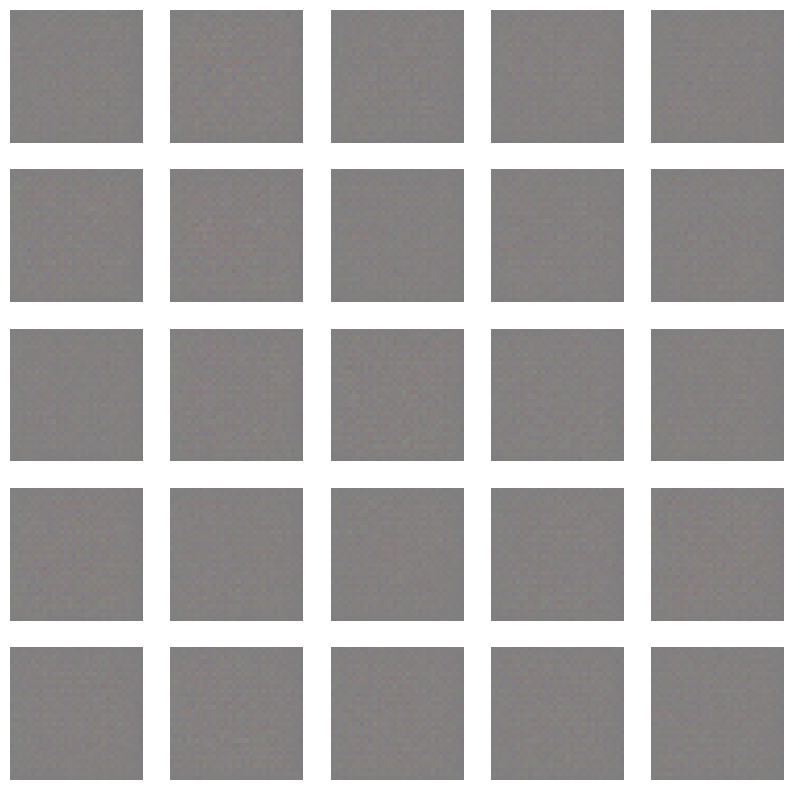

1/1 [==============================] - 0s 19ms/step
epoch: 101/20000, d_loss: 0.68, g_loss: 2.73
1/1 [==============================] - 0s 17ms/step
epoch: 201/20000, d_loss: 0.75, g_loss: 2.38
1/1 [==============================] - 0s 18ms/step


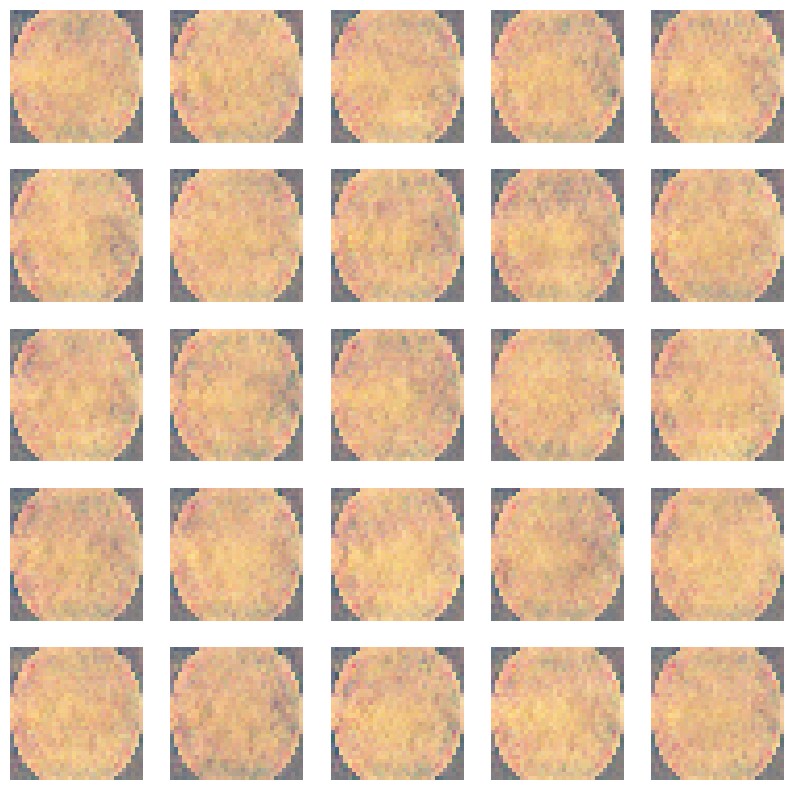

1/1 [==============================] - 0s 20ms/step
epoch: 301/20000, d_loss: 0.72, g_loss: 2.29
1/1 [==============================] - 0s 18ms/step
epoch: 401/20000, d_loss: 0.71, g_loss: 2.23
1/1 [==============================] - 0s 20ms/step


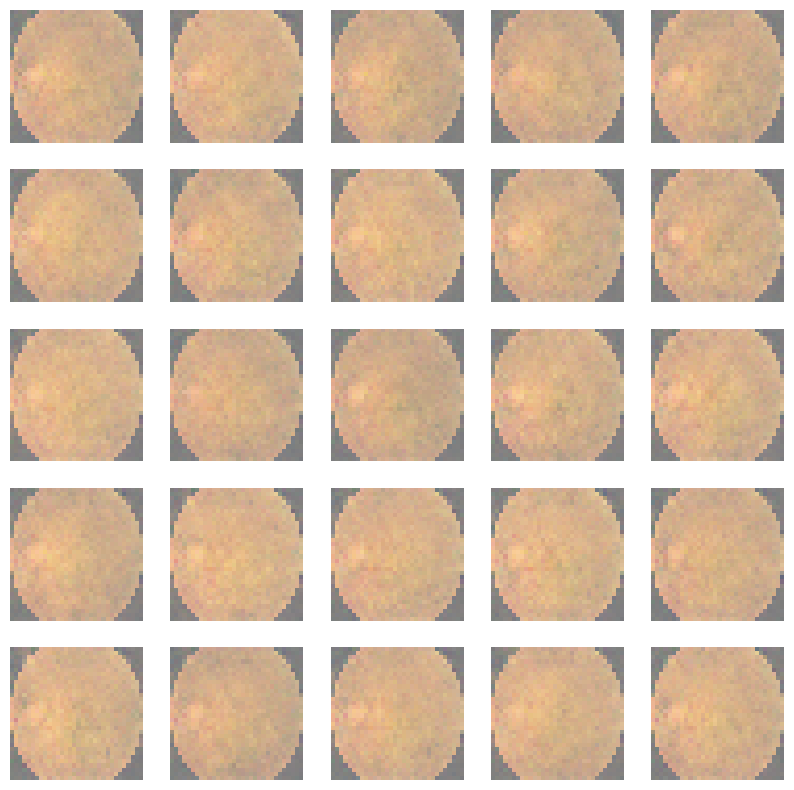

1/1 [==============================] - 0s 16ms/step
epoch: 501/20000, d_loss: 0.70, g_loss: 2.26
1/1 [==============================] - 0s 18ms/step
epoch: 601/20000, d_loss: 0.69, g_loss: 2.23
1/1 [==============================] - 0s 19ms/step


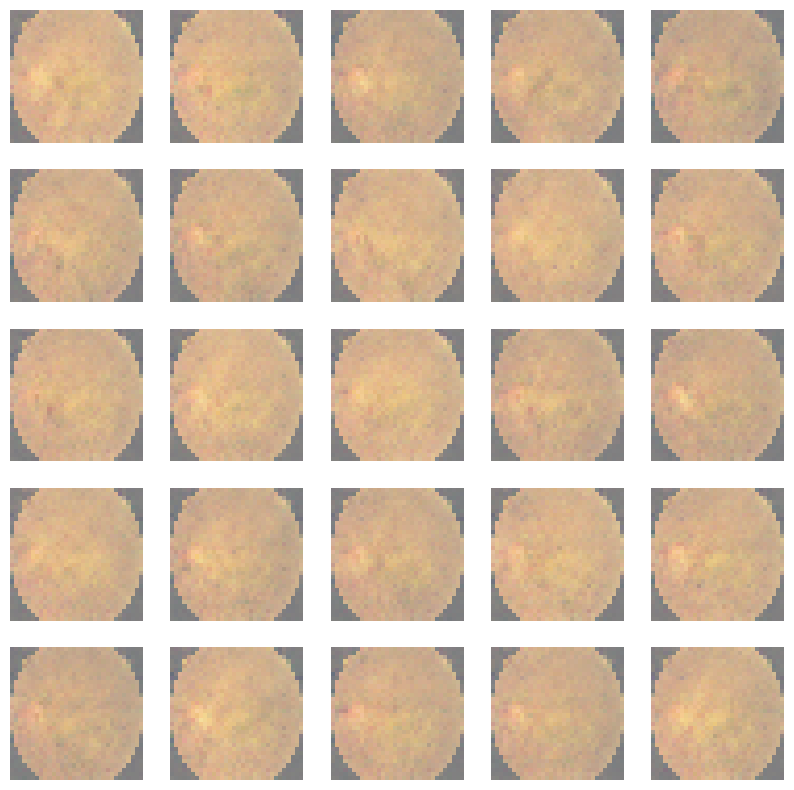

1/1 [==============================] - 0s 17ms/step
epoch: 701/20000, d_loss: 0.69, g_loss: 2.25
1/1 [==============================] - 0s 16ms/step
epoch: 801/20000, d_loss: 0.67, g_loss: 2.26
1/1 [==============================] - 0s 20ms/step


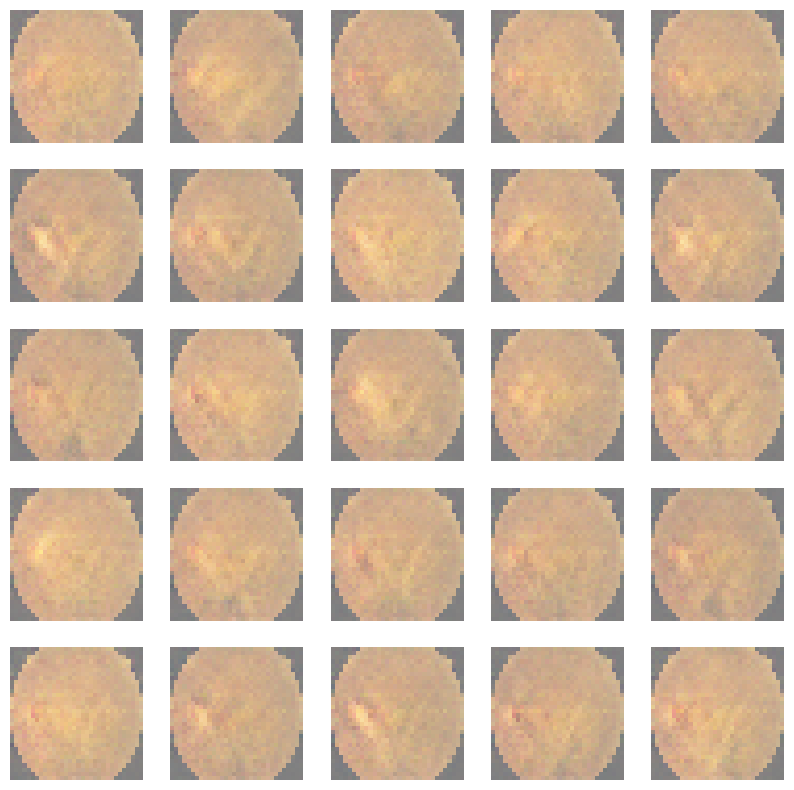

1/1 [==============================] - 0s 17ms/step
epoch: 901/20000, d_loss: 0.68, g_loss: 2.25
1/1 [==============================] - 0s 17ms/step
epoch: 1001/20000, d_loss: 0.69, g_loss: 2.24
1/1 [==============================] - 0s 19ms/step


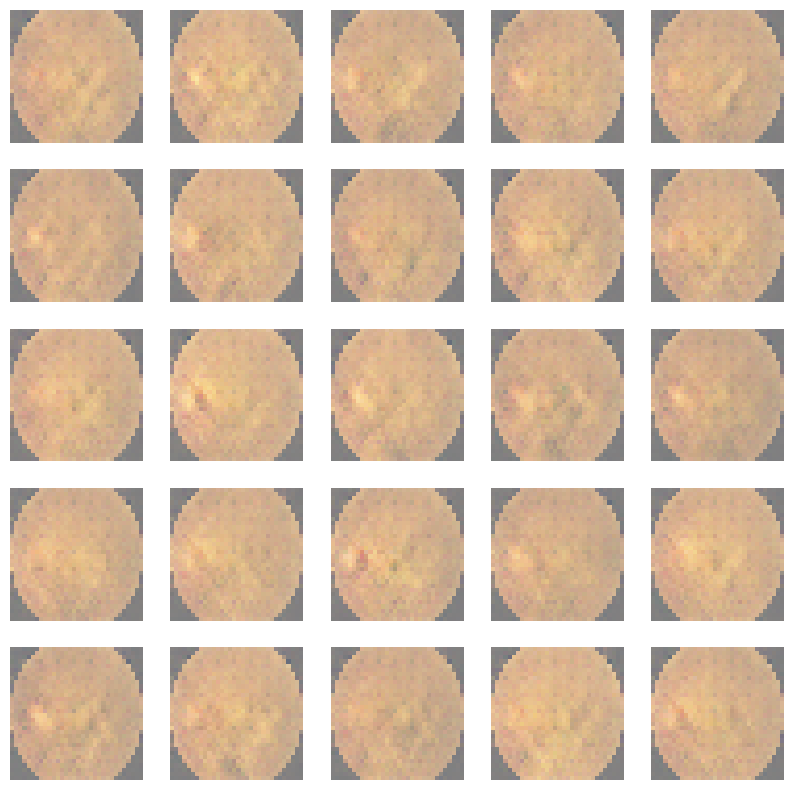

1/1 [==============================] - 0s 33ms/step
epoch: 1101/20000, d_loss: 0.67, g_loss: 2.25
1/1 [==============================] - 0s 17ms/step
epoch: 1201/20000, d_loss: 0.67, g_loss: 2.28
1/1 [==============================] - 0s 18ms/step


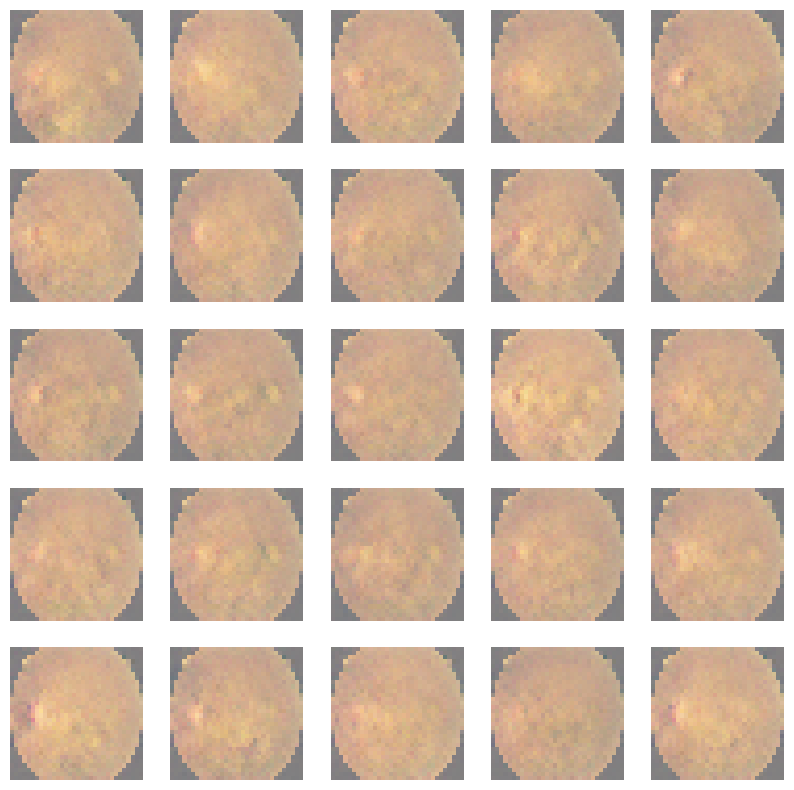

1/1 [==============================] - 0s 18ms/step
epoch: 1301/20000, d_loss: 0.70, g_loss: 2.24
1/1 [==============================] - 0s 18ms/step
epoch: 1401/20000, d_loss: 0.69, g_loss: 2.26
1/1 [==============================] - 0s 19ms/step


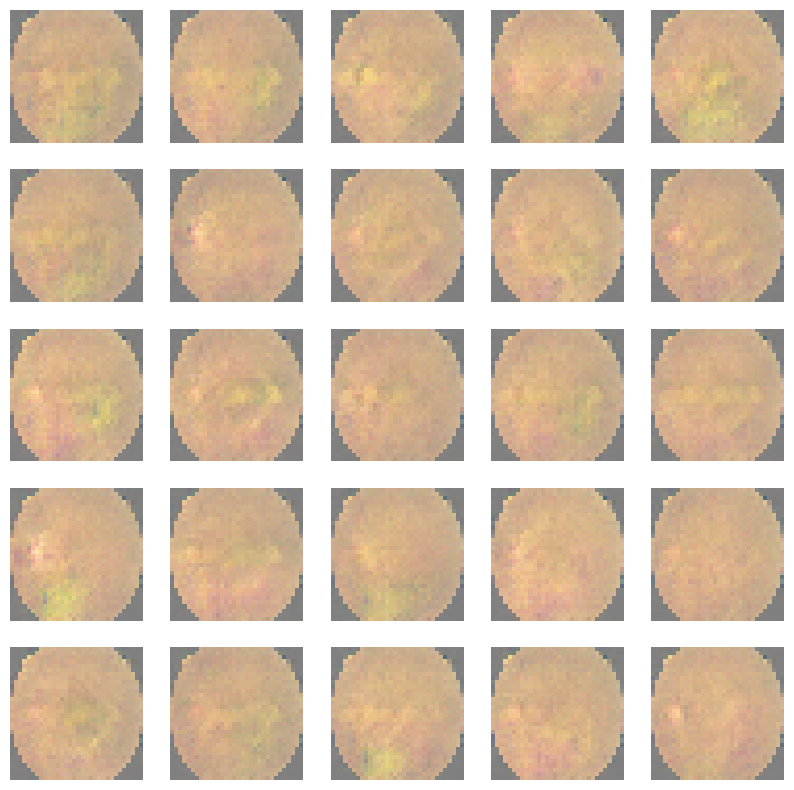

1/1 [==============================] - 0s 17ms/step
epoch: 1501/20000, d_loss: 0.70, g_loss: 2.21
1/1 [==============================] - 0s 19ms/step
epoch: 1601/20000, d_loss: 0.67, g_loss: 2.25
1/1 [==============================] - 0s 19ms/step


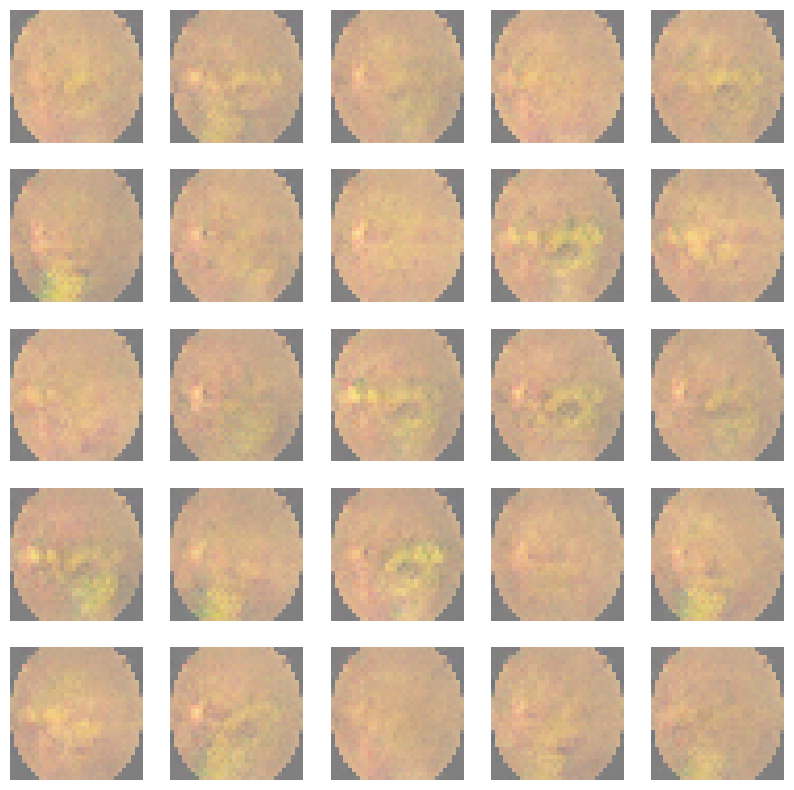

1/1 [==============================] - 0s 17ms/step
epoch: 1701/20000, d_loss: 0.67, g_loss: 2.30
1/1 [==============================] - 0s 16ms/step
epoch: 1801/20000, d_loss: 0.67, g_loss: 2.24
1/1 [==============================] - 0s 21ms/step


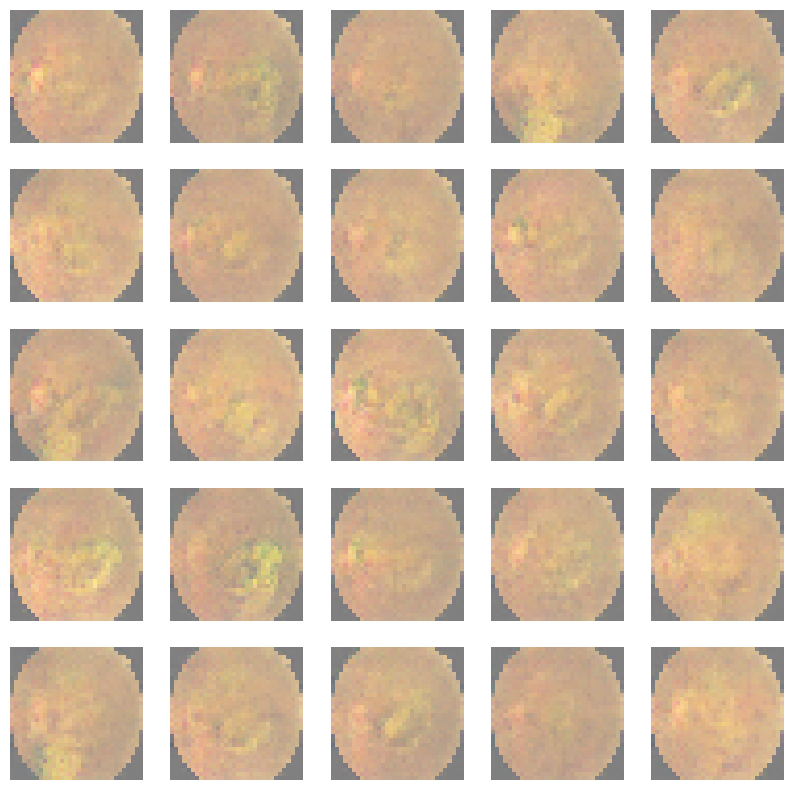

1/1 [==============================] - 0s 18ms/step
epoch: 1901/20000, d_loss: 0.67, g_loss: 2.26
1/1 [==============================] - 0s 28ms/step
epoch: 2001/20000, d_loss: 0.67, g_loss: 2.30
1/1 [==============================] - 0s 21ms/step


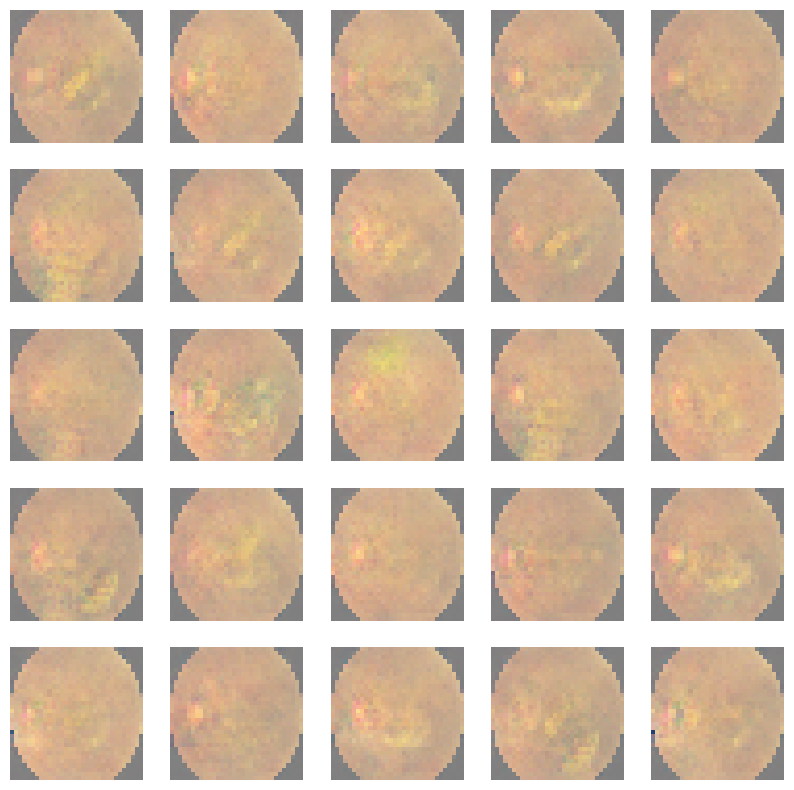

1/1 [==============================] - 0s 27ms/step
epoch: 2101/20000, d_loss: 0.69, g_loss: 2.31
1/1 [==============================] - 0s 18ms/step
epoch: 2201/20000, d_loss: 0.70, g_loss: 2.26
1/1 [==============================] - 0s 18ms/step


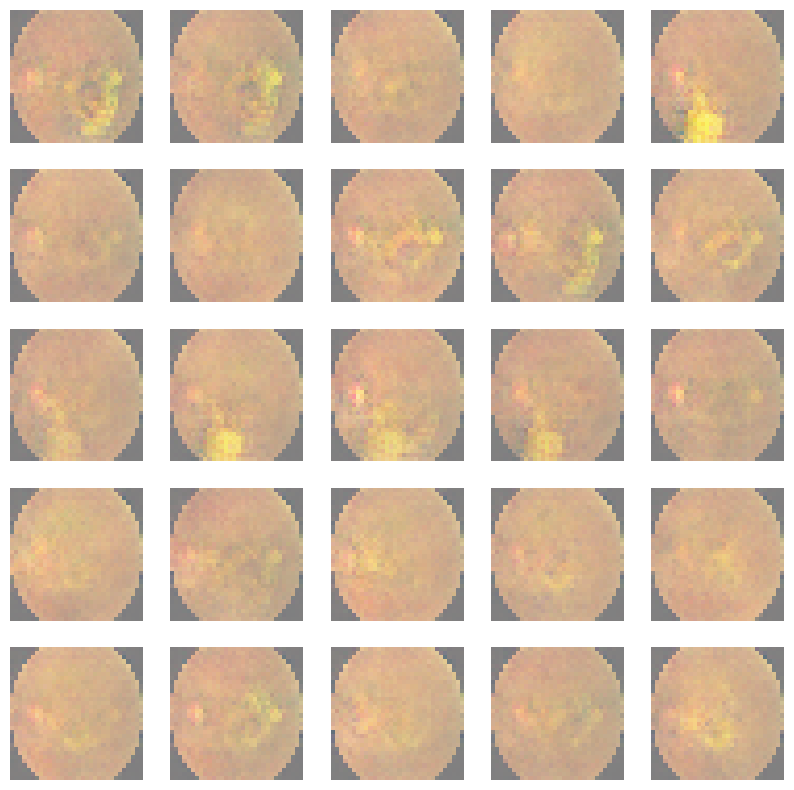

1/1 [==============================] - 0s 20ms/step
epoch: 2301/20000, d_loss: 0.67, g_loss: 2.22
1/1 [==============================] - 0s 18ms/step
epoch: 2401/20000, d_loss: 0.66, g_loss: 2.31
1/1 [==============================] - 0s 24ms/step


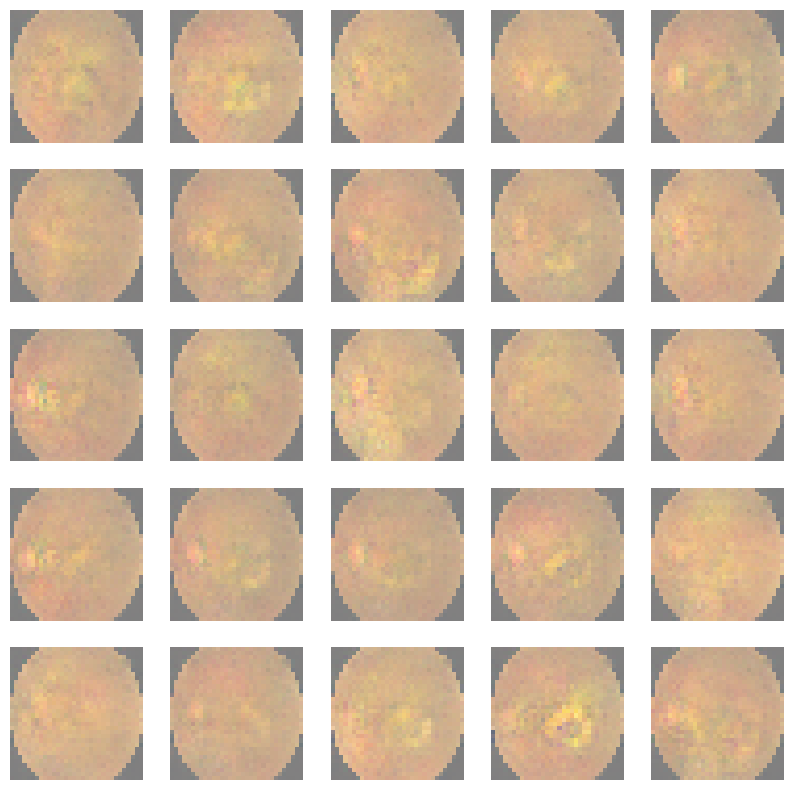

1/1 [==============================] - 0s 18ms/step
epoch: 2501/20000, d_loss: 0.66, g_loss: 2.31
1/1 [==============================] - 0s 20ms/step
epoch: 2601/20000, d_loss: 0.66, g_loss: 2.31
1/1 [==============================] - 0s 19ms/step


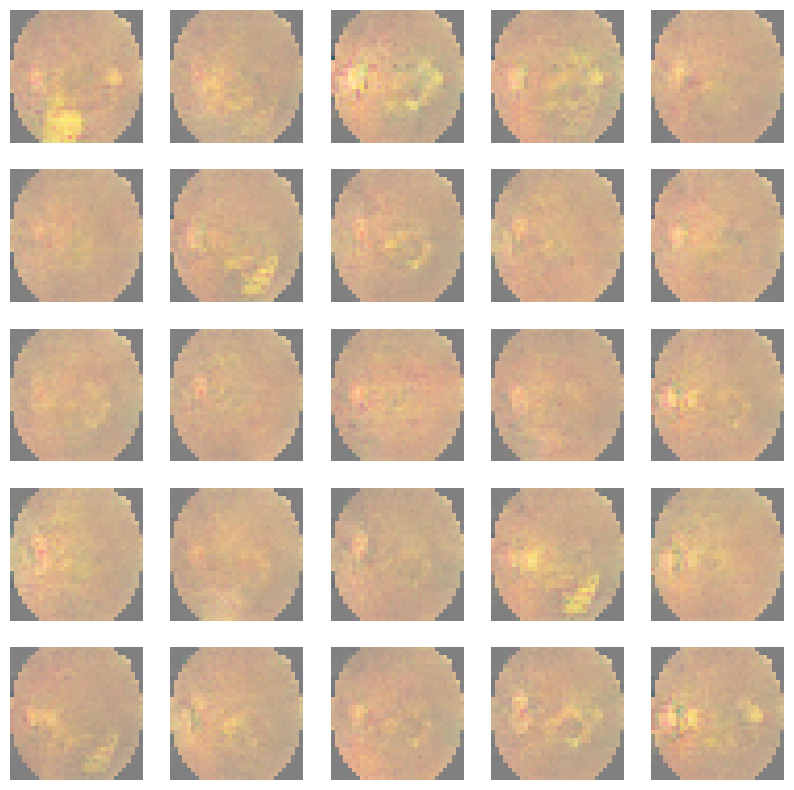

1/1 [==============================] - 0s 19ms/step
epoch: 2701/20000, d_loss: 0.69, g_loss: 2.22
1/1 [==============================] - 0s 18ms/step
epoch: 2801/20000, d_loss: 0.70, g_loss: 2.31
1/1 [==============================] - 0s 21ms/step


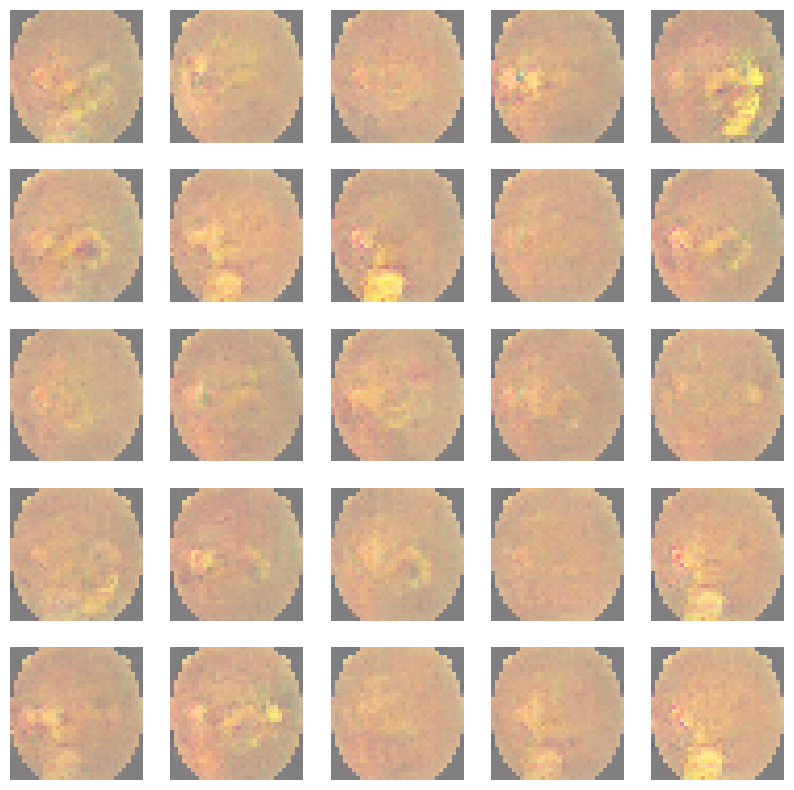

1/1 [==============================] - 0s 21ms/step
epoch: 2901/20000, d_loss: 0.66, g_loss: 2.34
1/1 [==============================] - 0s 17ms/step
epoch: 3001/20000, d_loss: 0.66, g_loss: 2.35
1/1 [==============================] - 0s 23ms/step


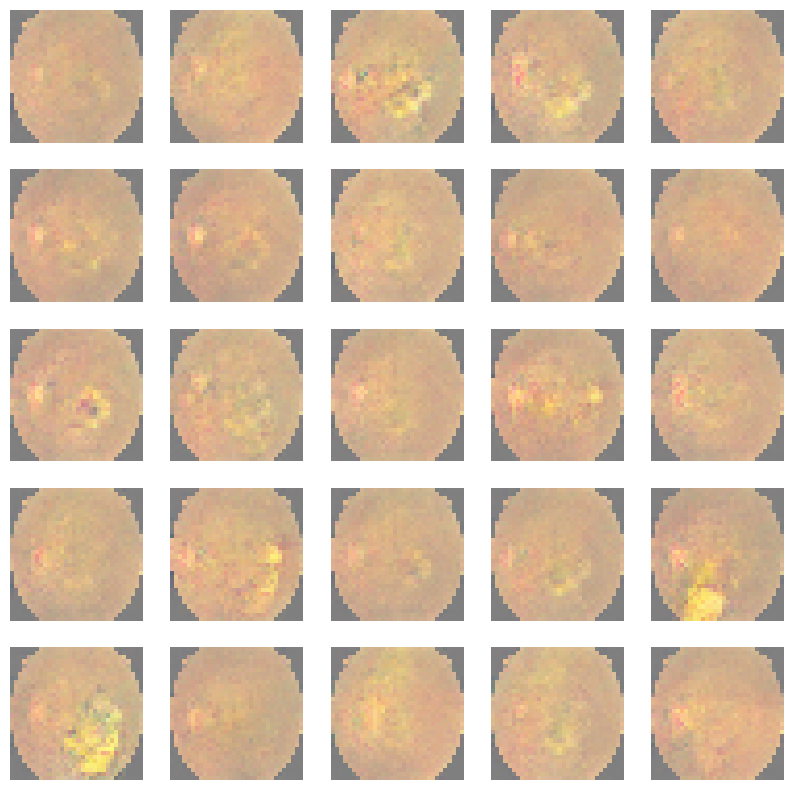

1/1 [==============================] - 0s 20ms/step
epoch: 3101/20000, d_loss: 0.71, g_loss: 2.18
1/1 [==============================] - 0s 17ms/step
epoch: 3201/20000, d_loss: 0.64, g_loss: 2.37
1/1 [==============================] - 0s 24ms/step


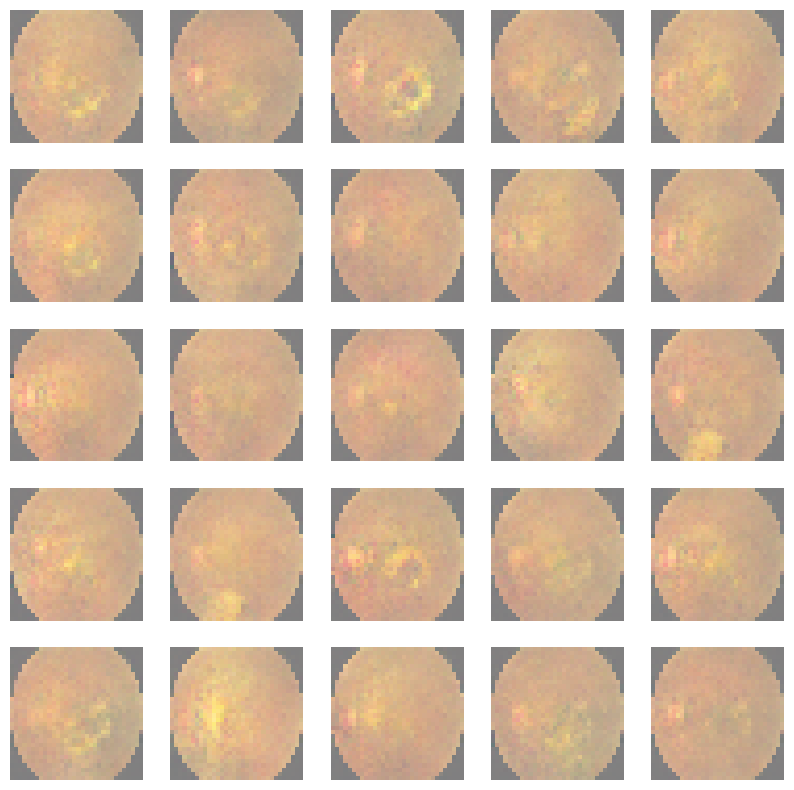

1/1 [==============================] - 0s 20ms/step
epoch: 3301/20000, d_loss: 0.63, g_loss: 2.35
1/1 [==============================] - 0s 18ms/step
epoch: 3401/20000, d_loss: 0.68, g_loss: 2.26
1/1 [==============================] - 0s 18ms/step


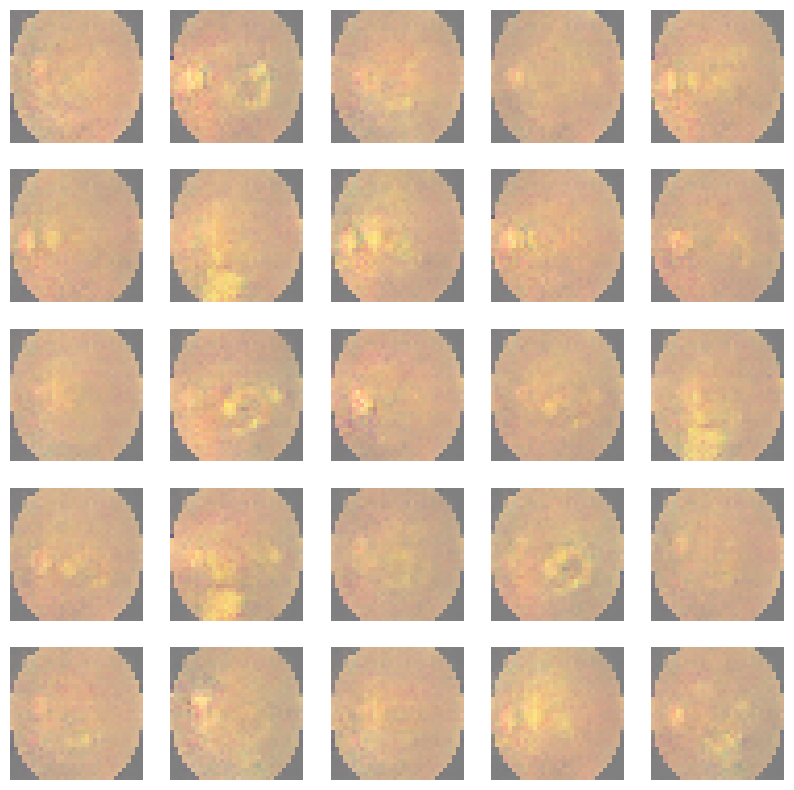

1/1 [==============================] - 0s 17ms/step
epoch: 3501/20000, d_loss: 0.66, g_loss: 2.44
1/1 [==============================] - 0s 20ms/step
epoch: 3601/20000, d_loss: 0.59, g_loss: 2.42
1/1 [==============================] - 0s 21ms/step


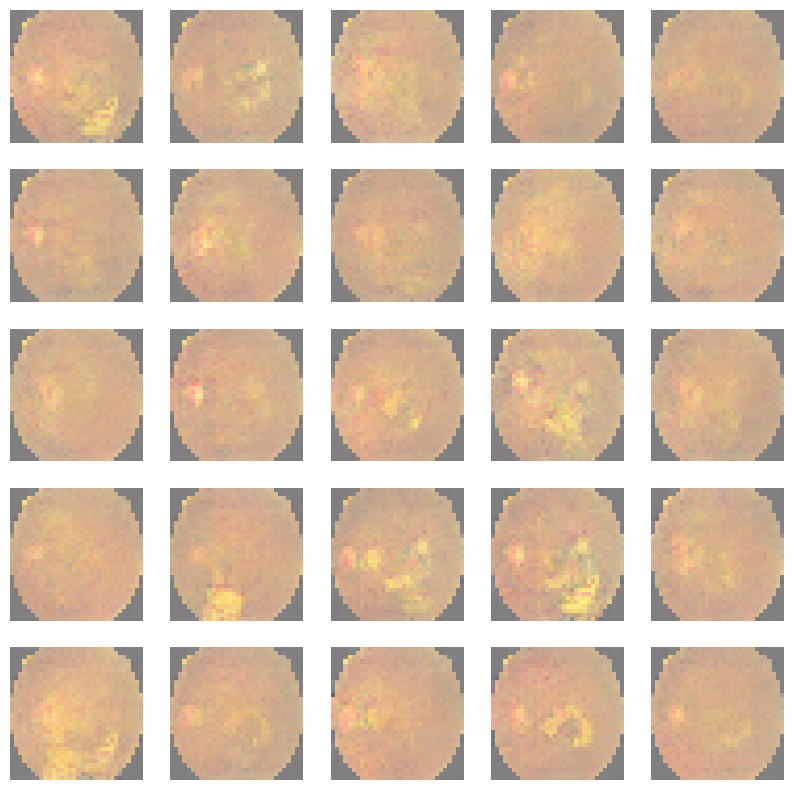

1/1 [==============================] - 0s 26ms/step
epoch: 3701/20000, d_loss: 0.59, g_loss: 2.50
1/1 [==============================] - 0s 17ms/step
epoch: 3801/20000, d_loss: 0.63, g_loss: 2.43
1/1 [==============================] - 0s 23ms/step


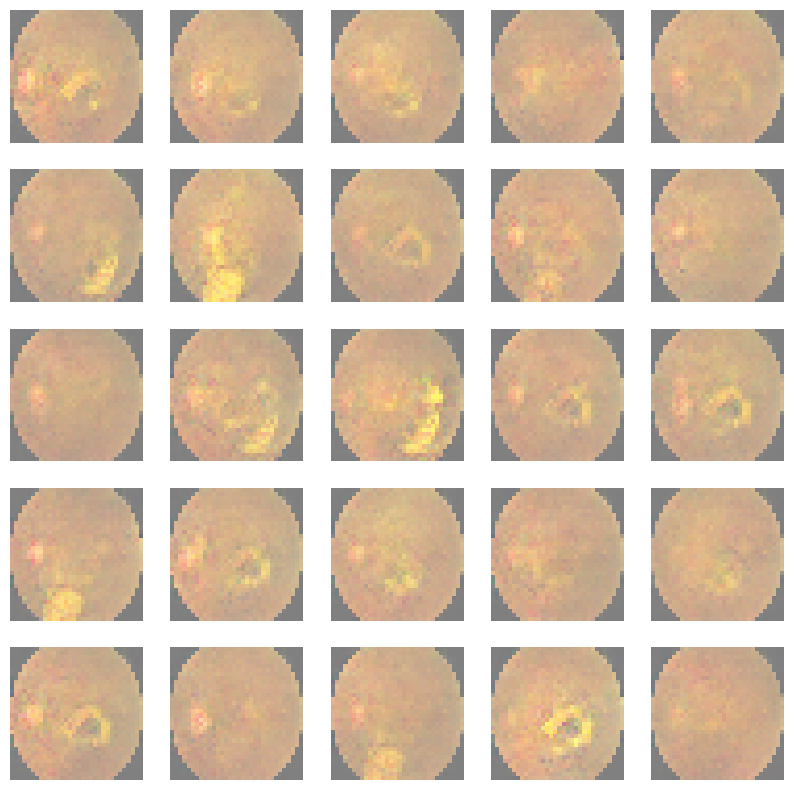

1/1 [==============================] - 0s 19ms/step
epoch: 3901/20000, d_loss: 0.59, g_loss: 2.48
1/1 [==============================] - 0s 19ms/step
epoch: 4001/20000, d_loss: 0.62, g_loss: 2.32
1/1 [==============================] - 0s 22ms/step


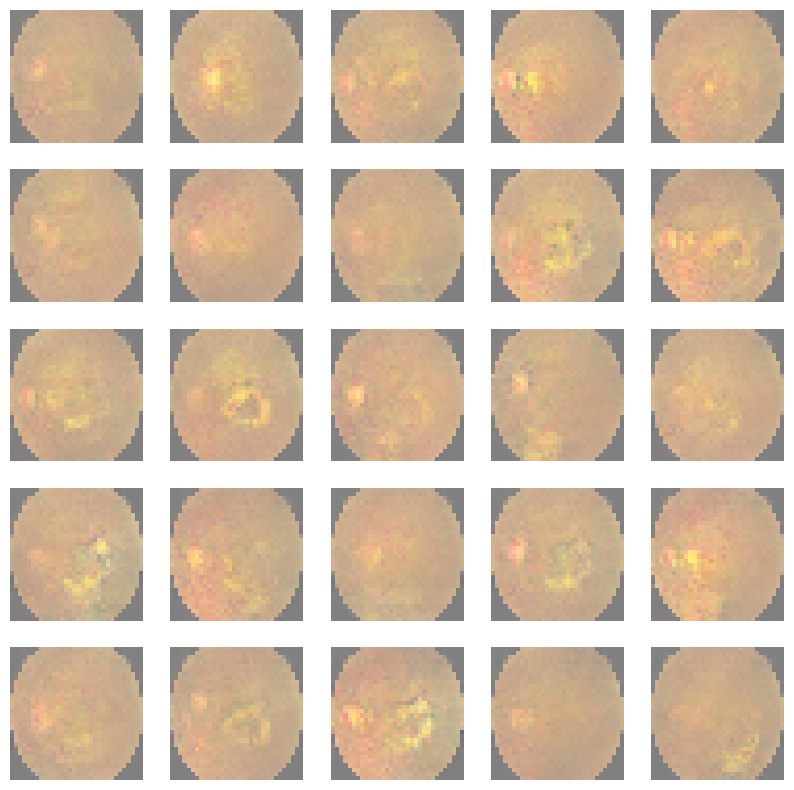

1/1 [==============================] - 0s 29ms/step
epoch: 4101/20000, d_loss: 0.66, g_loss: 2.46
1/1 [==============================] - 0s 25ms/step
epoch: 4201/20000, d_loss: 0.57, g_loss: 2.57
1/1 [==============================] - 0s 19ms/step


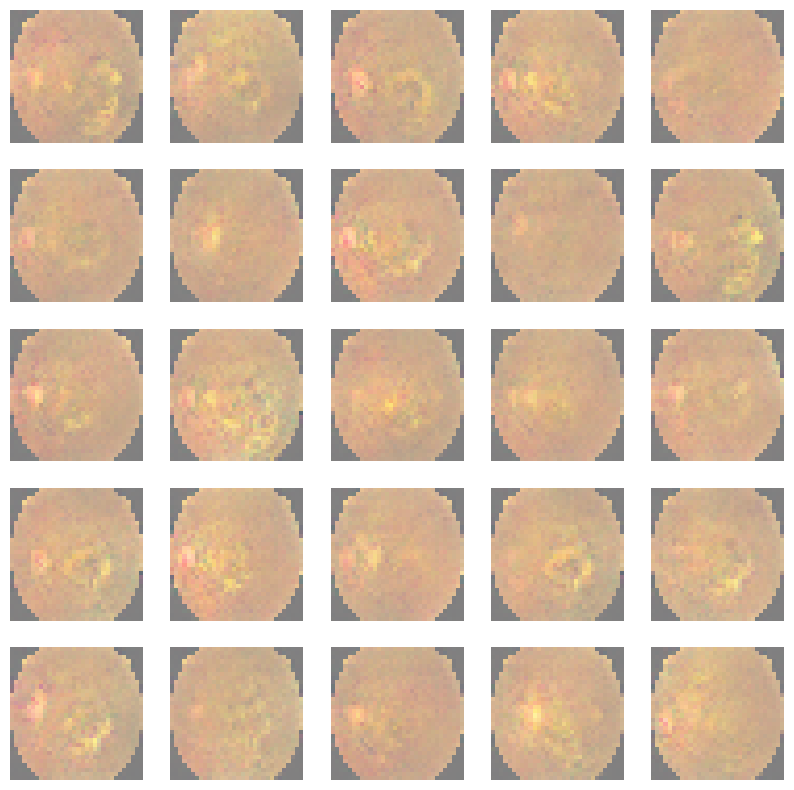

1/1 [==============================] - 0s 22ms/step
epoch: 4301/20000, d_loss: 0.57, g_loss: 2.60
1/1 [==============================] - 0s 19ms/step
epoch: 4401/20000, d_loss: 0.58, g_loss: 2.60
1/1 [==============================] - 0s 19ms/step


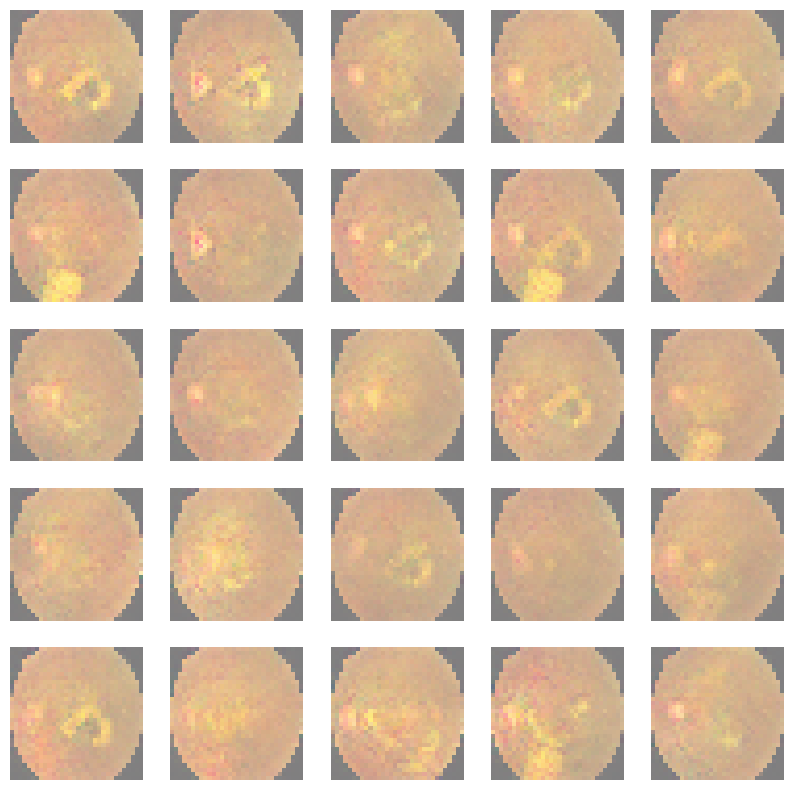

1/1 [==============================] - 0s 25ms/step
epoch: 4501/20000, d_loss: 0.75, g_loss: 2.40
1/1 [==============================] - 0s 19ms/step
epoch: 4601/20000, d_loss: 0.63, g_loss: 2.60
1/1 [==============================] - 0s 19ms/step


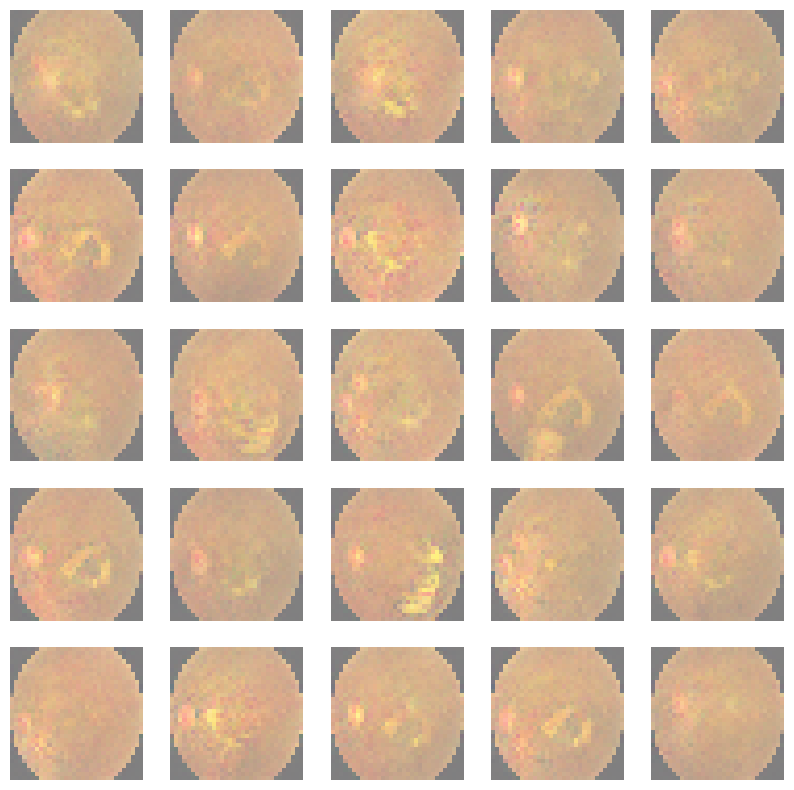

1/1 [==============================] - 0s 22ms/step
epoch: 4701/20000, d_loss: 0.54, g_loss: 2.62
1/1 [==============================] - 0s 20ms/step
epoch: 4801/20000, d_loss: 0.57, g_loss: 2.65
1/1 [==============================] - 0s 22ms/step


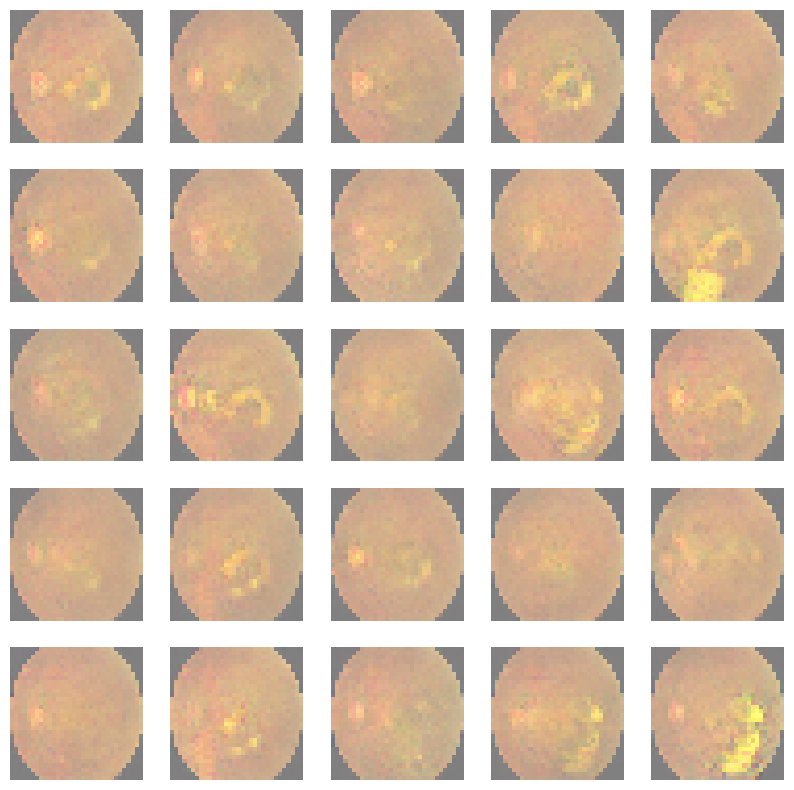

1/1 [==============================] - 0s 22ms/step
epoch: 4901/20000, d_loss: 0.53, g_loss: 2.70
1/1 [==============================] - 0s 20ms/step
epoch: 5001/20000, d_loss: 0.58, g_loss: 2.52
1/1 [==============================] - 0s 21ms/step


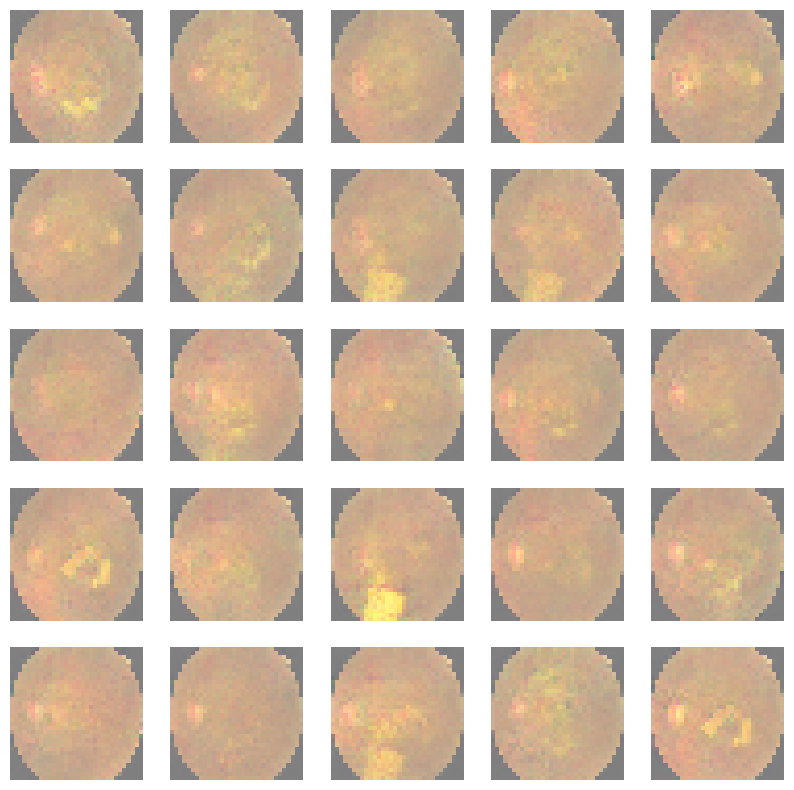

1/1 [==============================] - 0s 24ms/step
epoch: 5101/20000, d_loss: 0.52, g_loss: 2.60
1/1 [==============================] - 0s 18ms/step
epoch: 5201/20000, d_loss: 0.50, g_loss: 2.73
1/1 [==============================] - 0s 19ms/step


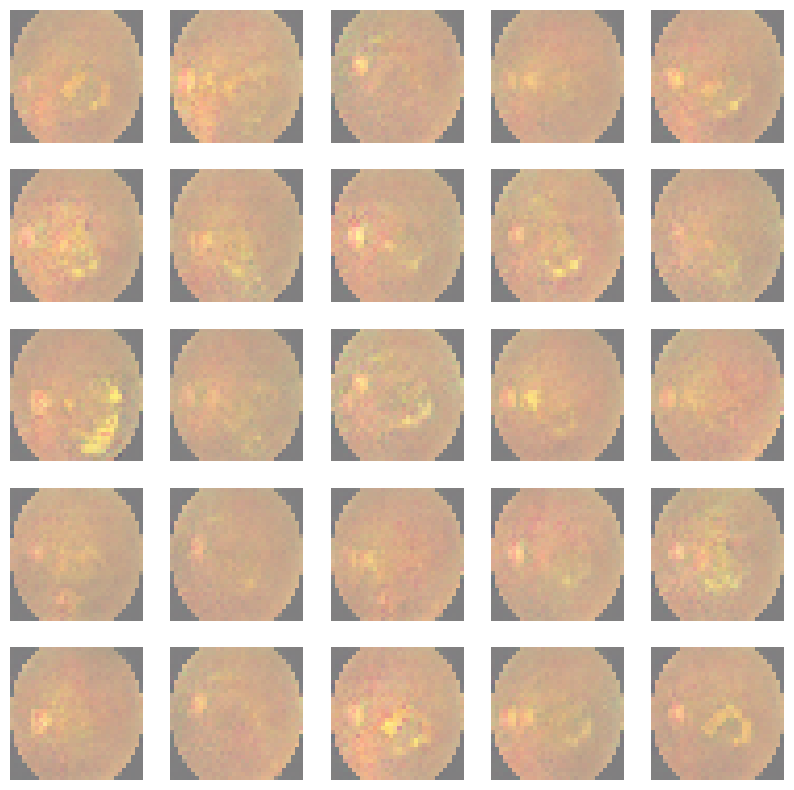

1/1 [==============================] - 0s 20ms/step
epoch: 5301/20000, d_loss: 0.57, g_loss: 2.69
1/1 [==============================] - 0s 27ms/step
epoch: 5401/20000, d_loss: 0.60, g_loss: 2.65
1/1 [==============================] - 0s 19ms/step


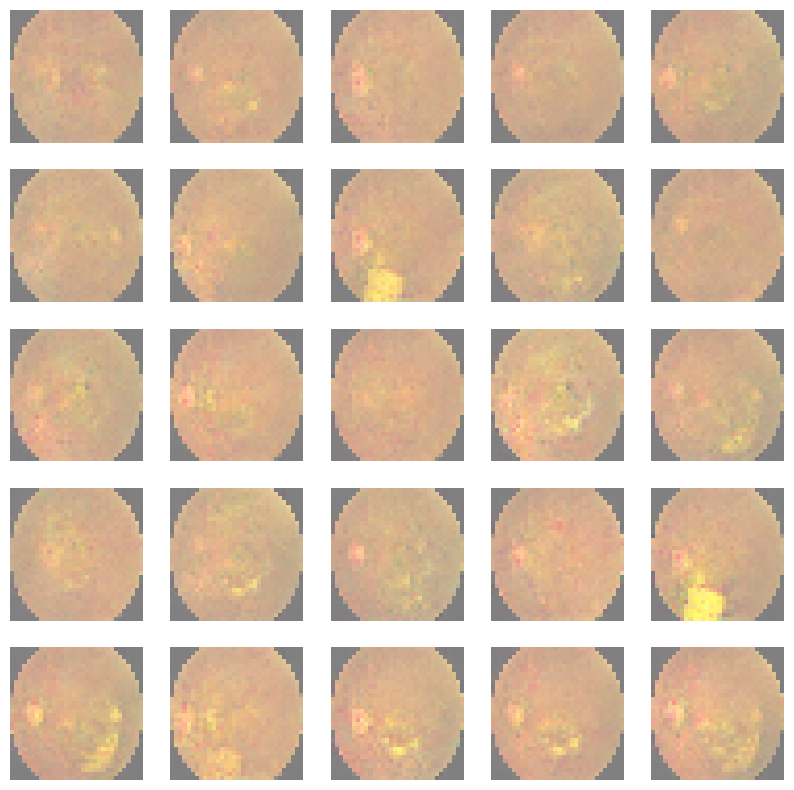

1/1 [==============================] - 0s 28ms/step
epoch: 5501/20000, d_loss: 0.73, g_loss: 2.44
1/1 [==============================] - 0s 23ms/step
epoch: 5601/20000, d_loss: 0.55, g_loss: 2.54
1/1 [==============================] - 0s 27ms/step


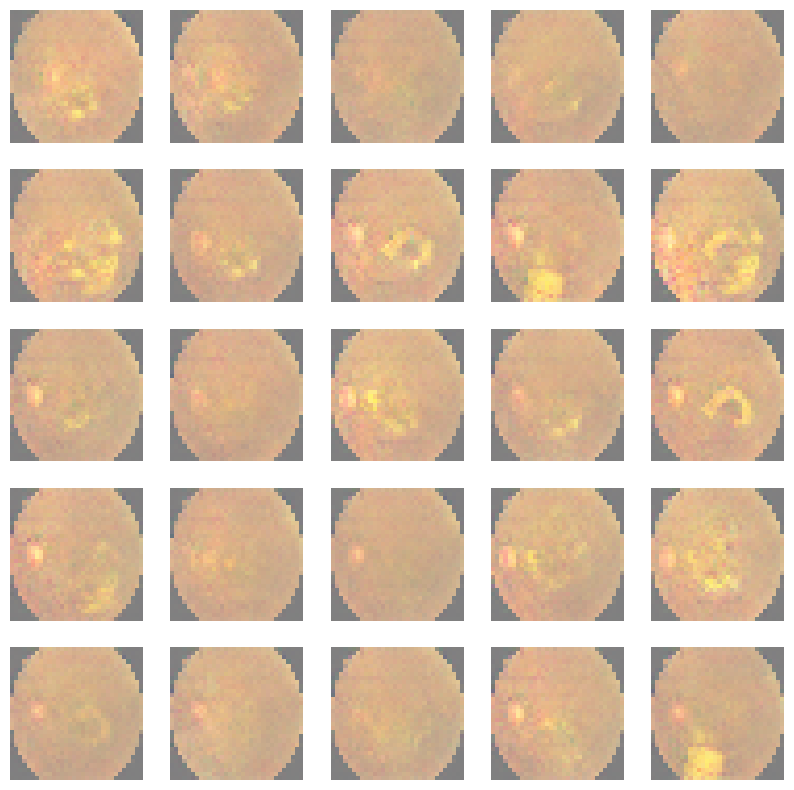

1/1 [==============================] - 0s 36ms/step
epoch: 5701/20000, d_loss: 0.50, g_loss: 2.64
1/1 [==============================] - 0s 26ms/step
epoch: 5801/20000, d_loss: 0.42, g_loss: 2.98
1/1 [==============================] - 0s 21ms/step


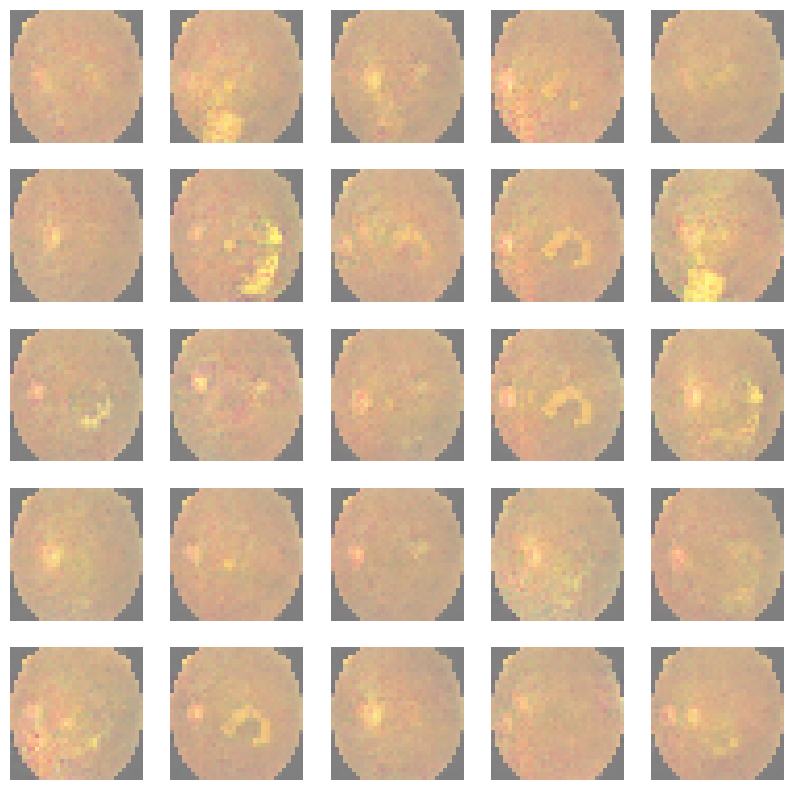

1/1 [==============================] - 0s 25ms/step
epoch: 5901/20000, d_loss: 0.62, g_loss: 2.55
1/1 [==============================] - 0s 25ms/step
epoch: 6001/20000, d_loss: 0.64, g_loss: 2.49
1/1 [==============================] - 0s 23ms/step


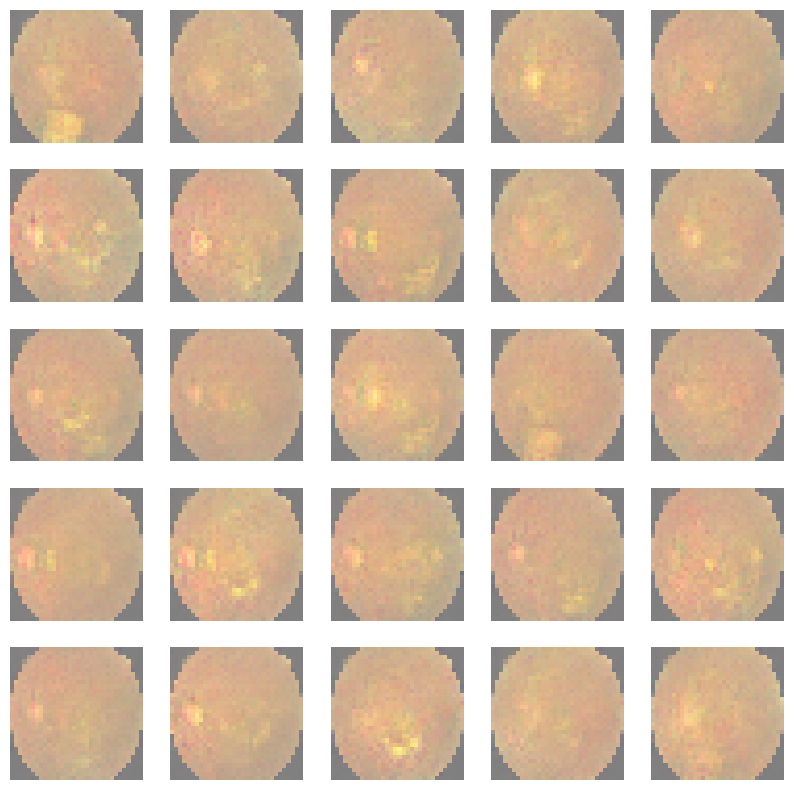

1/1 [==============================] - 0s 25ms/step
epoch: 6101/20000, d_loss: 0.45, g_loss: 2.90
1/1 [==============================] - 0s 27ms/step
epoch: 6201/20000, d_loss: 0.41, g_loss: 2.94
1/1 [==============================] - 0s 22ms/step


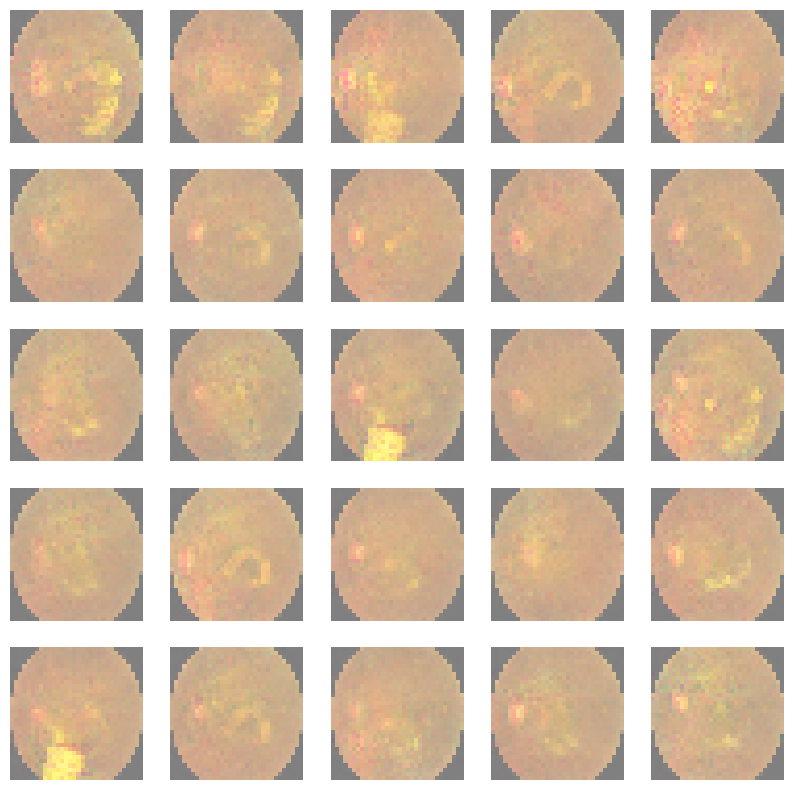

1/1 [==============================] - 0s 28ms/step
epoch: 6301/20000, d_loss: 0.92, g_loss: 2.01
1/1 [==============================] - 0s 25ms/step
epoch: 6401/20000, d_loss: 0.36, g_loss: 3.12
1/1 [==============================] - 0s 19ms/step


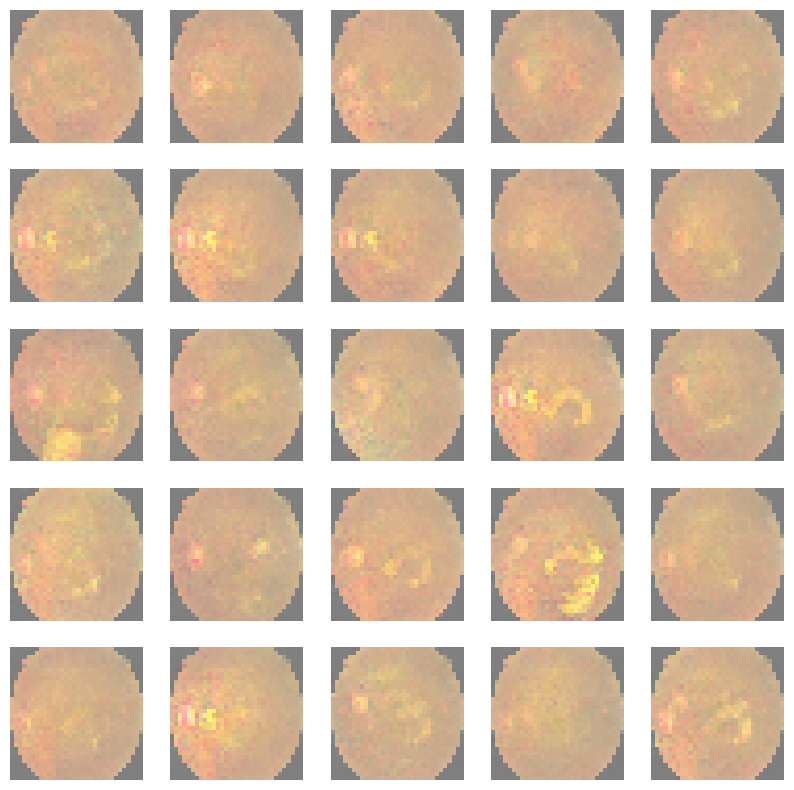

1/1 [==============================] - 0s 34ms/step
epoch: 6501/20000, d_loss: 0.51, g_loss: 2.94
1/1 [==============================] - 0s 30ms/step
epoch: 6601/20000, d_loss: 0.54, g_loss: 2.80
1/1 [==============================] - 0s 35ms/step


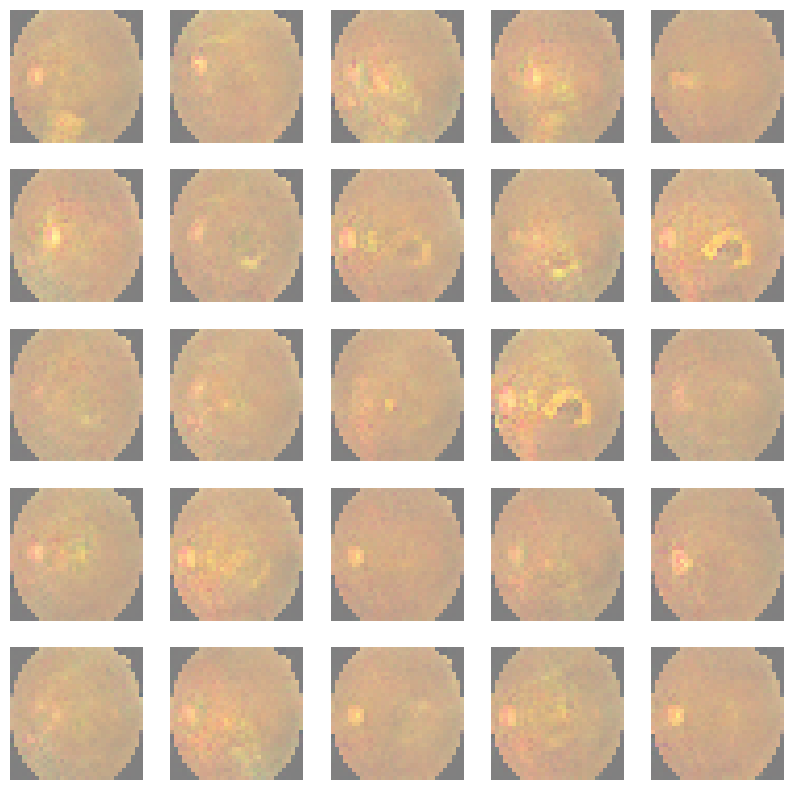

1/1 [==============================] - 0s 26ms/step
epoch: 6701/20000, d_loss: 0.49, g_loss: 2.76
1/1 [==============================] - 0s 31ms/step
epoch: 6801/20000, d_loss: 0.48, g_loss: 2.92
1/1 [==============================] - 0s 29ms/step


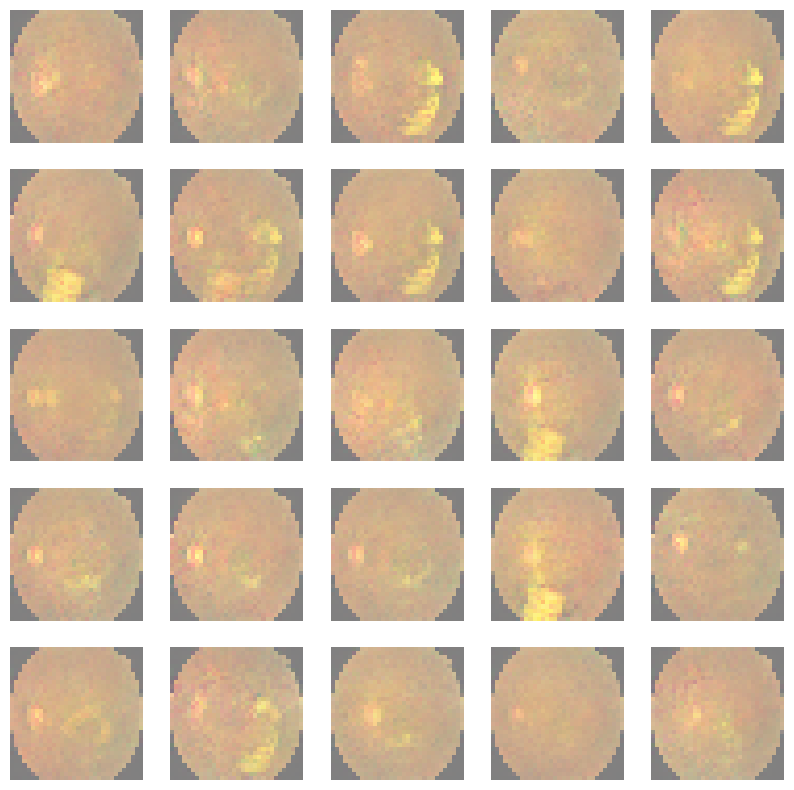

1/1 [==============================] - 0s 29ms/step
epoch: 6901/20000, d_loss: 0.81, g_loss: 2.34
1/1 [==============================] - 0s 26ms/step
epoch: 7001/20000, d_loss: 0.38, g_loss: 3.25
1/1 [==============================] - 0s 72ms/step


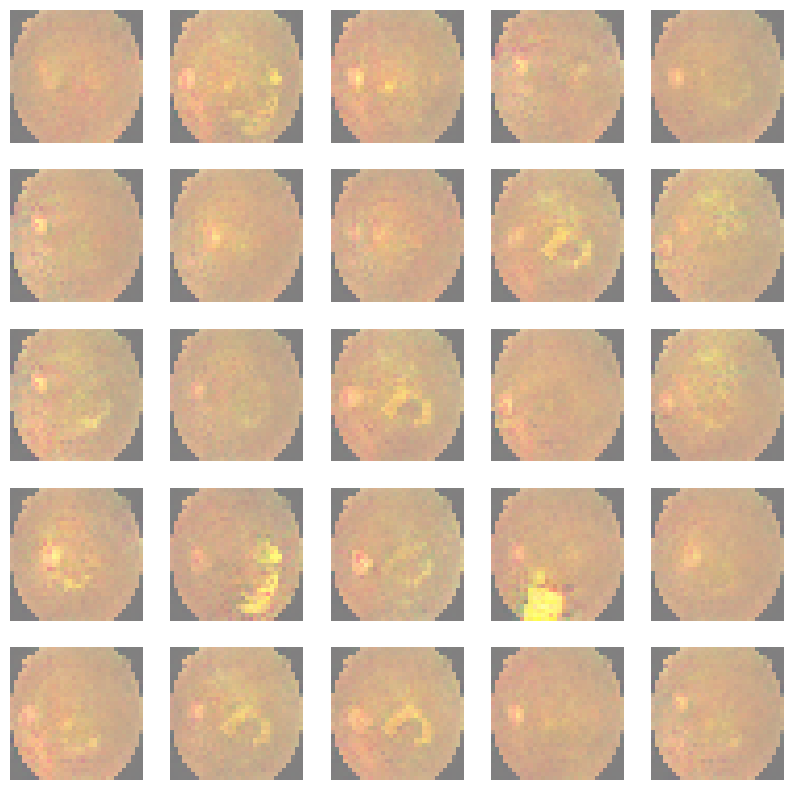

1/1 [==============================] - 0s 29ms/step
epoch: 7101/20000, d_loss: 0.83, g_loss: 2.31
1/1 [==============================] - 0s 32ms/step
epoch: 7201/20000, d_loss: 0.46, g_loss: 2.81
1/1 [==============================] - 0s 31ms/step


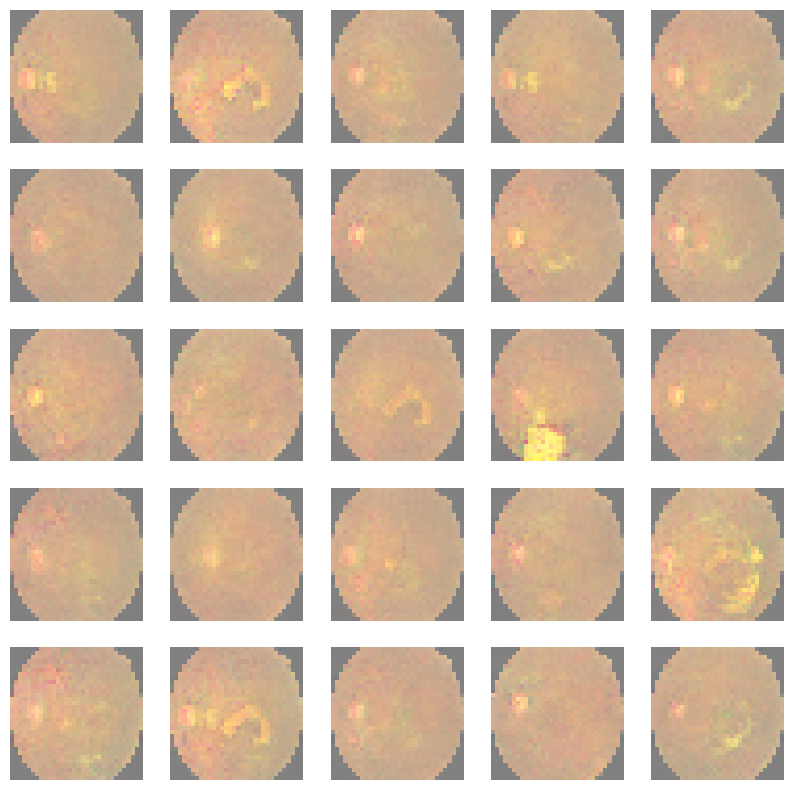

1/1 [==============================] - 0s 28ms/step
epoch: 7301/20000, d_loss: 0.50, g_loss: 3.01
1/1 [==============================] - 0s 27ms/step
epoch: 7401/20000, d_loss: 0.48, g_loss: 2.88
1/1 [==============================] - 0s 28ms/step


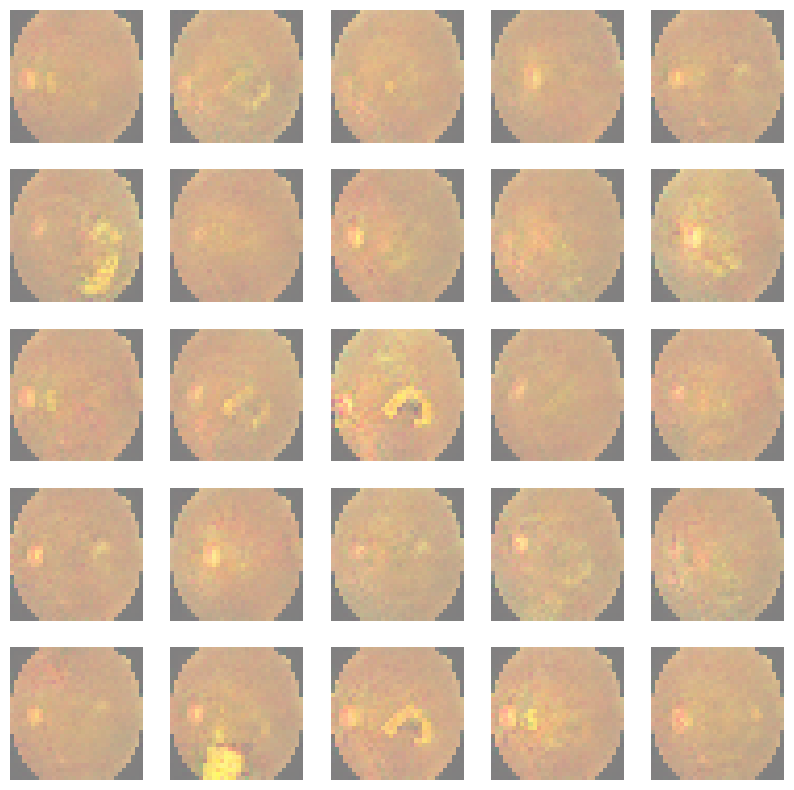

1/1 [==============================] - 0s 57ms/step
epoch: 7501/20000, d_loss: 0.48, g_loss: 3.11
1/1 [==============================] - 0s 27ms/step
epoch: 7601/20000, d_loss: 0.44, g_loss: 2.88
1/1 [==============================] - 0s 27ms/step


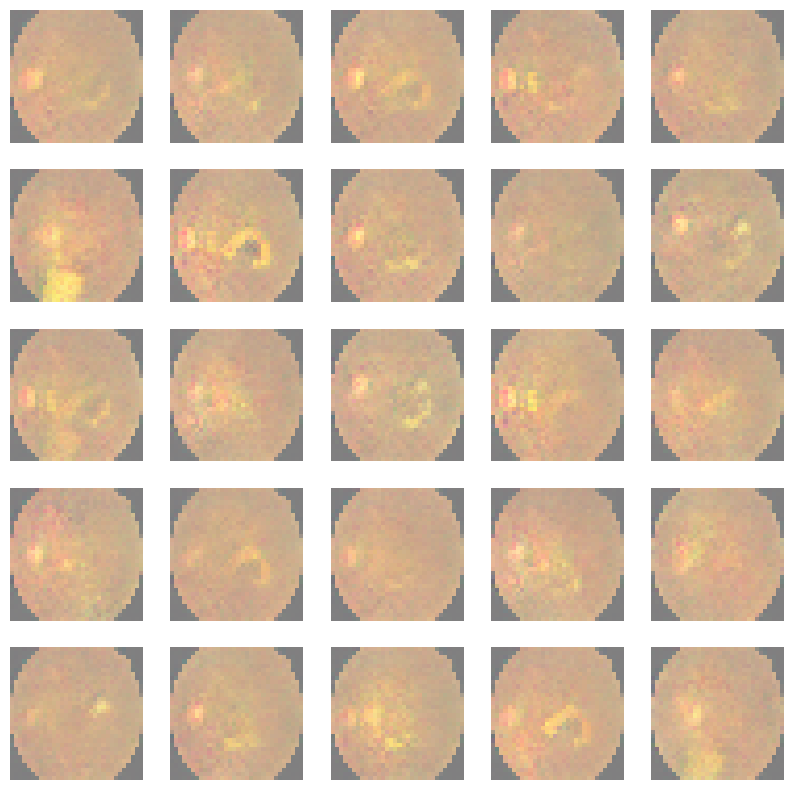

1/1 [==============================] - 0s 28ms/step
epoch: 7701/20000, d_loss: 0.39, g_loss: 3.19
1/1 [==============================] - 0s 29ms/step
epoch: 7801/20000, d_loss: 0.47, g_loss: 3.13
1/1 [==============================] - 0s 30ms/step


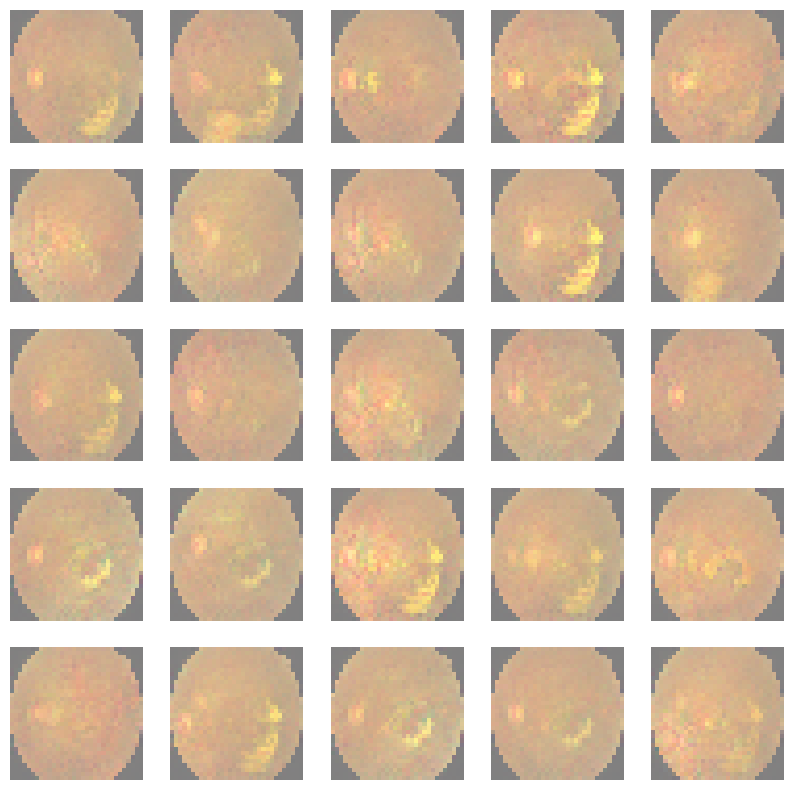

1/1 [==============================] - 0s 30ms/step
epoch: 7901/20000, d_loss: 0.37, g_loss: 3.31
1/1 [==============================] - 0s 28ms/step
epoch: 8001/20000, d_loss: 0.45, g_loss: 3.06
1/1 [==============================] - 0s 40ms/step


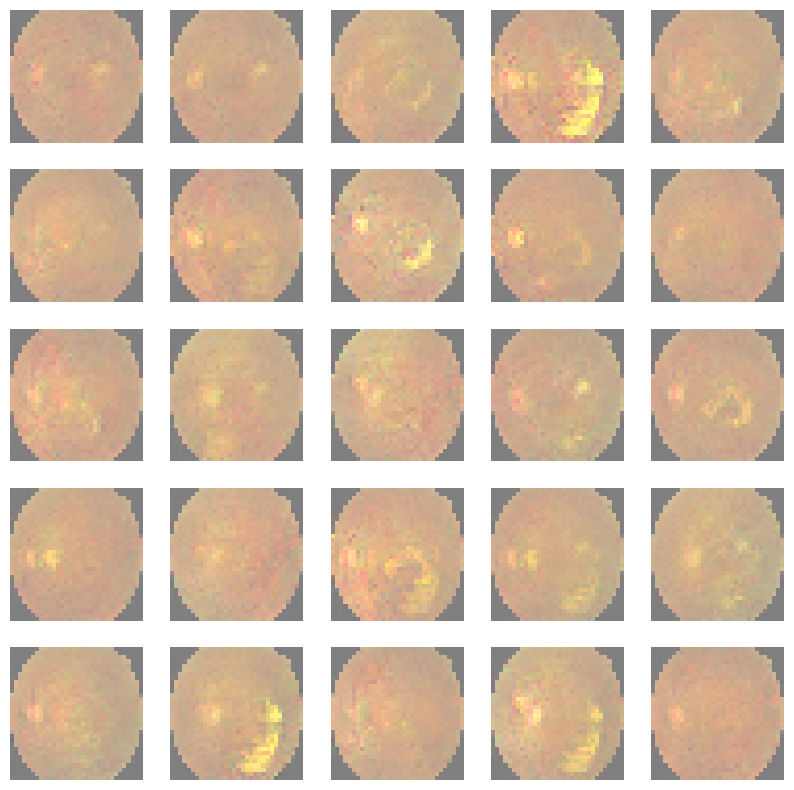

1/1 [==============================] - 0s 27ms/step
epoch: 8101/20000, d_loss: 0.46, g_loss: 3.06
1/1 [==============================] - 0s 27ms/step
epoch: 8201/20000, d_loss: 0.42, g_loss: 3.13
1/1 [==============================] - 0s 27ms/step


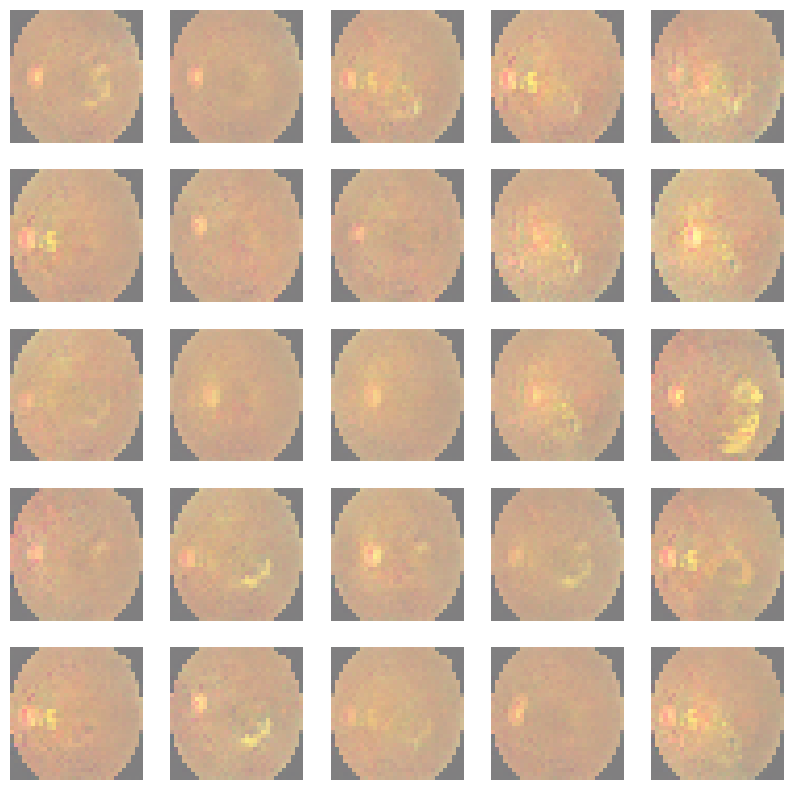

1/1 [==============================] - 0s 28ms/step
epoch: 8301/20000, d_loss: 0.43, g_loss: 3.29
1/1 [==============================] - 0s 25ms/step
epoch: 8401/20000, d_loss: 0.44, g_loss: 3.10
1/1 [==============================] - 0s 29ms/step


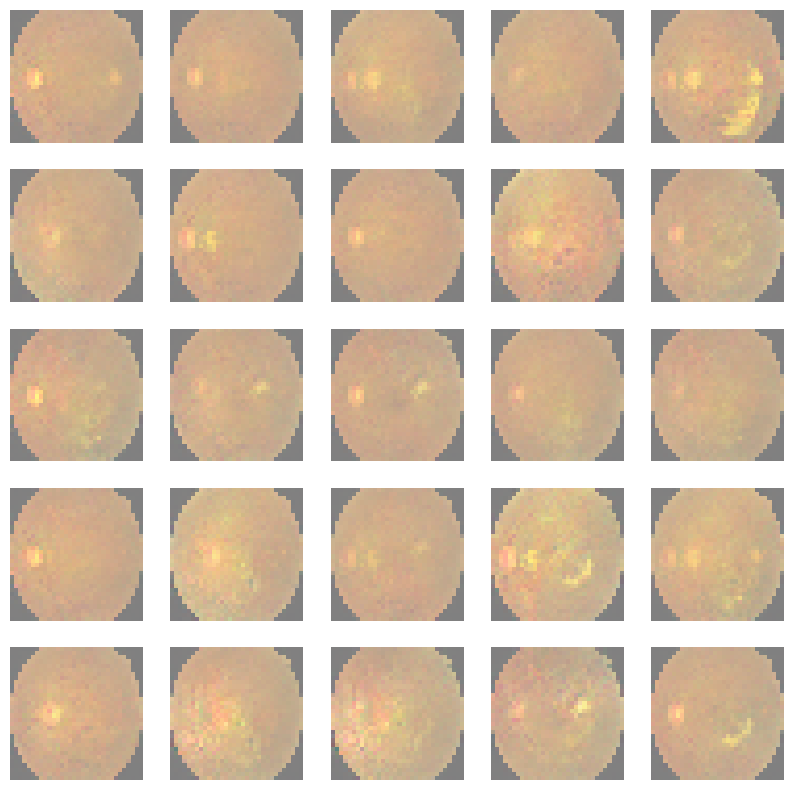

1/1 [==============================] - 0s 30ms/step
epoch: 8501/20000, d_loss: 0.36, g_loss: 3.29
1/1 [==============================] - 0s 29ms/step
epoch: 8601/20000, d_loss: 0.42, g_loss: 3.06
1/1 [==============================] - 0s 30ms/step


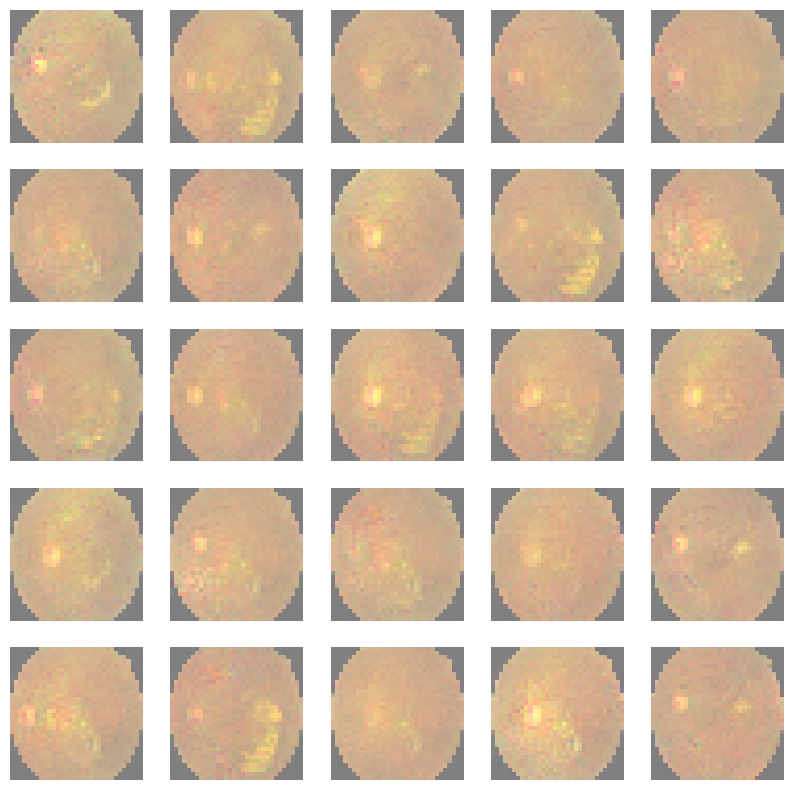

1/1 [==============================] - 0s 25ms/step
epoch: 8701/20000, d_loss: 0.42, g_loss: 3.09
1/1 [==============================] - 0s 39ms/step
epoch: 8801/20000, d_loss: 0.51, g_loss: 3.01
1/1 [==============================] - 0s 30ms/step


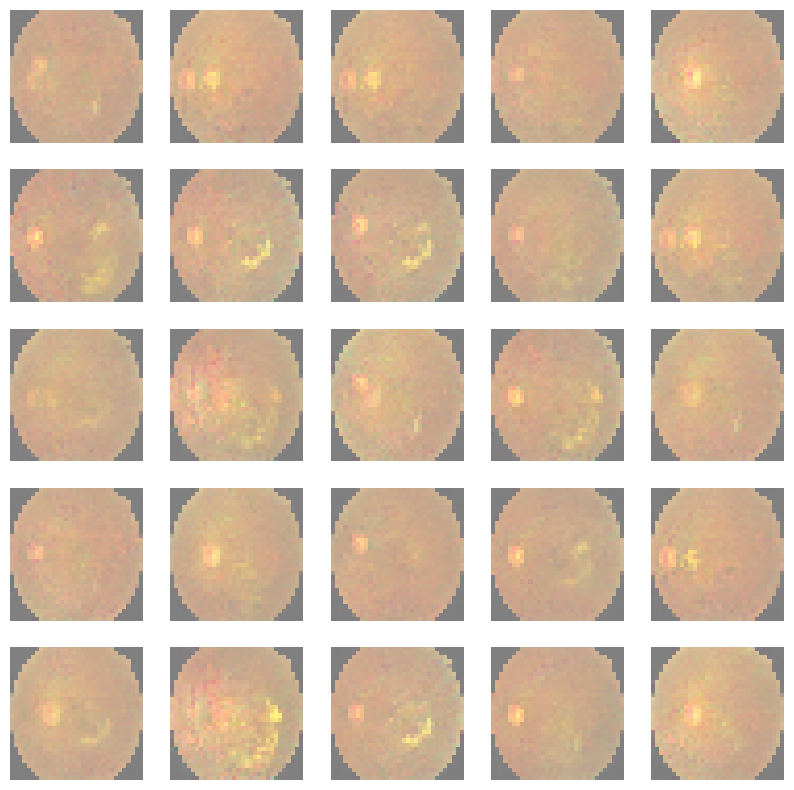

1/1 [==============================] - 0s 32ms/step
epoch: 8901/20000, d_loss: 0.42, g_loss: 3.04
1/1 [==============================] - 0s 26ms/step
epoch: 9001/20000, d_loss: 0.47, g_loss: 3.01
1/1 [==============================] - 0s 34ms/step


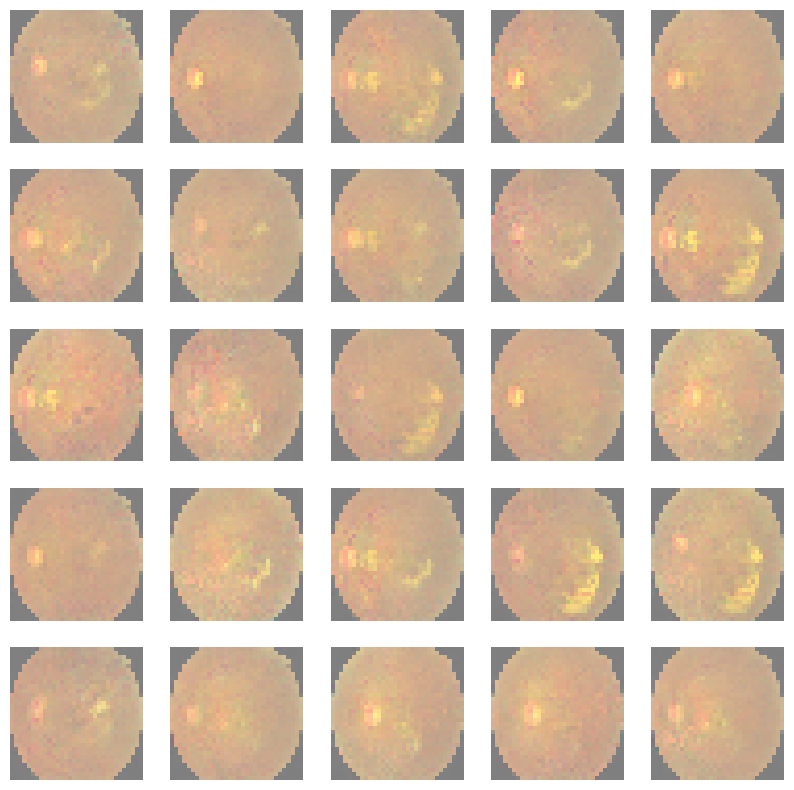

1/1 [==============================] - 0s 29ms/step
epoch: 9101/20000, d_loss: 0.46, g_loss: 3.03
1/1 [==============================] - 0s 26ms/step
epoch: 9201/20000, d_loss: 0.38, g_loss: 3.20
1/1 [==============================] - 0s 31ms/step


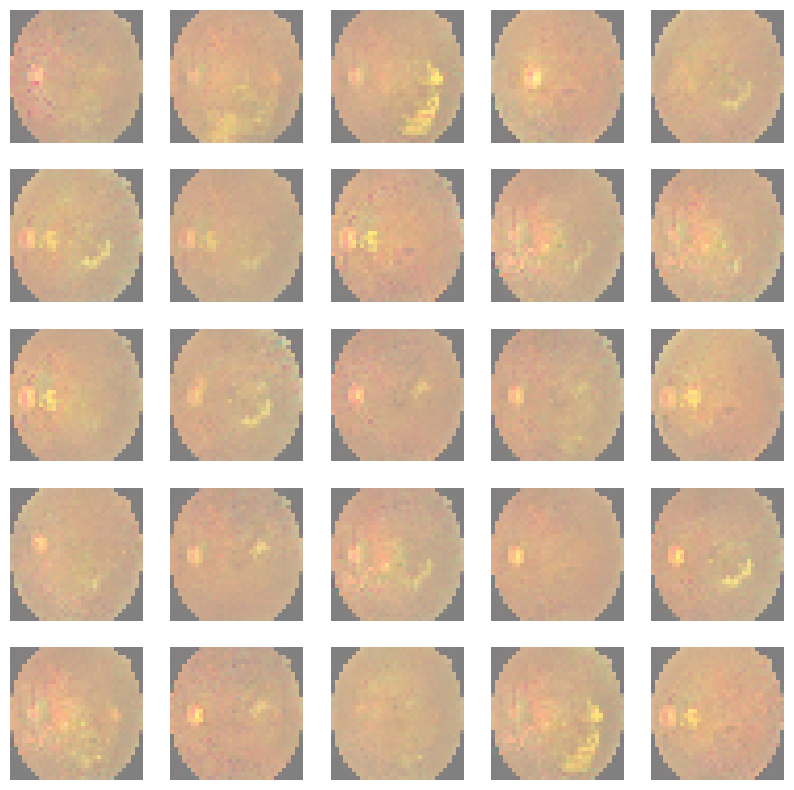

1/1 [==============================] - 0s 29ms/step
epoch: 9301/20000, d_loss: 0.42, g_loss: 3.20
1/1 [==============================] - 0s 25ms/step
epoch: 9401/20000, d_loss: 0.53, g_loss: 2.85
1/1 [==============================] - 0s 25ms/step


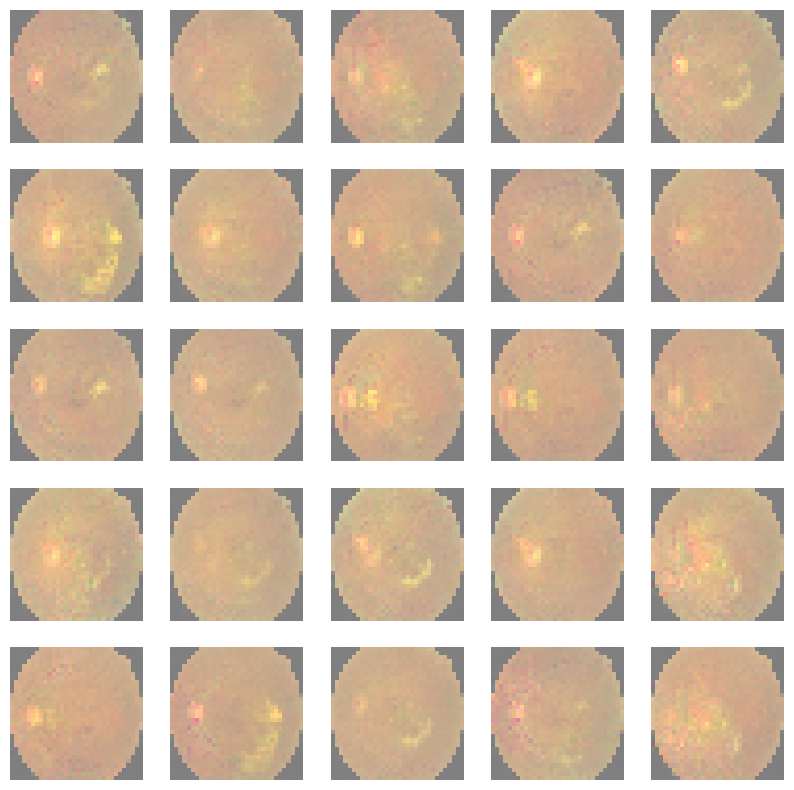

1/1 [==============================] - 0s 26ms/step
epoch: 9501/20000, d_loss: 0.50, g_loss: 3.19
1/1 [==============================] - 0s 26ms/step
epoch: 9601/20000, d_loss: 0.39, g_loss: 3.09
1/1 [==============================] - 0s 39ms/step


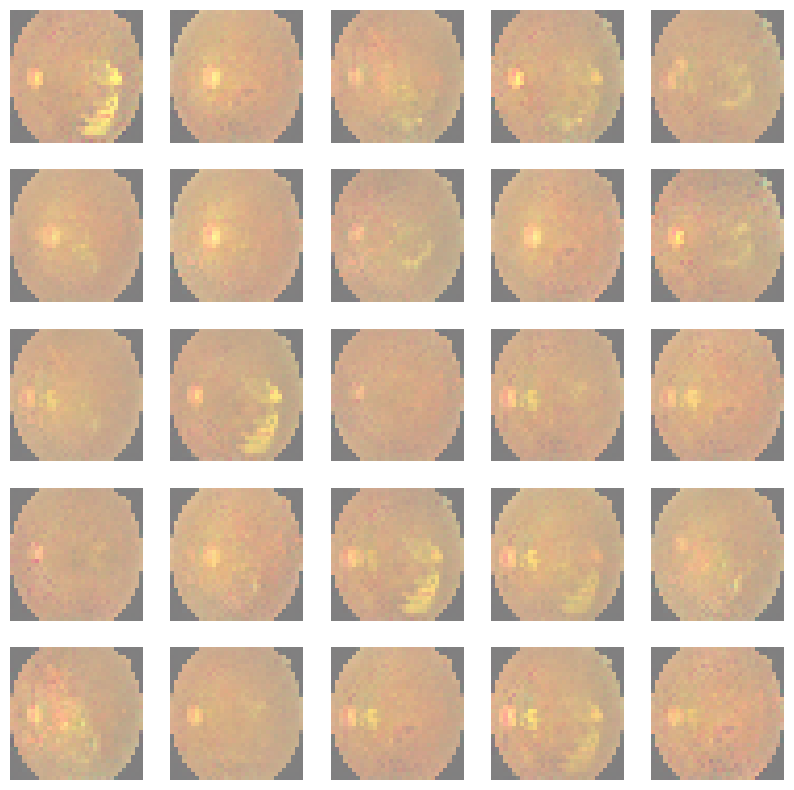

1/1 [==============================] - 0s 27ms/step
epoch: 9701/20000, d_loss: 0.50, g_loss: 3.03
1/1 [==============================] - 0s 26ms/step
epoch: 9801/20000, d_loss: 0.49, g_loss: 3.04
1/1 [==============================] - 0s 37ms/step


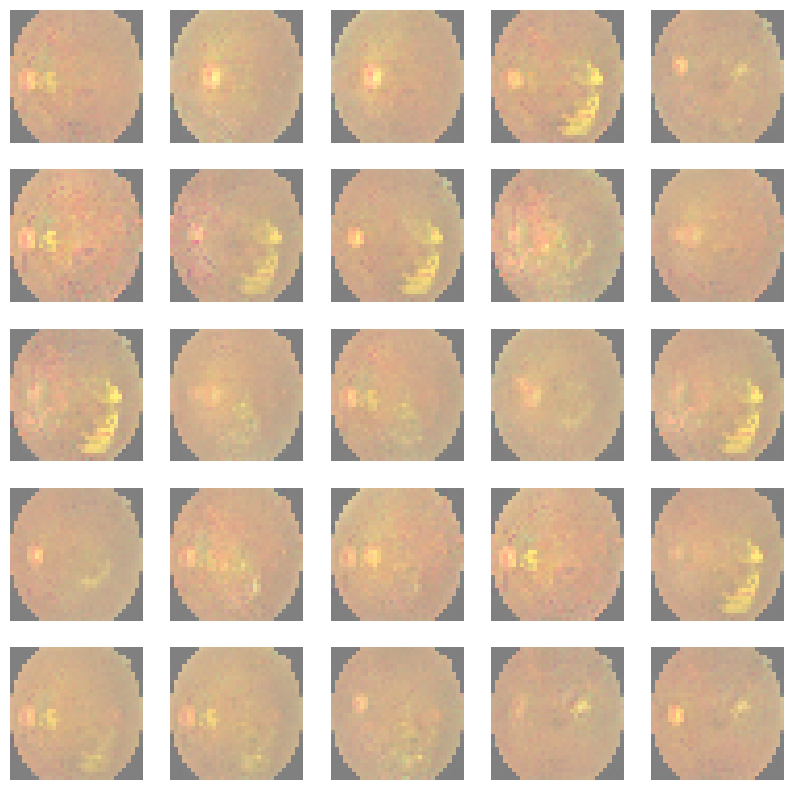

1/1 [==============================] - 0s 30ms/step
epoch: 9901/20000, d_loss: 0.41, g_loss: 3.10
1/1 [==============================] - 0s 28ms/step
epoch: 10001/20000, d_loss: 0.42, g_loss: 3.55
1/1 [==============================] - 0s 28ms/step


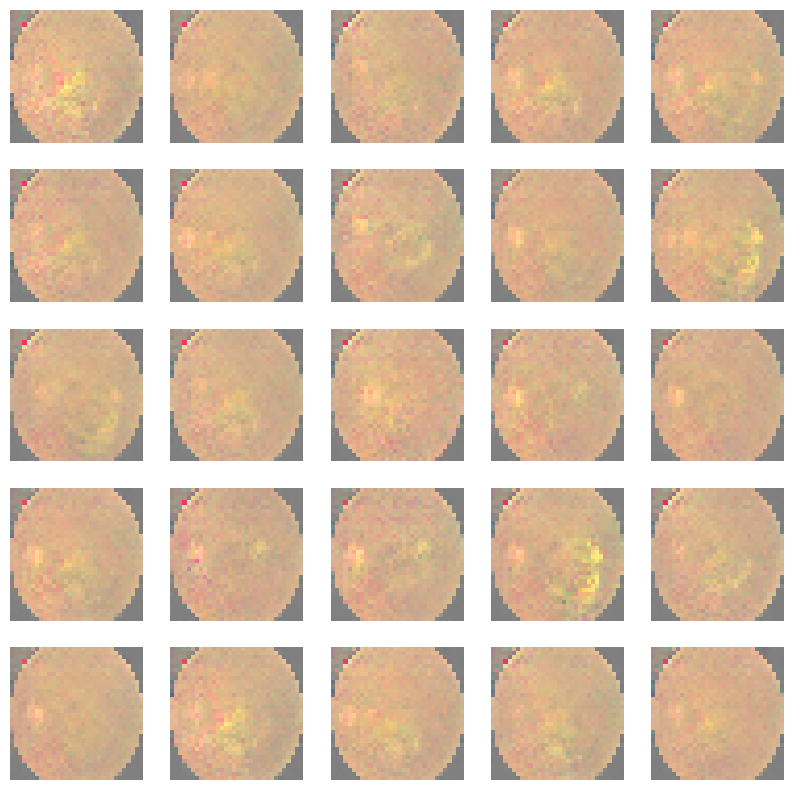

1/1 [==============================] - 0s 40ms/step
epoch: 10101/20000, d_loss: 0.37, g_loss: 3.47
1/1 [==============================] - 0s 30ms/step
epoch: 10201/20000, d_loss: 0.41, g_loss: 3.29
1/1 [==============================] - 0s 44ms/step


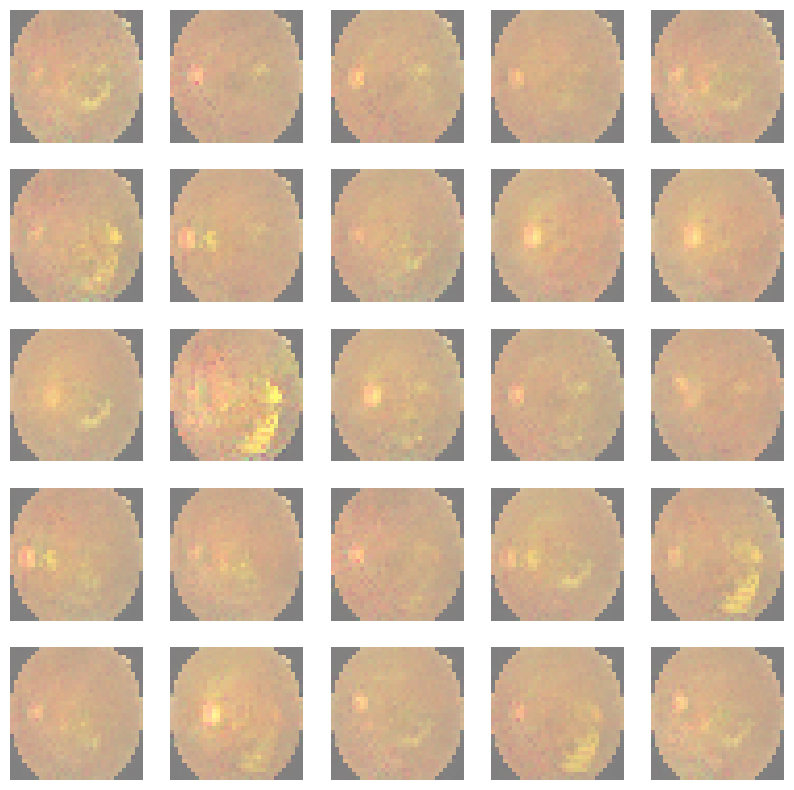

1/1 [==============================] - 0s 27ms/step
epoch: 10301/20000, d_loss: 0.52, g_loss: 3.14
1/1 [==============================] - 0s 34ms/step
epoch: 10401/20000, d_loss: 0.36, g_loss: 3.05
1/1 [==============================] - 0s 31ms/step


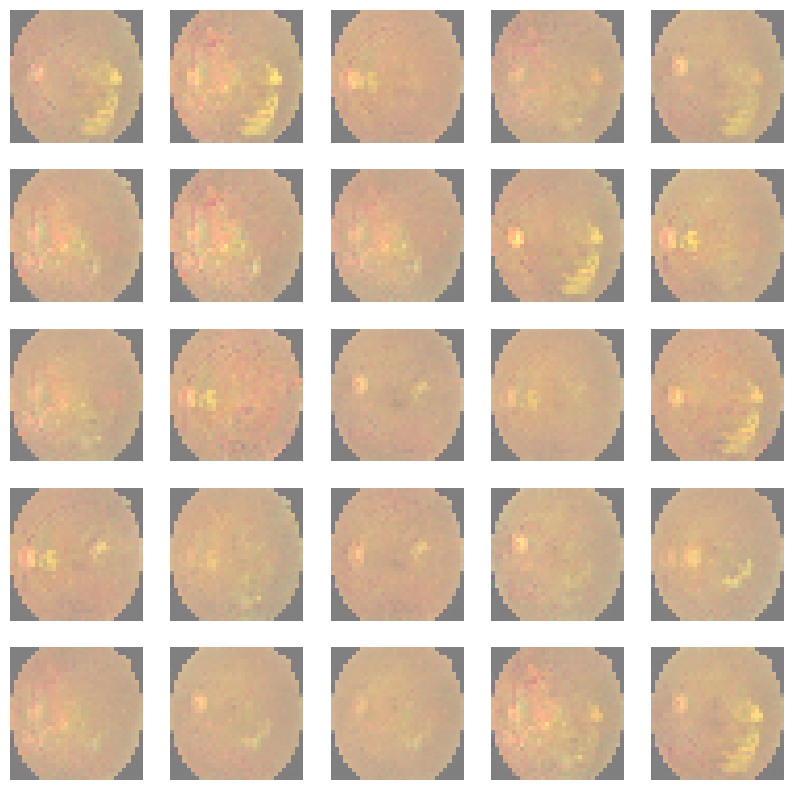

1/1 [==============================] - 0s 31ms/step
epoch: 10501/20000, d_loss: 0.45, g_loss: 3.22
1/1 [==============================] - 0s 26ms/step
epoch: 10601/20000, d_loss: 0.38, g_loss: 3.28
1/1 [==============================] - 0s 31ms/step


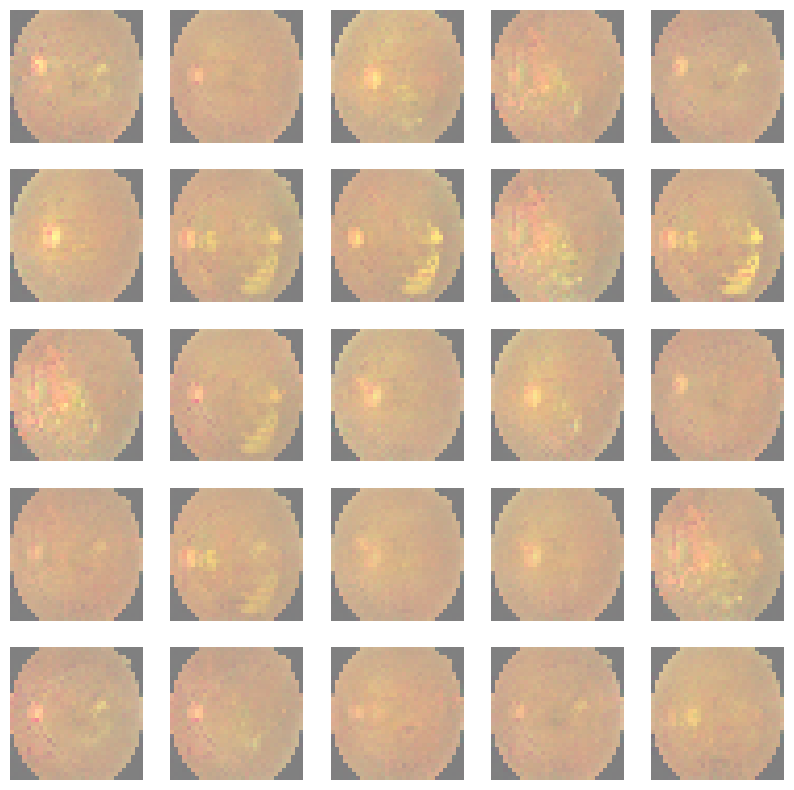

1/1 [==============================] - 0s 42ms/step
epoch: 10701/20000, d_loss: 0.42, g_loss: 3.12
1/1 [==============================] - 0s 41ms/step
epoch: 10801/20000, d_loss: 0.32, g_loss: 3.15
1/1 [==============================] - 0s 28ms/step


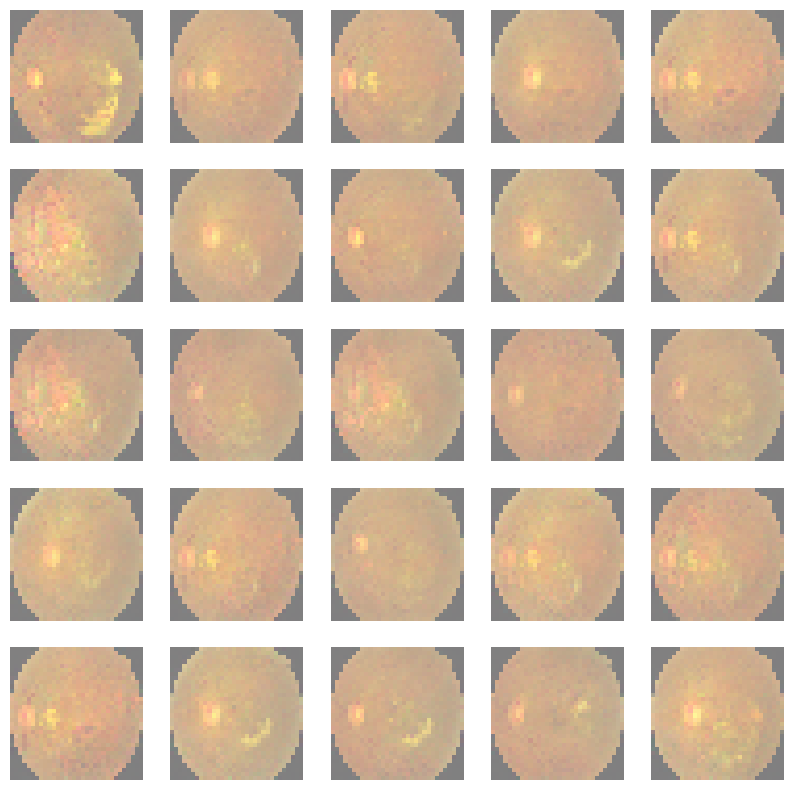

1/1 [==============================] - 0s 29ms/step
epoch: 10901/20000, d_loss: 0.38, g_loss: 3.33
1/1 [==============================] - 0s 27ms/step
epoch: 11001/20000, d_loss: 0.45, g_loss: 3.16
1/1 [==============================] - 0s 28ms/step


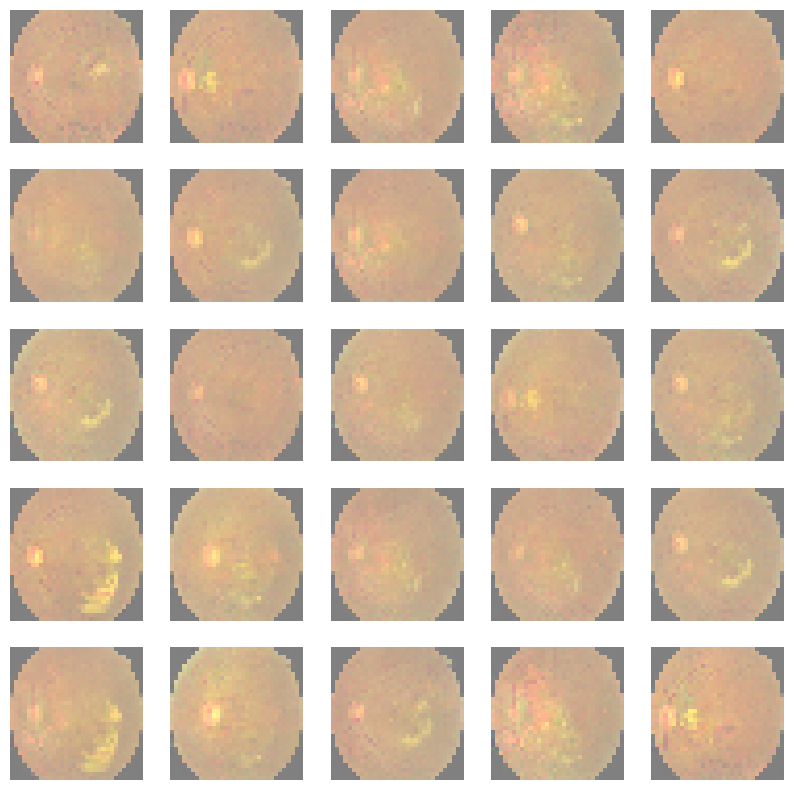

1/1 [==============================] - 0s 32ms/step
epoch: 11101/20000, d_loss: 0.46, g_loss: 3.04
1/1 [==============================] - 0s 30ms/step
epoch: 11201/20000, d_loss: 0.41, g_loss: 2.97
1/1 [==============================] - 0s 33ms/step


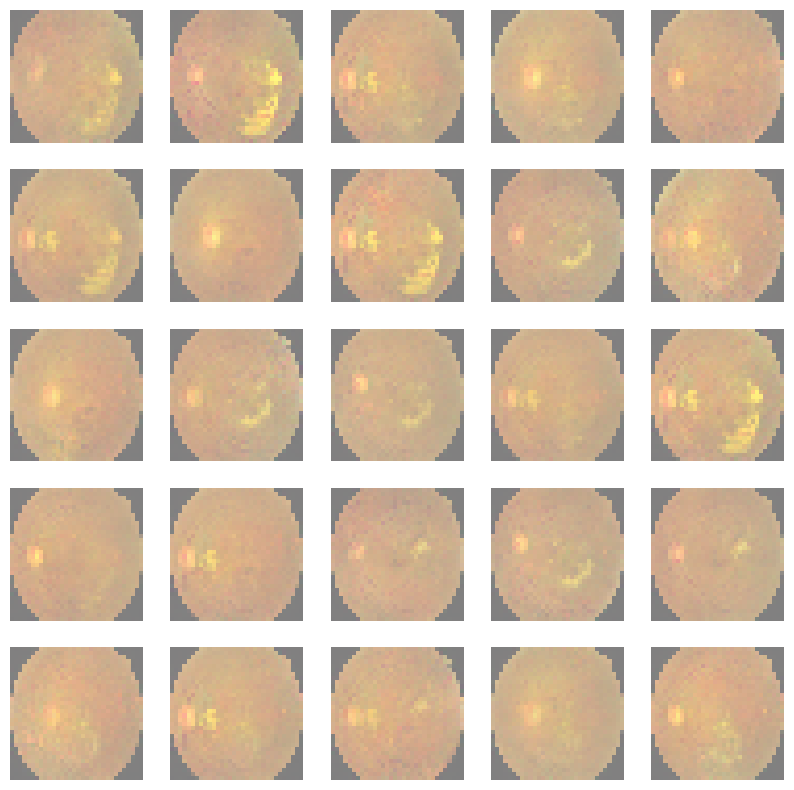

1/1 [==============================] - 0s 35ms/step
epoch: 11301/20000, d_loss: 0.38, g_loss: 3.25
1/1 [==============================] - 0s 30ms/step
epoch: 11401/20000, d_loss: 0.43, g_loss: 3.24
1/1 [==============================] - 0s 32ms/step


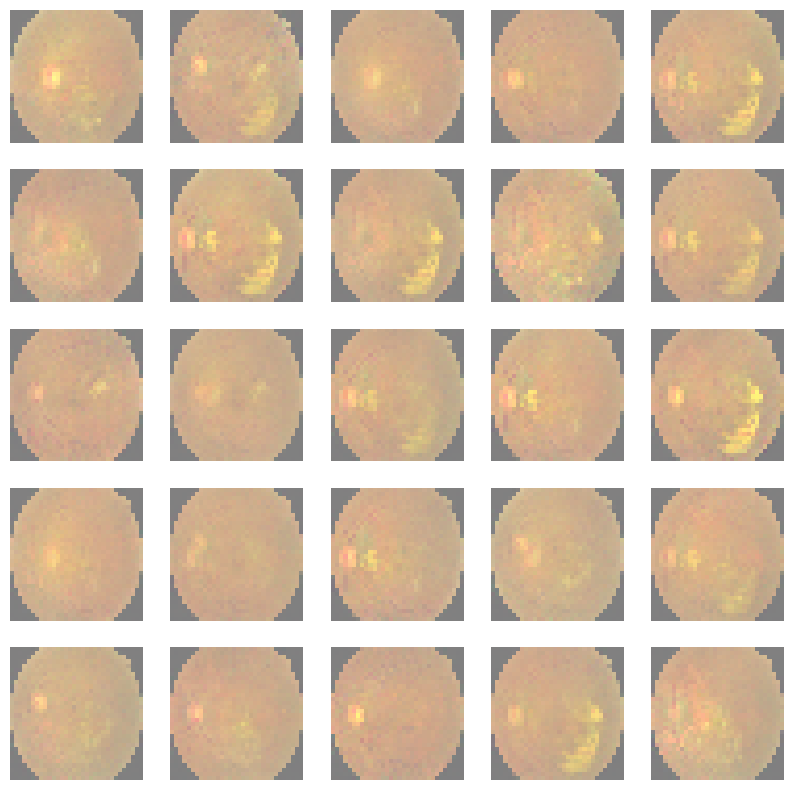

1/1 [==============================] - 0s 28ms/step
epoch: 11501/20000, d_loss: 0.43, g_loss: 3.32
1/1 [==============================] - 0s 28ms/step
epoch: 11601/20000, d_loss: 0.49, g_loss: 3.07
1/1 [==============================] - 0s 33ms/step


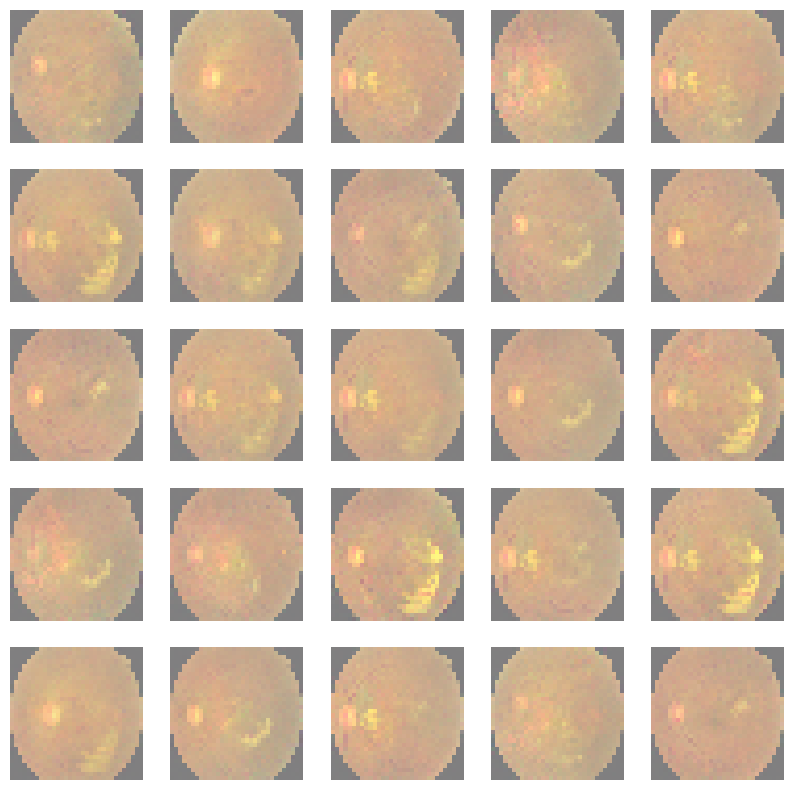

1/1 [==============================] - 0s 36ms/step
epoch: 11701/20000, d_loss: 0.38, g_loss: 3.19
1/1 [==============================] - 0s 26ms/step
epoch: 11801/20000, d_loss: 0.43, g_loss: 3.16
1/1 [==============================] - 0s 26ms/step


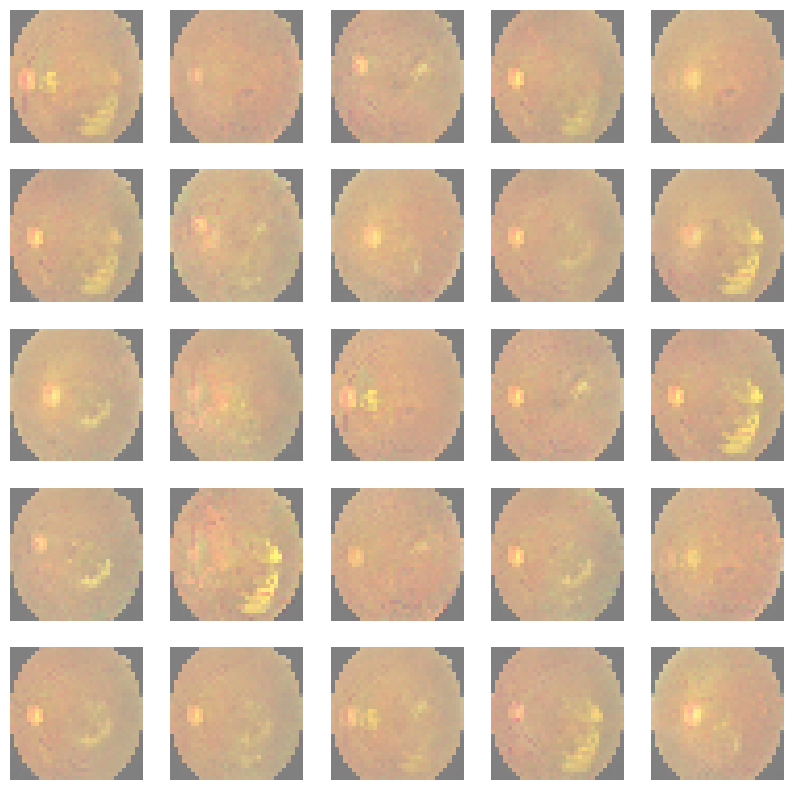

1/1 [==============================] - 0s 30ms/step
epoch: 11901/20000, d_loss: 0.40, g_loss: 3.27
1/1 [==============================] - 0s 25ms/step
epoch: 12001/20000, d_loss: 0.24, g_loss: 3.48
1/1 [==============================] - 0s 27ms/step


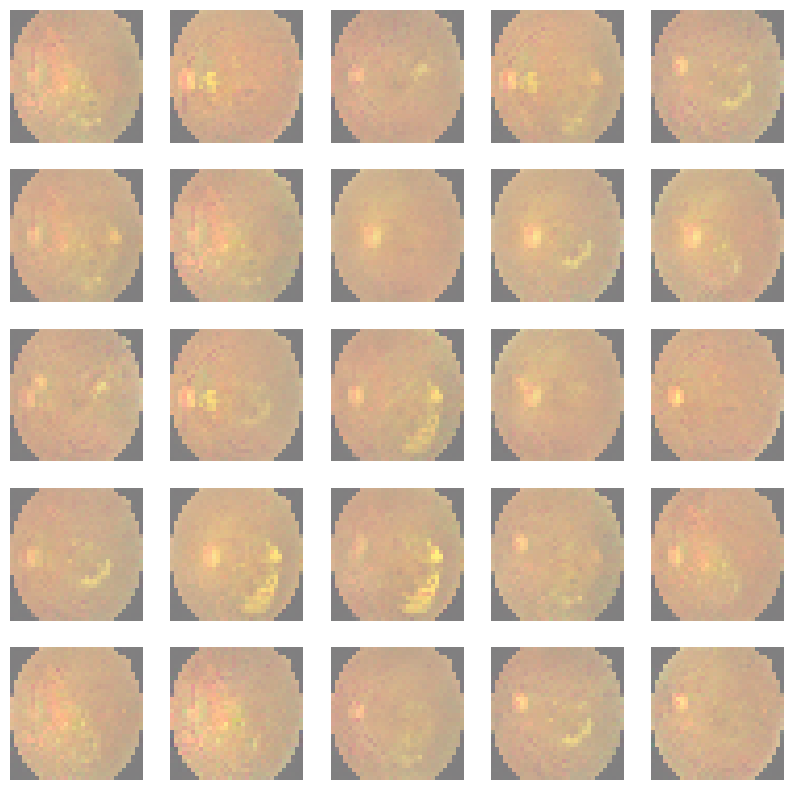

1/1 [==============================] - 0s 31ms/step
epoch: 12101/20000, d_loss: 0.46, g_loss: 3.17
1/1 [==============================] - 0s 36ms/step
epoch: 12201/20000, d_loss: 0.39, g_loss: 3.10
1/1 [==============================] - 0s 28ms/step


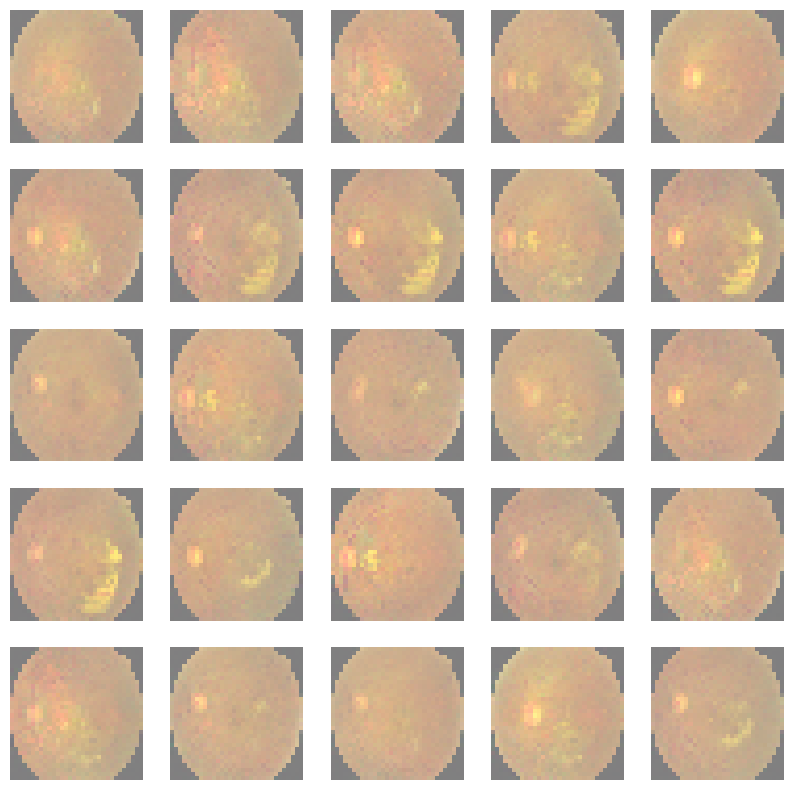

1/1 [==============================] - 0s 28ms/step
epoch: 12301/20000, d_loss: 0.40, g_loss: 3.20
1/1 [==============================] - 0s 31ms/step
epoch: 12401/20000, d_loss: 0.41, g_loss: 3.21
1/1 [==============================] - 0s 31ms/step


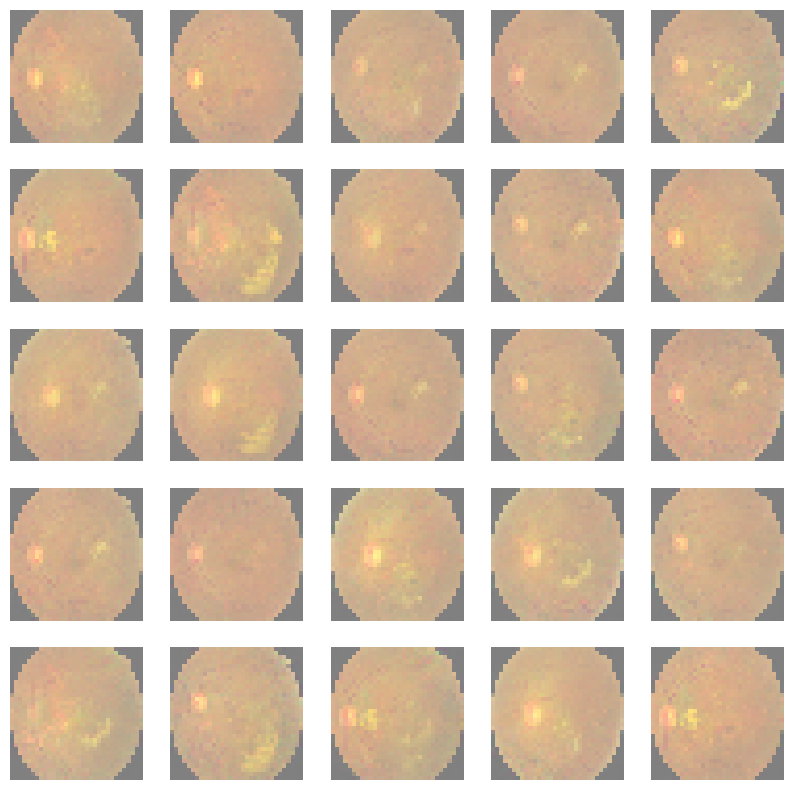

1/1 [==============================] - 0s 27ms/step
epoch: 12501/20000, d_loss: 0.40, g_loss: 3.44
1/1 [==============================] - 0s 26ms/step
epoch: 12601/20000, d_loss: 0.42, g_loss: 3.21
1/1 [==============================] - 0s 42ms/step


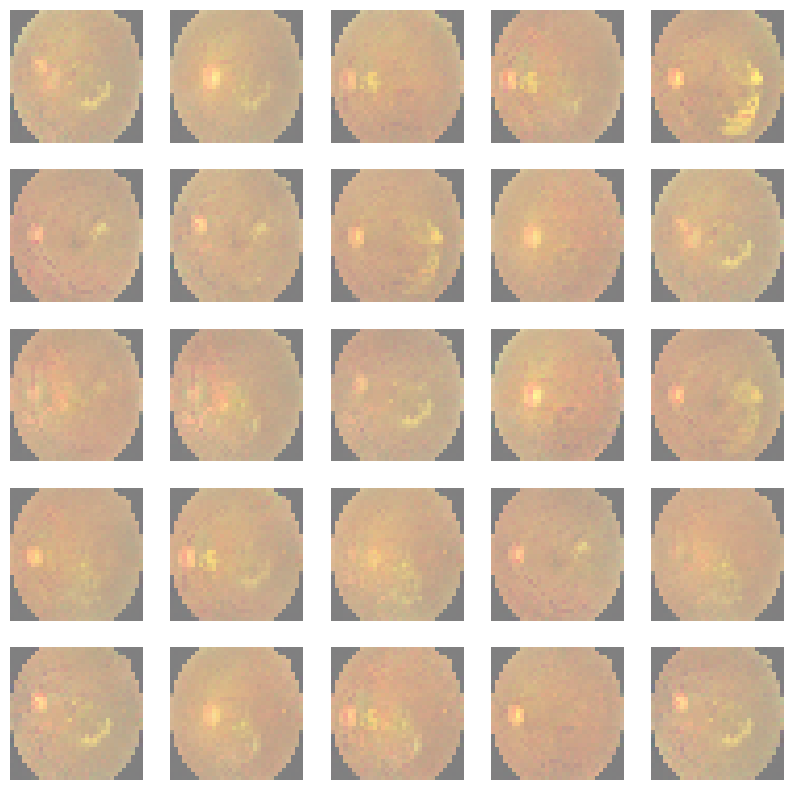

1/1 [==============================] - 0s 30ms/step
epoch: 12701/20000, d_loss: 0.34, g_loss: 3.18
1/1 [==============================] - 0s 27ms/step
epoch: 12801/20000, d_loss: 0.33, g_loss: 3.46
1/1 [==============================] - 0s 28ms/step


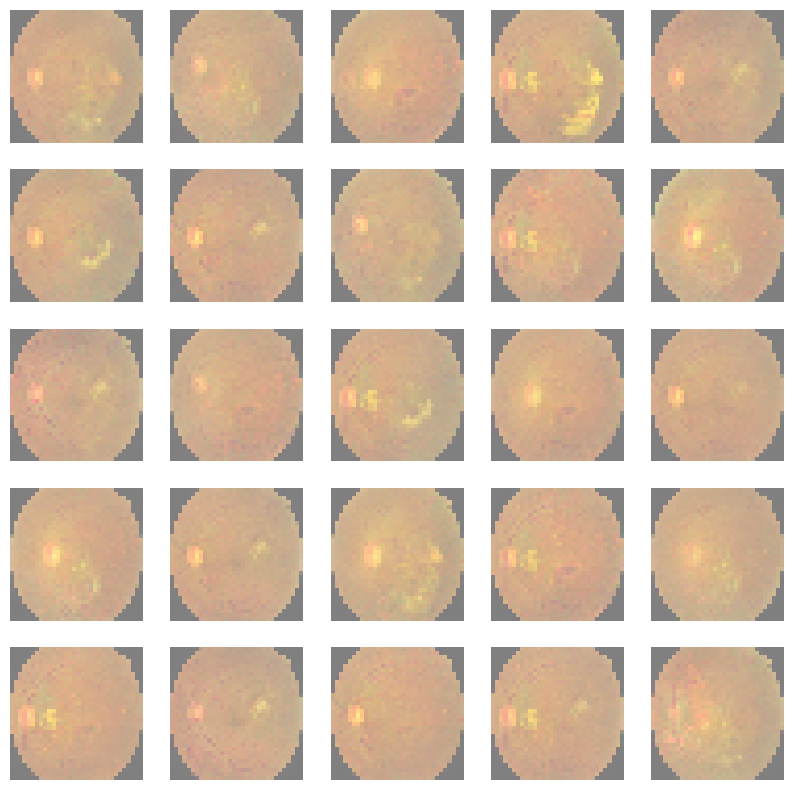

1/1 [==============================] - 0s 29ms/step
epoch: 12901/20000, d_loss: 0.50, g_loss: 3.06
1/1 [==============================] - 0s 24ms/step
epoch: 13001/20000, d_loss: 0.37, g_loss: 3.23
1/1 [==============================] - 0s 27ms/step


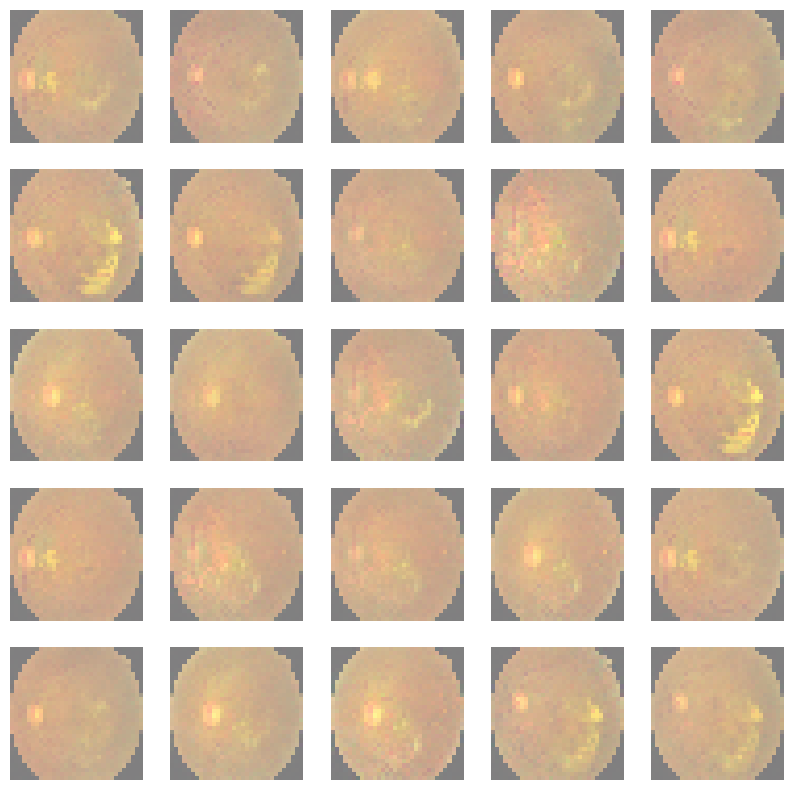

1/1 [==============================] - 0s 30ms/step
epoch: 13101/20000, d_loss: 0.37, g_loss: 3.71
1/1 [==============================] - 0s 62ms/step
epoch: 13201/20000, d_loss: 0.39, g_loss: 3.27
1/1 [==============================] - 0s 34ms/step


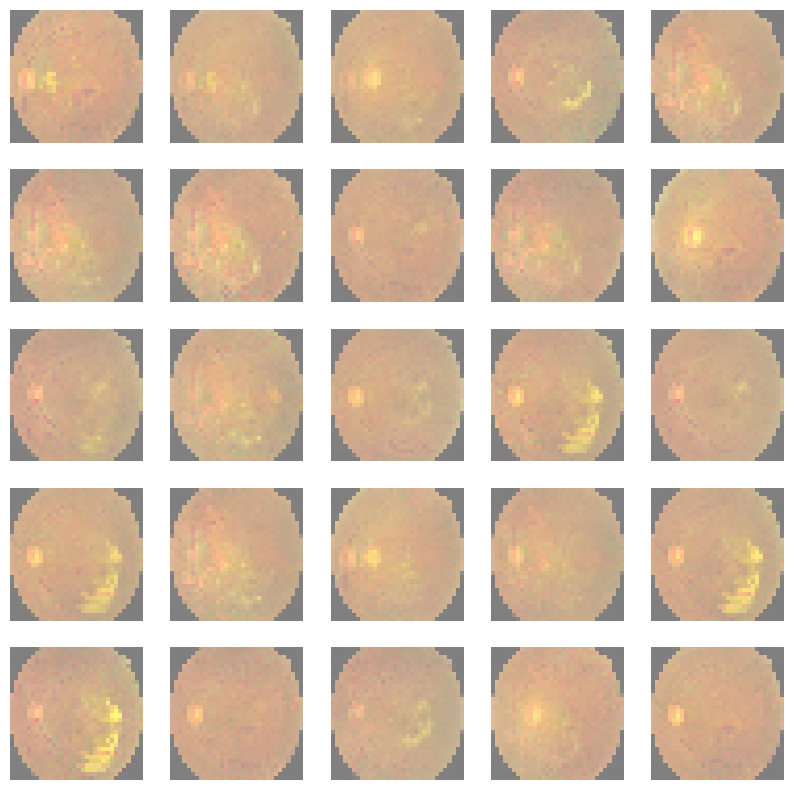

1/1 [==============================] - 0s 25ms/step
epoch: 13301/20000, d_loss: 0.36, g_loss: 3.29
1/1 [==============================] - 0s 25ms/step
epoch: 13401/20000, d_loss: 0.36, g_loss: 3.34
1/1 [==============================] - 0s 31ms/step


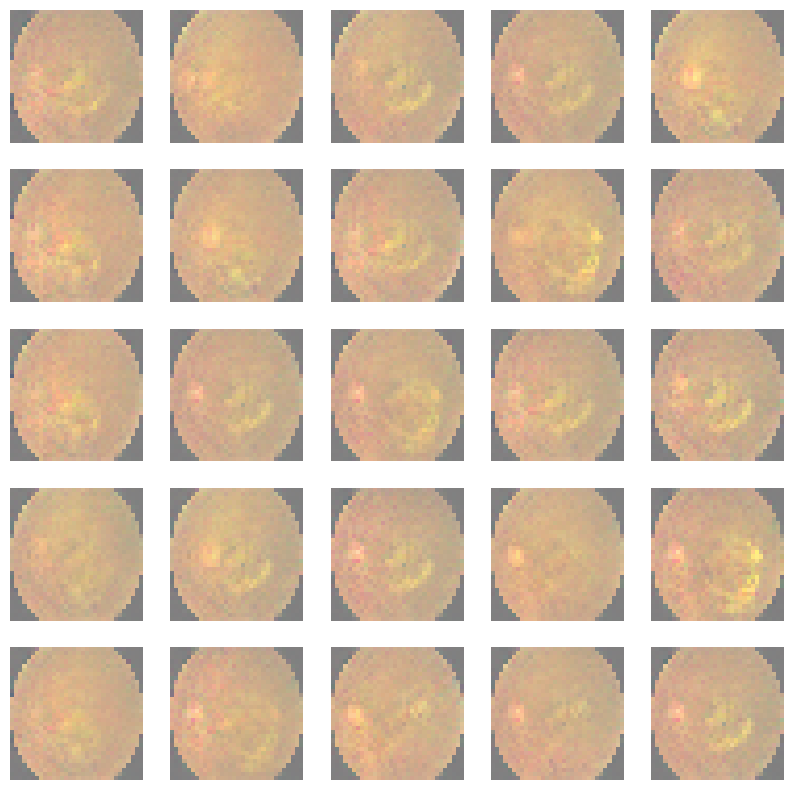

1/1 [==============================] - 0s 30ms/step
epoch: 13501/20000, d_loss: 0.39, g_loss: 3.18
1/1 [==============================] - 0s 25ms/step
epoch: 13601/20000, d_loss: 0.46, g_loss: 3.49
1/1 [==============================] - 0s 32ms/step


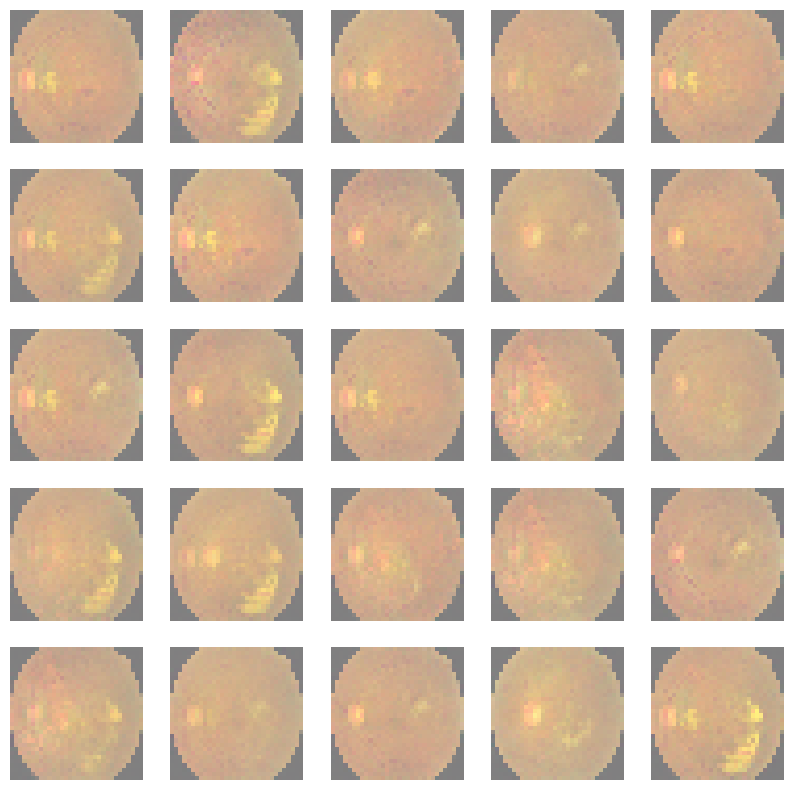

1/1 [==============================] - 0s 51ms/step
epoch: 13701/20000, d_loss: 0.41, g_loss: 3.25
1/1 [==============================] - 0s 68ms/step
epoch: 13801/20000, d_loss: 0.36, g_loss: 3.34
1/1 [==============================] - 0s 26ms/step


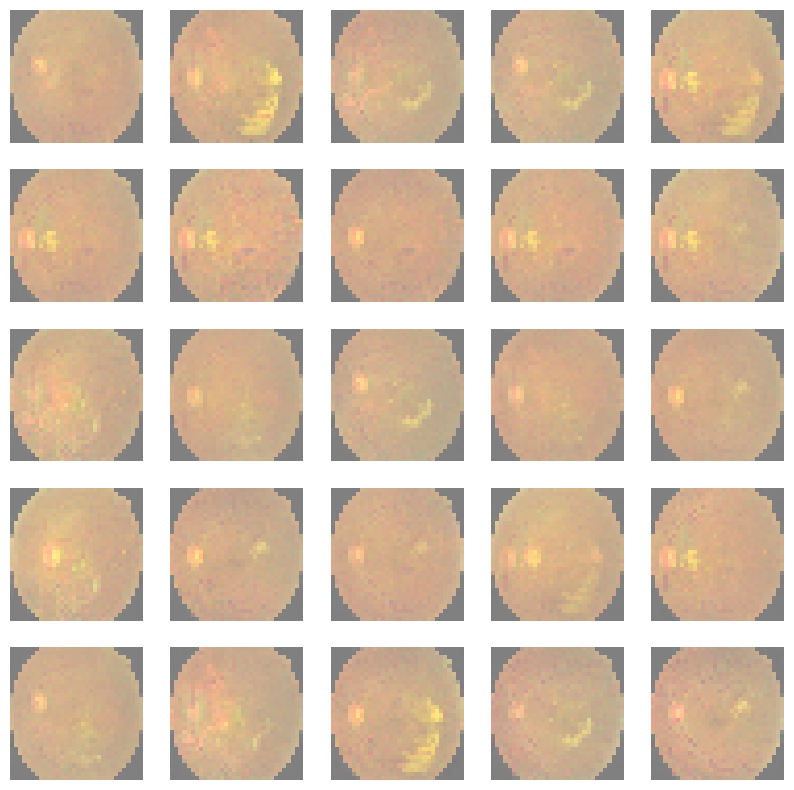

1/1 [==============================] - 0s 29ms/step
epoch: 13901/20000, d_loss: 0.38, g_loss: 3.37
1/1 [==============================] - 0s 28ms/step
epoch: 14001/20000, d_loss: 0.39, g_loss: 3.38
1/1 [==============================] - 0s 30ms/step


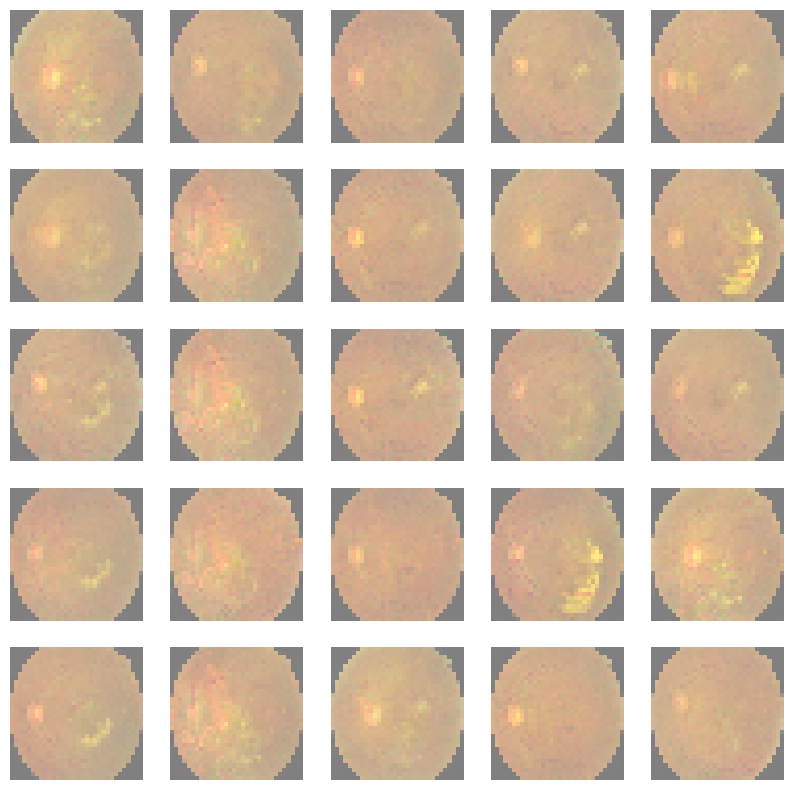

1/1 [==============================] - 0s 54ms/step
epoch: 14101/20000, d_loss: 0.40, g_loss: 3.45
1/1 [==============================] - 0s 60ms/step
epoch: 14201/20000, d_loss: 0.40, g_loss: 3.23
1/1 [==============================] - 0s 45ms/step


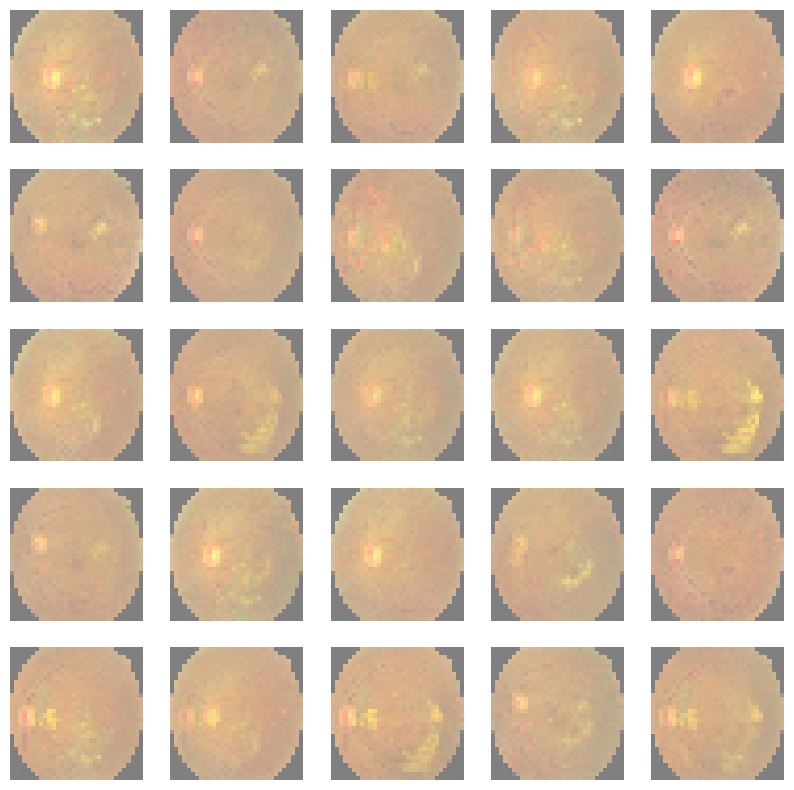

1/1 [==============================] - 0s 29ms/step
epoch: 14301/20000, d_loss: 0.43, g_loss: 3.50
1/1 [==============================] - 0s 29ms/step
epoch: 14401/20000, d_loss: 0.40, g_loss: 3.40
1/1 [==============================] - 0s 30ms/step


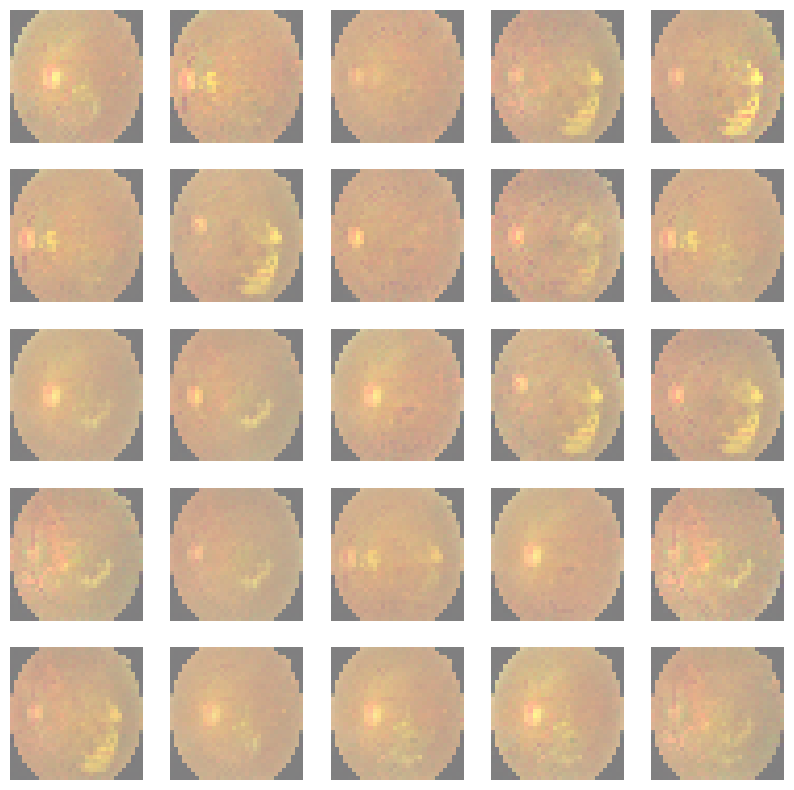

1/1 [==============================] - 0s 39ms/step
epoch: 14501/20000, d_loss: 0.35, g_loss: 3.51
1/1 [==============================] - 0s 34ms/step
epoch: 14601/20000, d_loss: 0.39, g_loss: 3.57
1/1 [==============================] - 0s 57ms/step


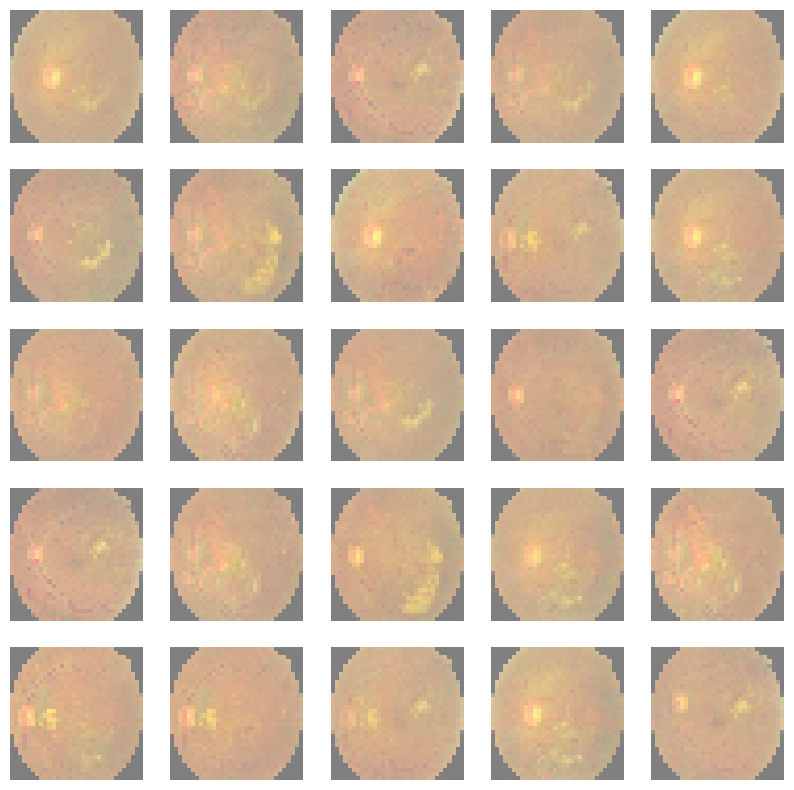

1/1 [==============================] - 0s 39ms/step
epoch: 14701/20000, d_loss: 0.34, g_loss: 3.61
1/1 [==============================] - 0s 26ms/step
epoch: 14801/20000, d_loss: 0.29, g_loss: 3.62
1/1 [==============================] - 0s 26ms/step


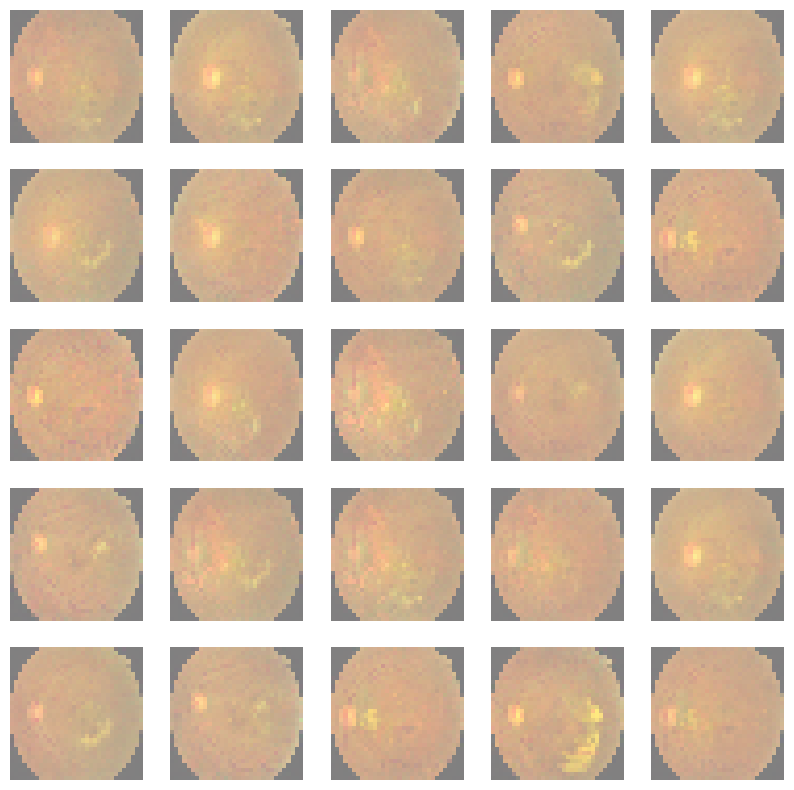

1/1 [==============================] - 0s 27ms/step
epoch: 14901/20000, d_loss: 0.30, g_loss: 3.67
1/1 [==============================] - 0s 25ms/step
epoch: 15001/20000, d_loss: 0.47, g_loss: 3.54
1/1 [==============================] - 0s 30ms/step


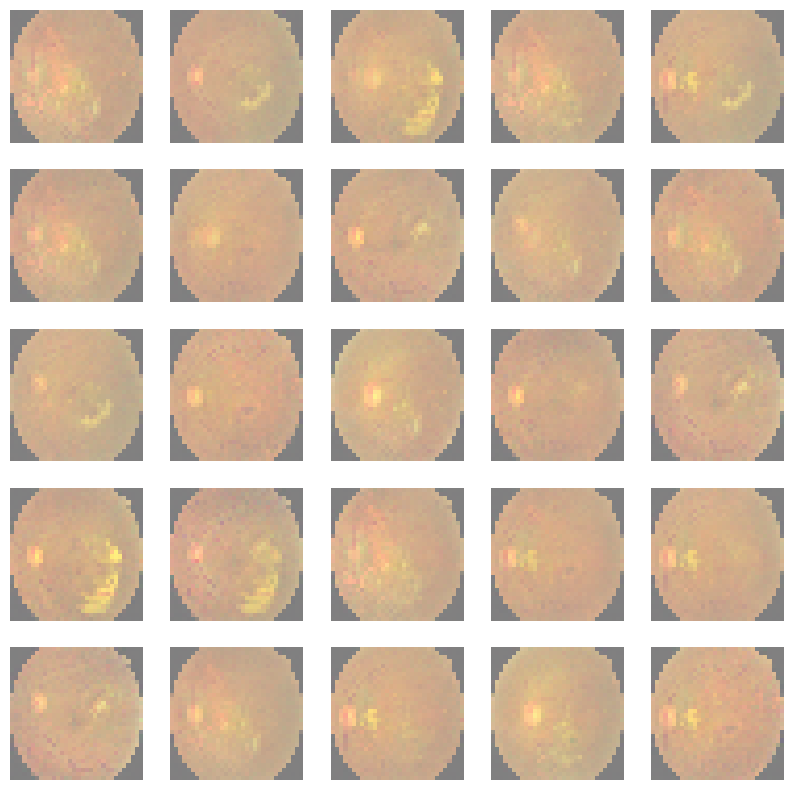

1/1 [==============================] - 0s 43ms/step
epoch: 15101/20000, d_loss: 0.43, g_loss: 3.60
1/1 [==============================] - 0s 28ms/step
epoch: 15201/20000, d_loss: 0.41, g_loss: 3.21
1/1 [==============================] - 0s 30ms/step


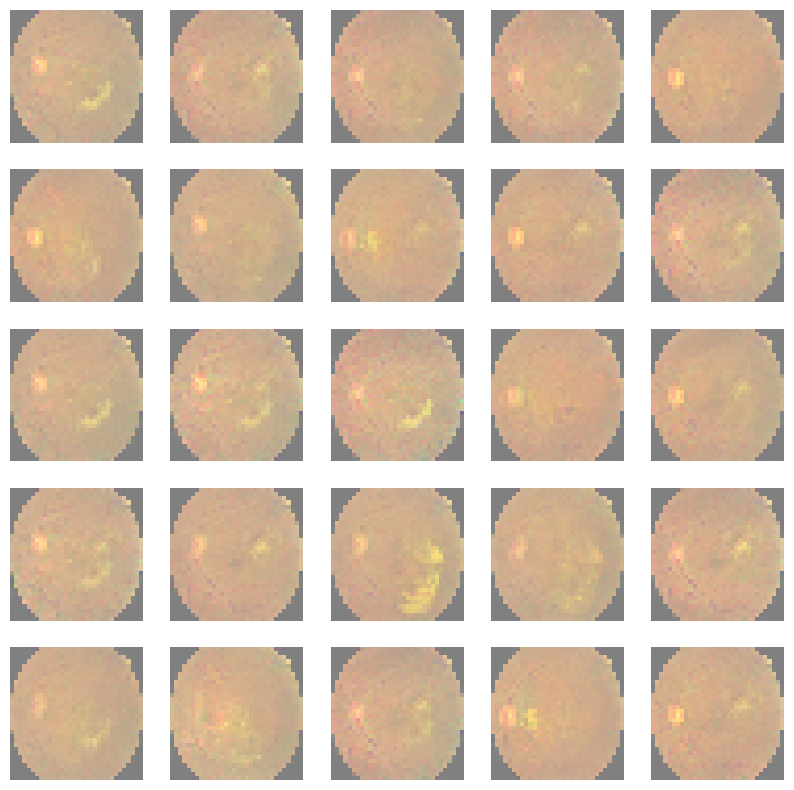

1/1 [==============================] - 0s 29ms/step
epoch: 15301/20000, d_loss: 0.29, g_loss: 3.45
1/1 [==============================] - 0s 30ms/step
epoch: 15401/20000, d_loss: 0.42, g_loss: 3.26
1/1 [==============================] - 0s 27ms/step


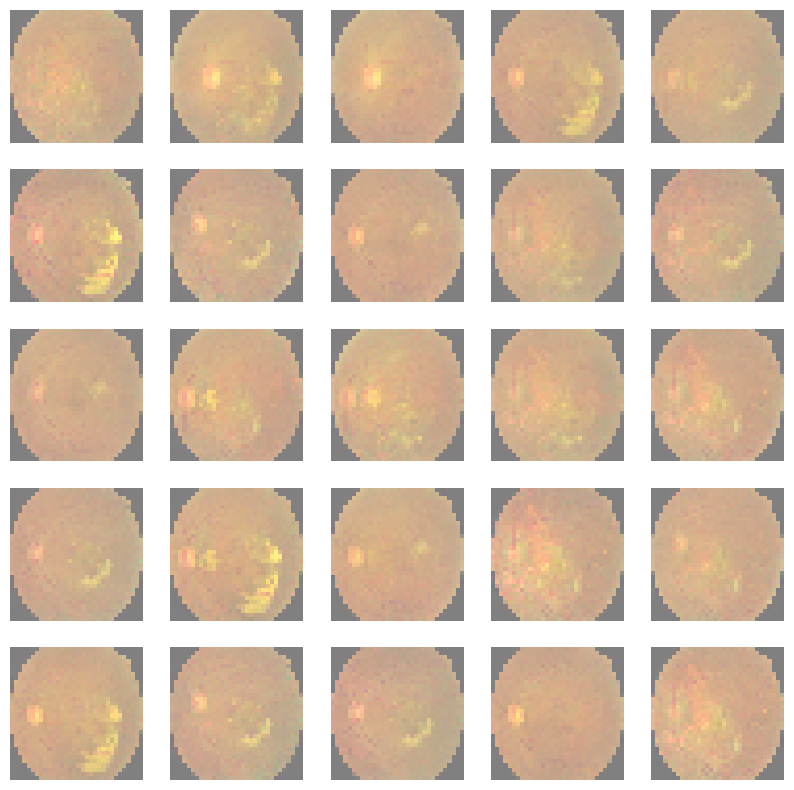

1/1 [==============================] - 0s 42ms/step
epoch: 15501/20000, d_loss: 0.44, g_loss: 3.52
1/1 [==============================] - 0s 27ms/step
epoch: 15601/20000, d_loss: 0.45, g_loss: 3.40
1/1 [==============================] - 0s 29ms/step


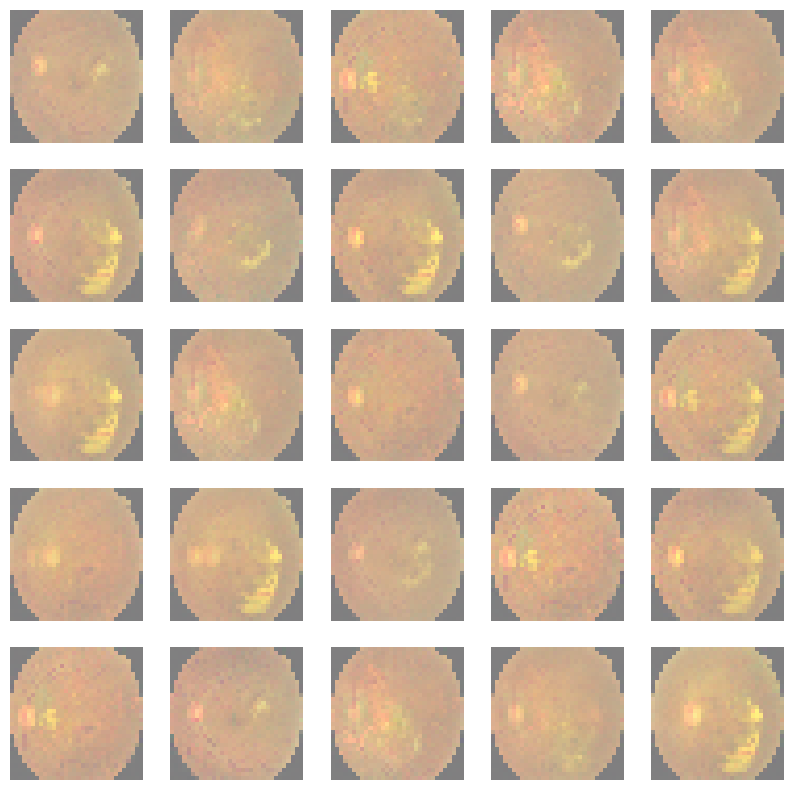

1/1 [==============================] - 0s 26ms/step
epoch: 15701/20000, d_loss: 0.34, g_loss: 3.42
1/1 [==============================] - 0s 34ms/step
epoch: 15801/20000, d_loss: 0.46, g_loss: 2.92
1/1 [==============================] - 0s 48ms/step


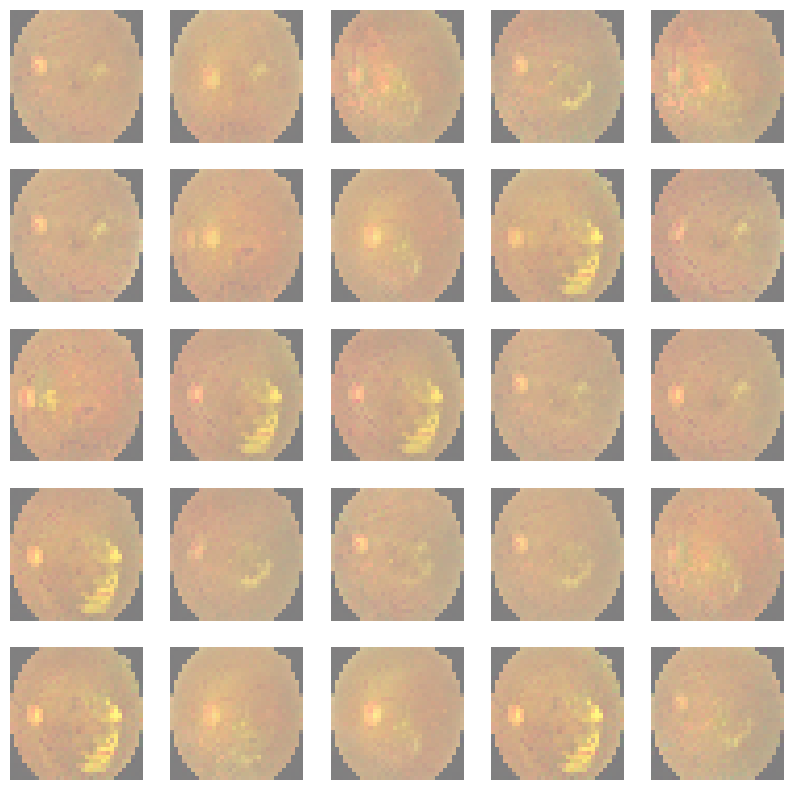

1/1 [==============================] - 0s 27ms/step
epoch: 15901/20000, d_loss: 0.34, g_loss: 3.35
1/1 [==============================] - 0s 28ms/step
epoch: 16001/20000, d_loss: 0.36, g_loss: 3.25
1/1 [==============================] - 0s 34ms/step


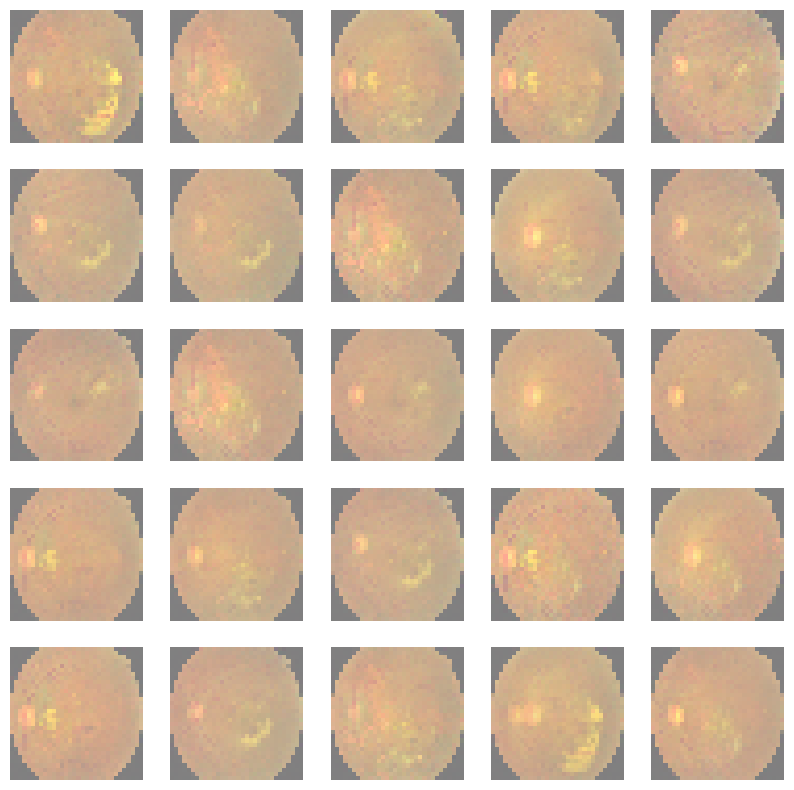

1/1 [==============================] - 0s 29ms/step
epoch: 16101/20000, d_loss: 0.34, g_loss: 3.22
1/1 [==============================] - 0s 26ms/step
epoch: 16201/20000, d_loss: 0.34, g_loss: 3.66
1/1 [==============================] - 0s 29ms/step


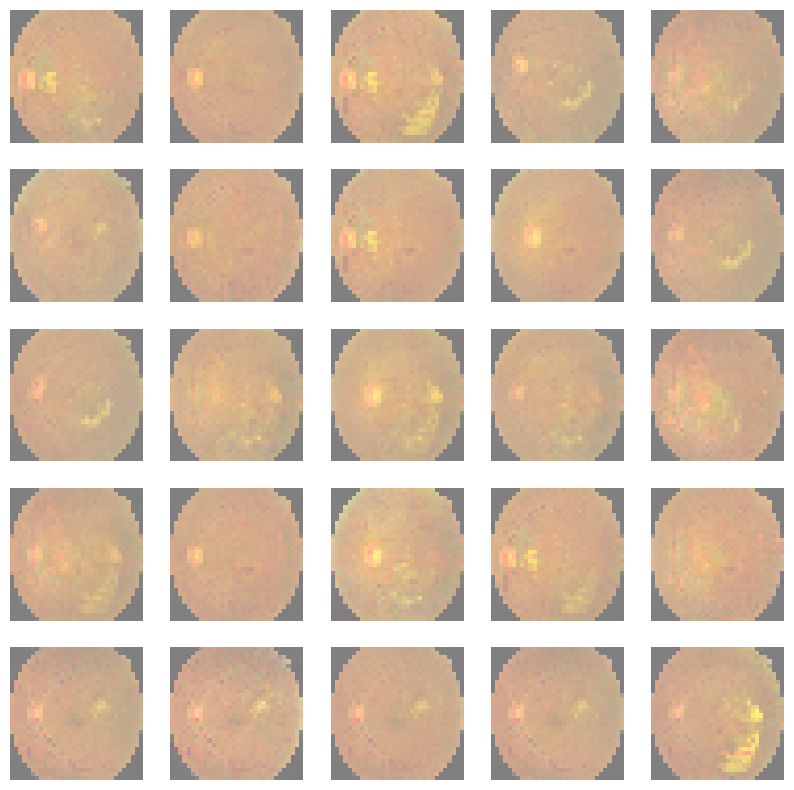

1/1 [==============================] - 0s 34ms/step
epoch: 16301/20000, d_loss: 0.45, g_loss: 3.26
1/1 [==============================] - 0s 28ms/step
epoch: 16401/20000, d_loss: 0.31, g_loss: 3.74
1/1 [==============================] - 0s 27ms/step


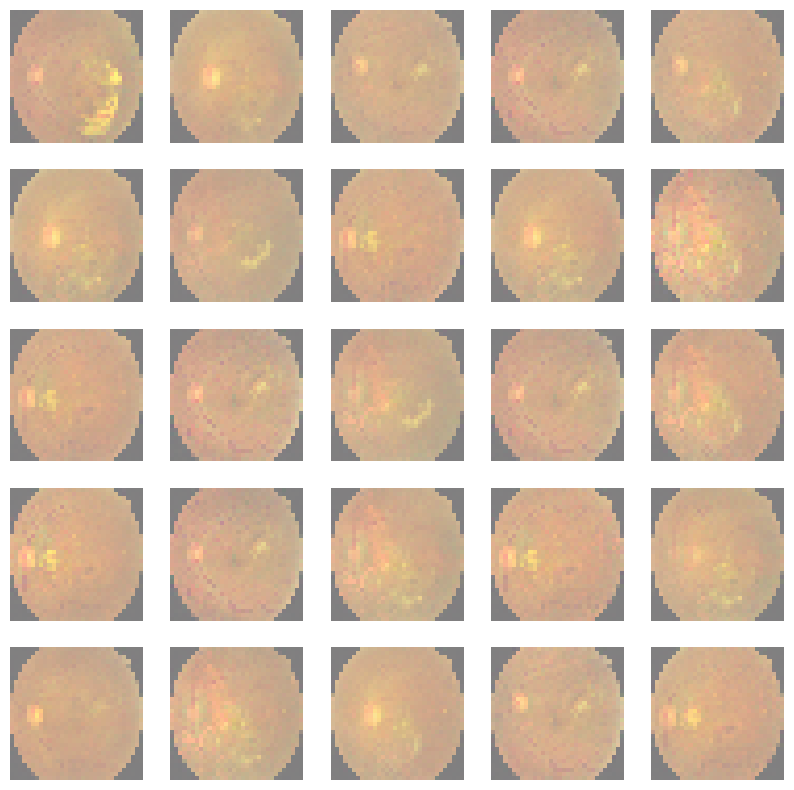

1/1 [==============================] - 0s 33ms/step
epoch: 16501/20000, d_loss: 0.40, g_loss: 3.65
1/1 [==============================] - 0s 48ms/step
epoch: 16601/20000, d_loss: 0.35, g_loss: 3.34
1/1 [==============================] - 0s 32ms/step


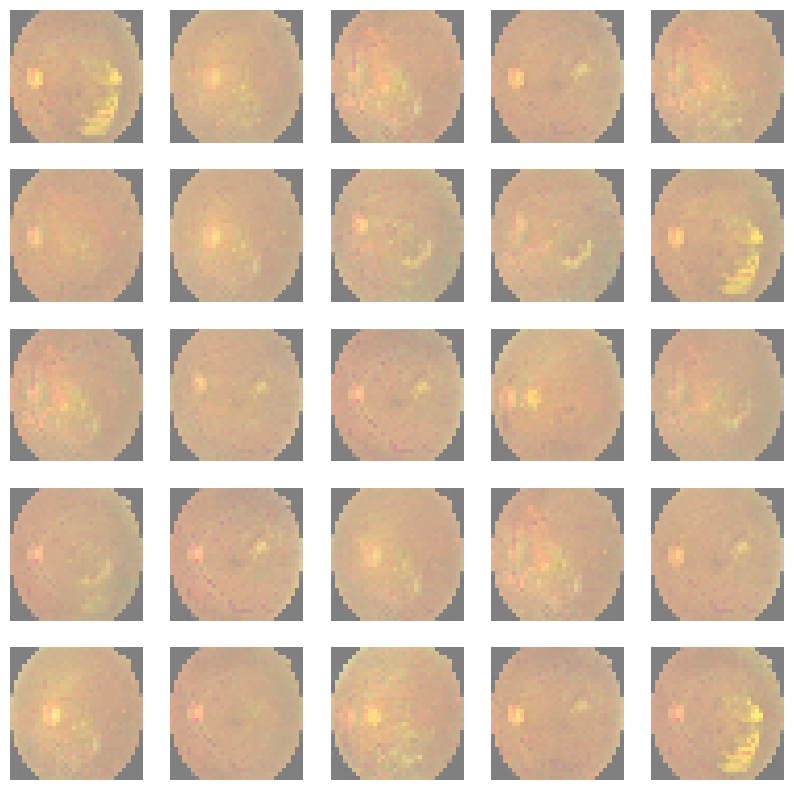

1/1 [==============================] - 0s 27ms/step
epoch: 16701/20000, d_loss: 0.55, g_loss: 3.66
1/1 [==============================] - 0s 25ms/step
epoch: 16801/20000, d_loss: 0.44, g_loss: 3.47
1/1 [==============================] - 0s 32ms/step


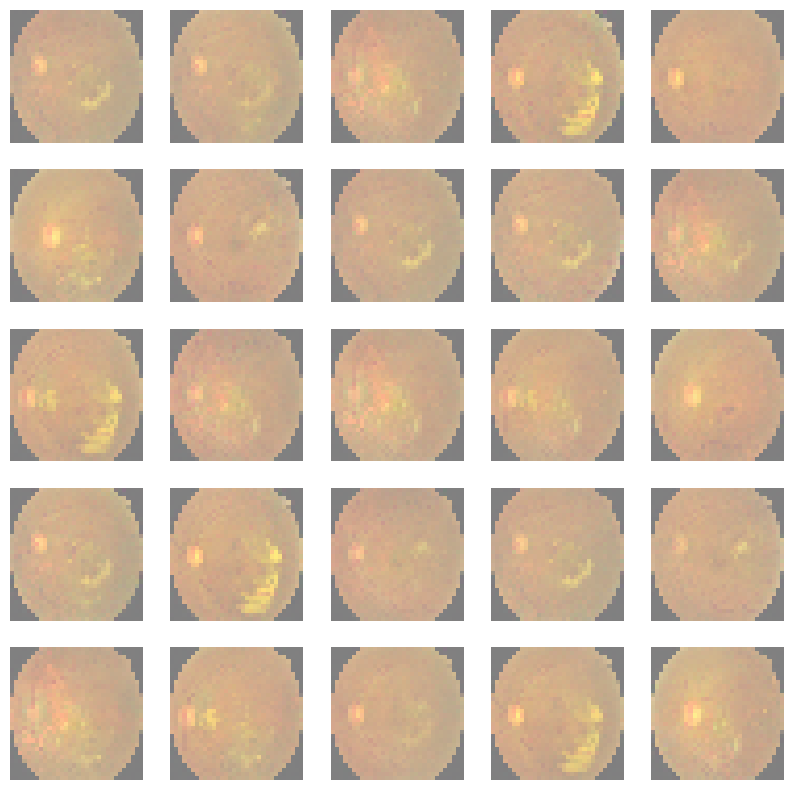

1/1 [==============================] - 0s 35ms/step
epoch: 16901/20000, d_loss: 0.48, g_loss: 3.42
1/1 [==============================] - 0s 28ms/step
epoch: 17001/20000, d_loss: 0.37, g_loss: 3.56
1/1 [==============================] - 0s 32ms/step


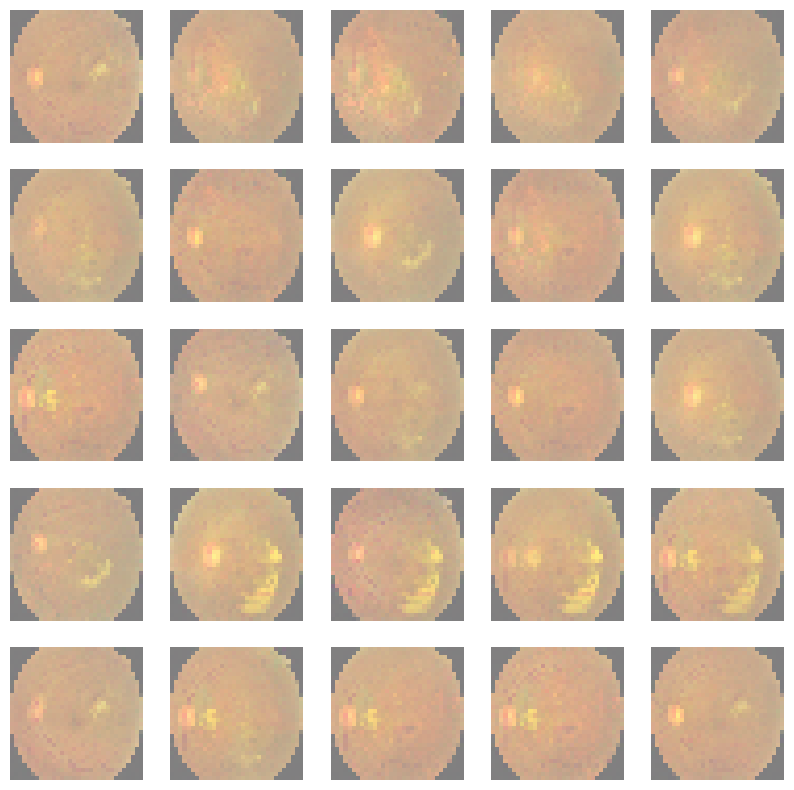

1/1 [==============================] - 0s 29ms/step
epoch: 17101/20000, d_loss: 0.44, g_loss: 3.20
1/1 [==============================] - 0s 27ms/step
epoch: 17201/20000, d_loss: 0.47, g_loss: 3.66
1/1 [==============================] - 0s 28ms/step


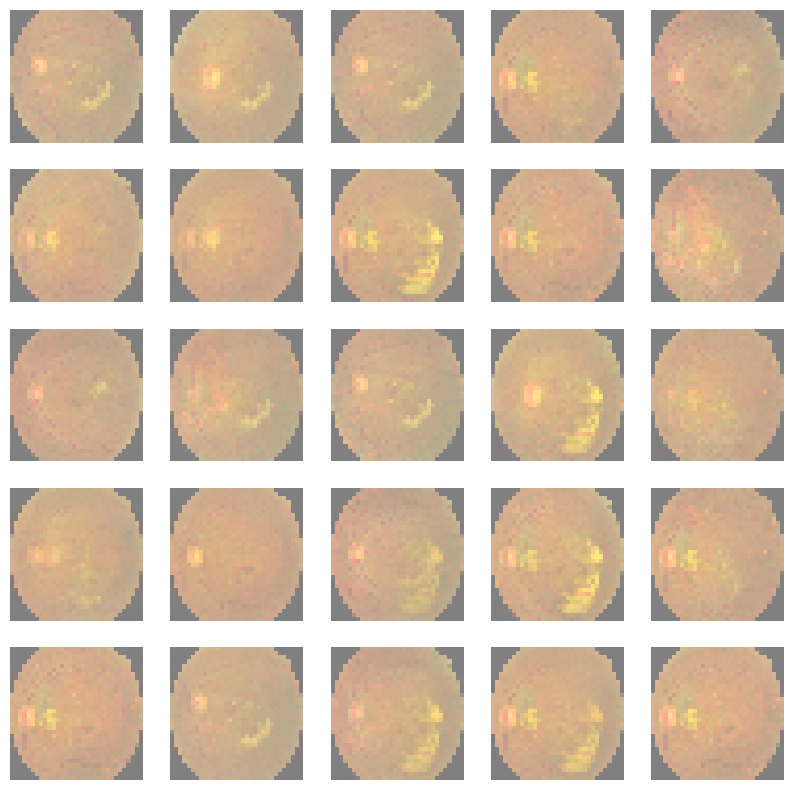

1/1 [==============================] - 0s 28ms/step
epoch: 17301/20000, d_loss: 0.32, g_loss: 3.39
1/1 [==============================] - 0s 26ms/step
epoch: 17401/20000, d_loss: 0.34, g_loss: 3.59
1/1 [==============================] - 0s 32ms/step


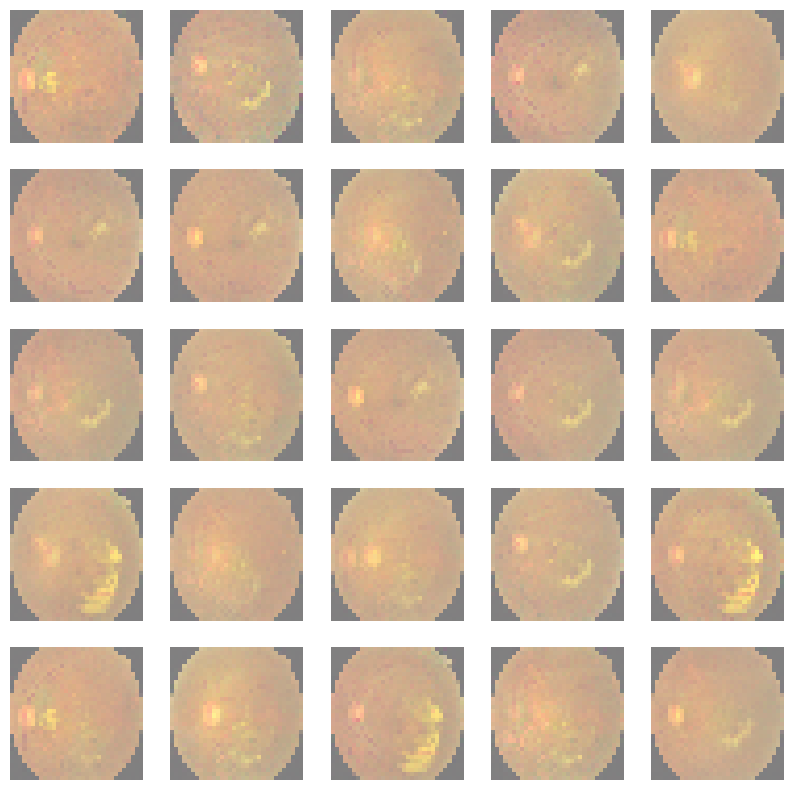

1/1 [==============================] - 0s 27ms/step
epoch: 17501/20000, d_loss: 0.48, g_loss: 3.35
1/1 [==============================] - 0s 31ms/step
epoch: 17601/20000, d_loss: 0.36, g_loss: 3.30
1/1 [==============================] - 0s 31ms/step


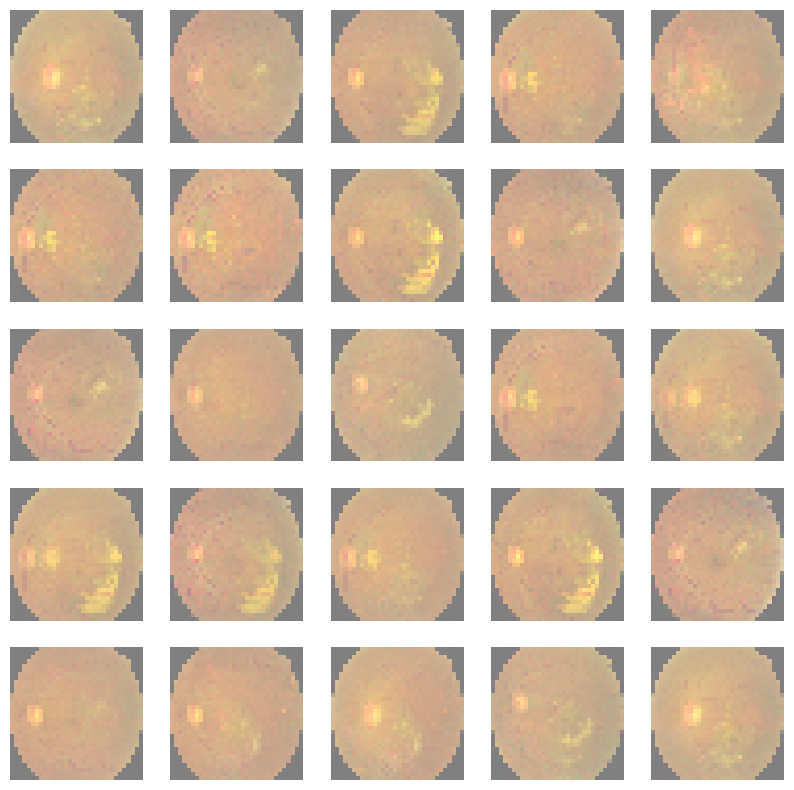

1/1 [==============================] - 0s 27ms/step
epoch: 17701/20000, d_loss: 0.30, g_loss: 3.82
1/1 [==============================] - 0s 26ms/step
epoch: 17801/20000, d_loss: 0.32, g_loss: 3.32
1/1 [==============================] - 0s 31ms/step


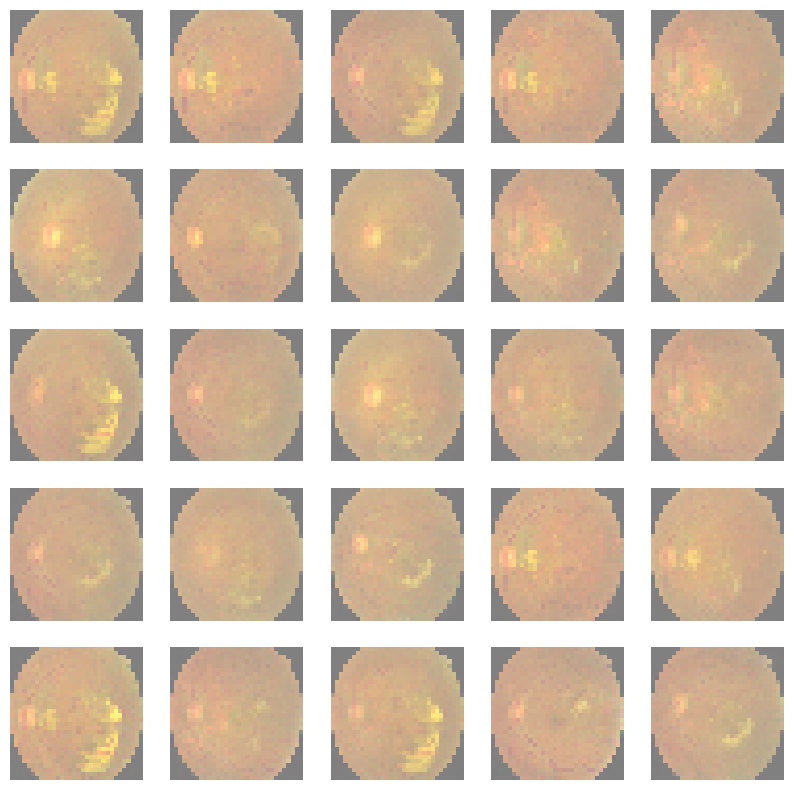

1/1 [==============================] - 0s 27ms/step
epoch: 17901/20000, d_loss: 0.31, g_loss: 3.25
1/1 [==============================] - 0s 27ms/step
epoch: 18001/20000, d_loss: 0.32, g_loss: 3.52
1/1 [==============================] - 0s 27ms/step


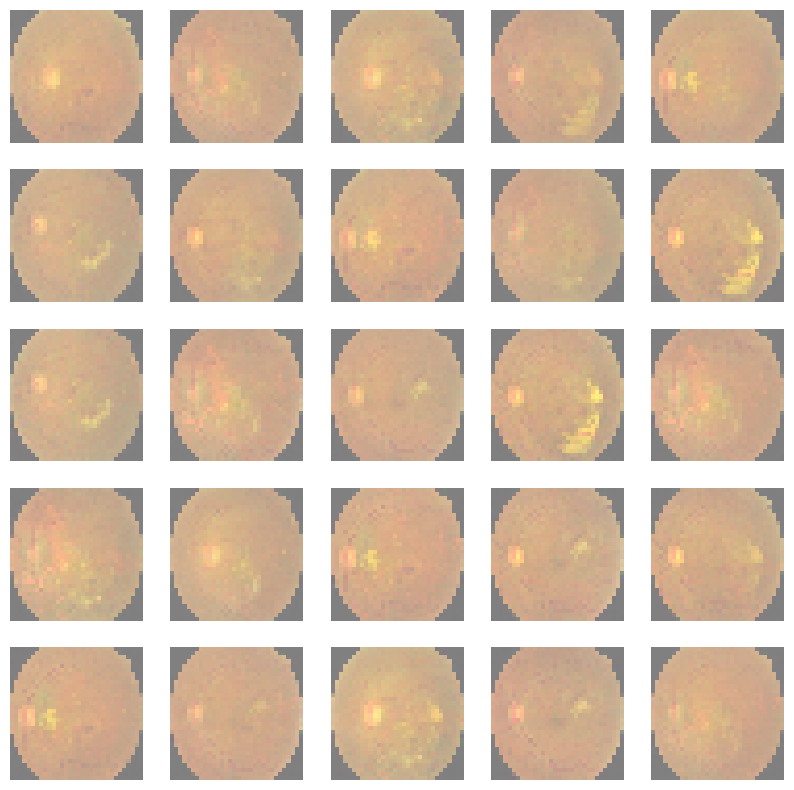

1/1 [==============================] - 0s 41ms/step
epoch: 18101/20000, d_loss: 0.40, g_loss: 3.57
1/1 [==============================] - 0s 36ms/step
epoch: 18201/20000, d_loss: 0.38, g_loss: 3.43
1/1 [==============================] - 0s 26ms/step


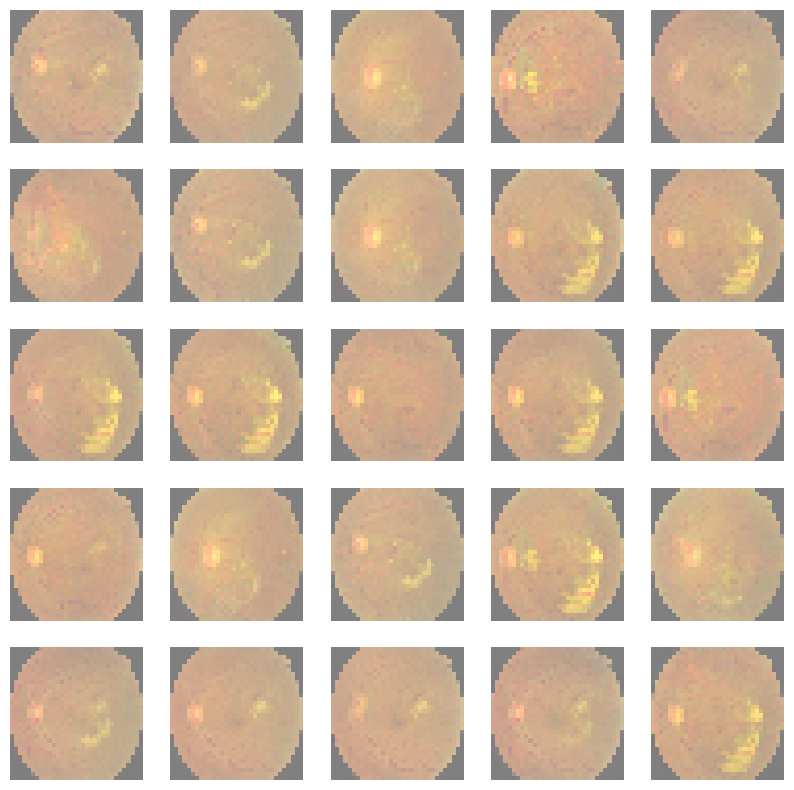

1/1 [==============================] - 0s 27ms/step
epoch: 18301/20000, d_loss: 0.36, g_loss: 4.06
1/1 [==============================] - 0s 31ms/step
epoch: 18401/20000, d_loss: 0.43, g_loss: 3.42
1/1 [==============================] - 0s 30ms/step


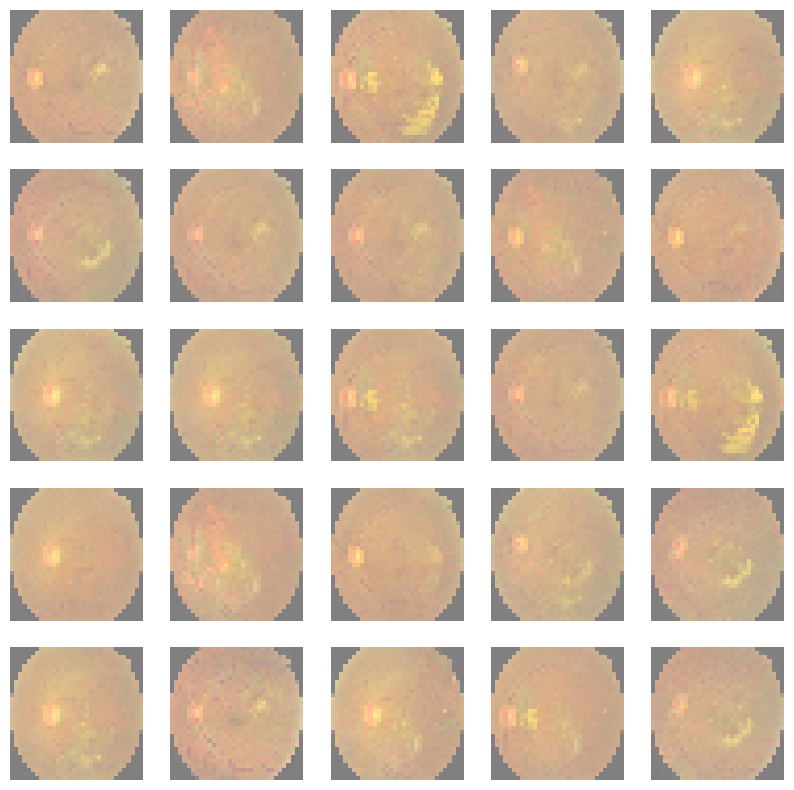

1/1 [==============================] - 0s 28ms/step
epoch: 18501/20000, d_loss: 0.51, g_loss: 3.62
1/1 [==============================] - 0s 30ms/step
epoch: 18601/20000, d_loss: 0.32, g_loss: 3.73
1/1 [==============================] - 0s 31ms/step


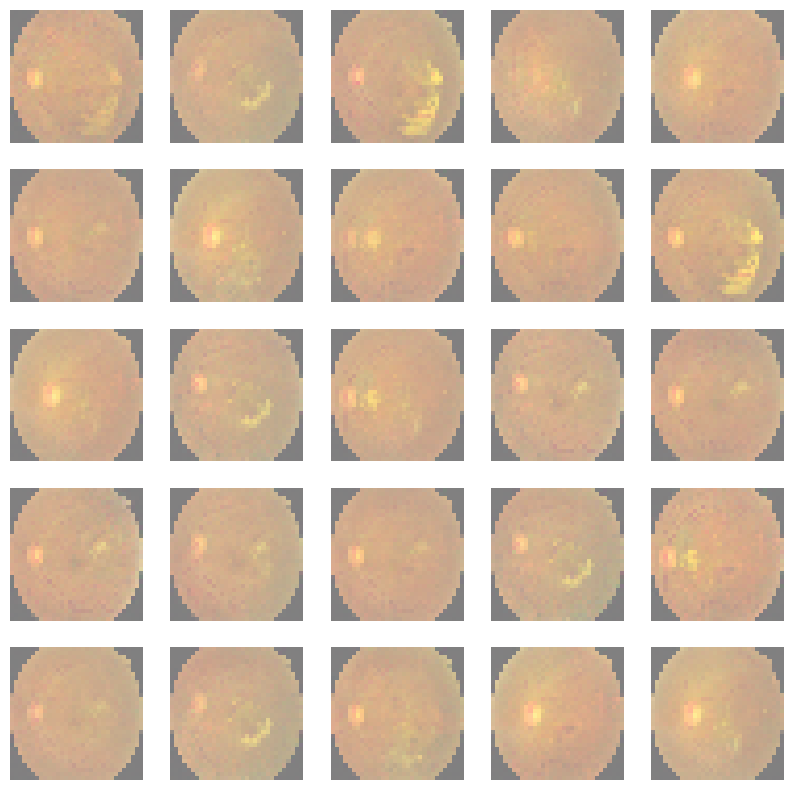

1/1 [==============================] - 0s 43ms/step
epoch: 18701/20000, d_loss: 0.47, g_loss: 3.62
1/1 [==============================] - 0s 27ms/step
epoch: 18801/20000, d_loss: 0.35, g_loss: 3.21
1/1 [==============================] - 0s 27ms/step


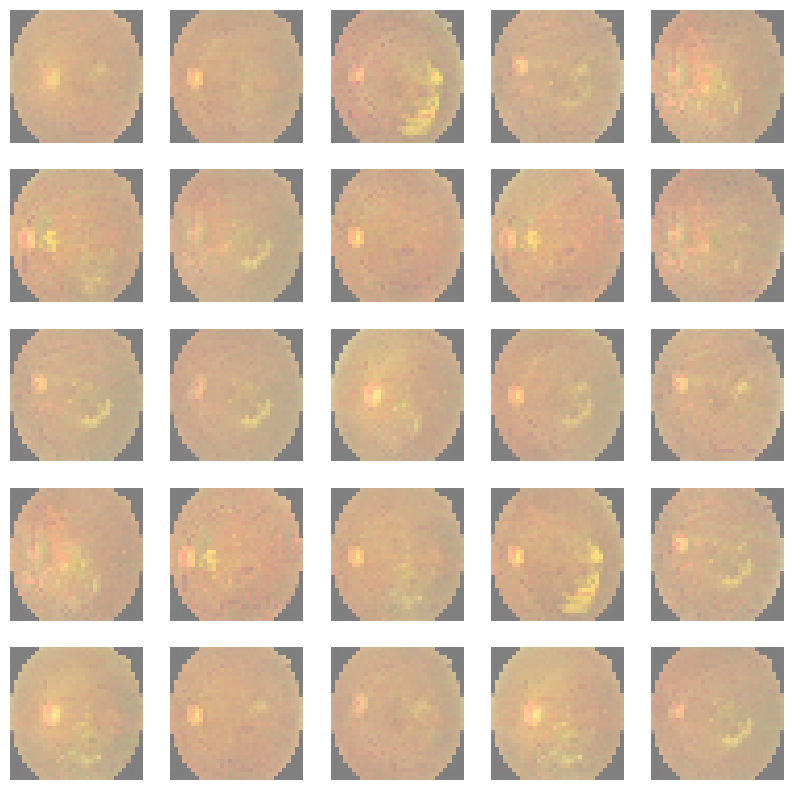

1/1 [==============================] - 0s 27ms/step
epoch: 18901/20000, d_loss: 0.37, g_loss: 3.57
1/1 [==============================] - 0s 27ms/step
epoch: 19001/20000, d_loss: 0.38, g_loss: 3.72
1/1 [==============================] - 0s 28ms/step


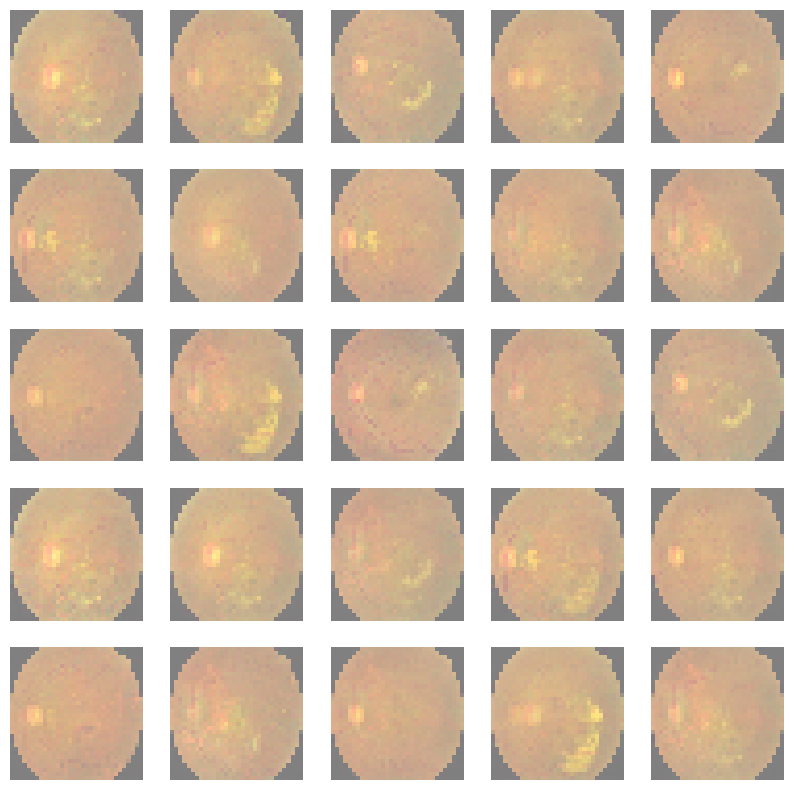

1/1 [==============================] - 0s 47ms/step
epoch: 19101/20000, d_loss: 0.32, g_loss: 3.49
1/1 [==============================] - 0s 25ms/step
epoch: 19201/20000, d_loss: 0.36, g_loss: 3.74
1/1 [==============================] - 0s 27ms/step


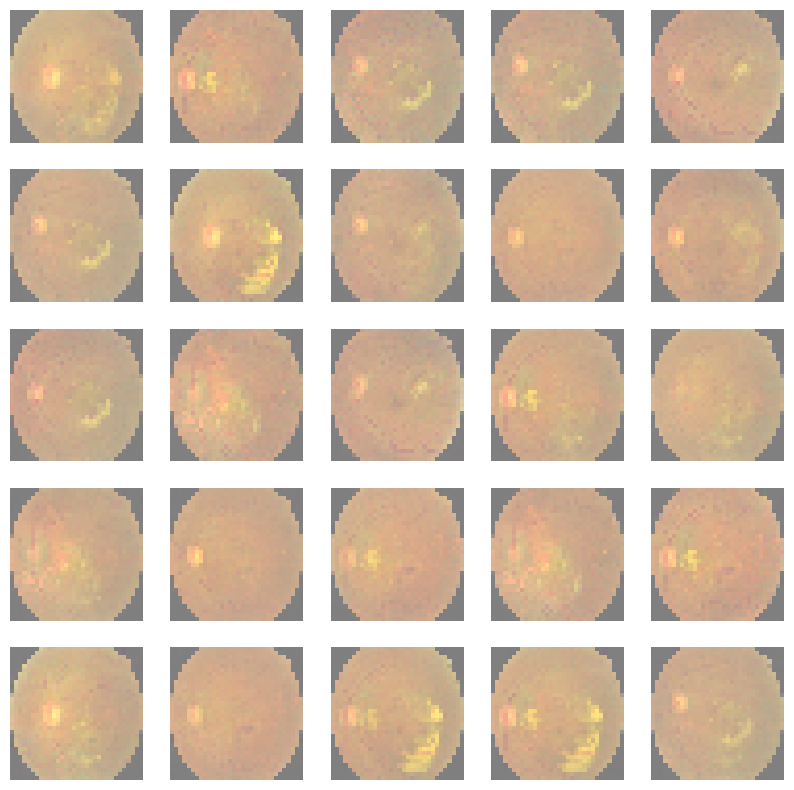

1/1 [==============================] - 0s 30ms/step
epoch: 19301/20000, d_loss: 0.43, g_loss: 3.67
1/1 [==============================] - 0s 39ms/step
epoch: 19401/20000, d_loss: 0.40, g_loss: 3.88
1/1 [==============================] - 0s 34ms/step


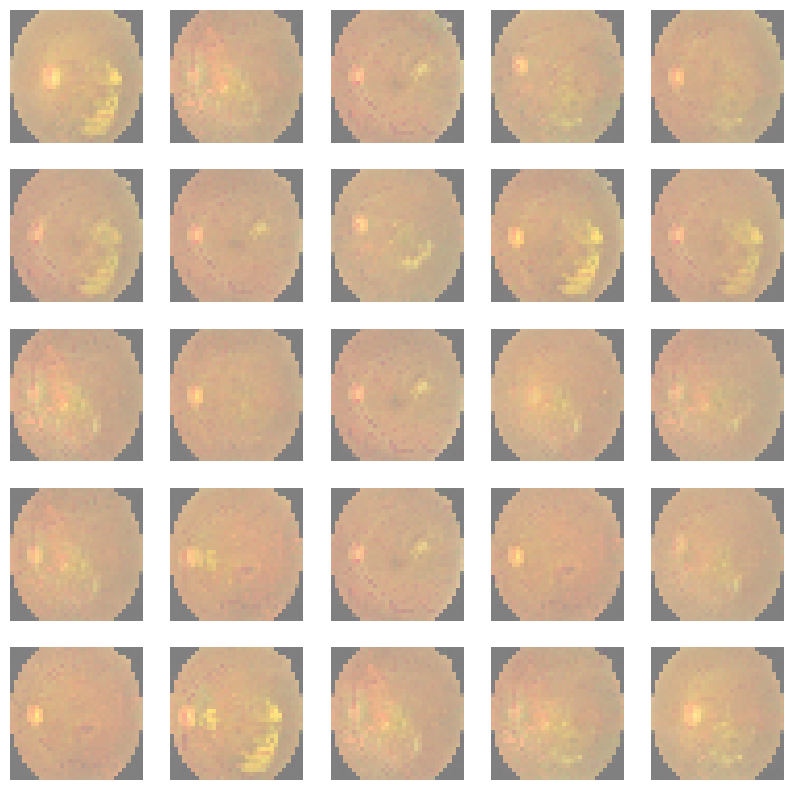

1/1 [==============================] - 0s 29ms/step
epoch: 19501/20000, d_loss: 0.39, g_loss: 3.43
1/1 [==============================] - 0s 39ms/step
epoch: 19601/20000, d_loss: 0.32, g_loss: 3.61
1/1 [==============================] - 0s 40ms/step


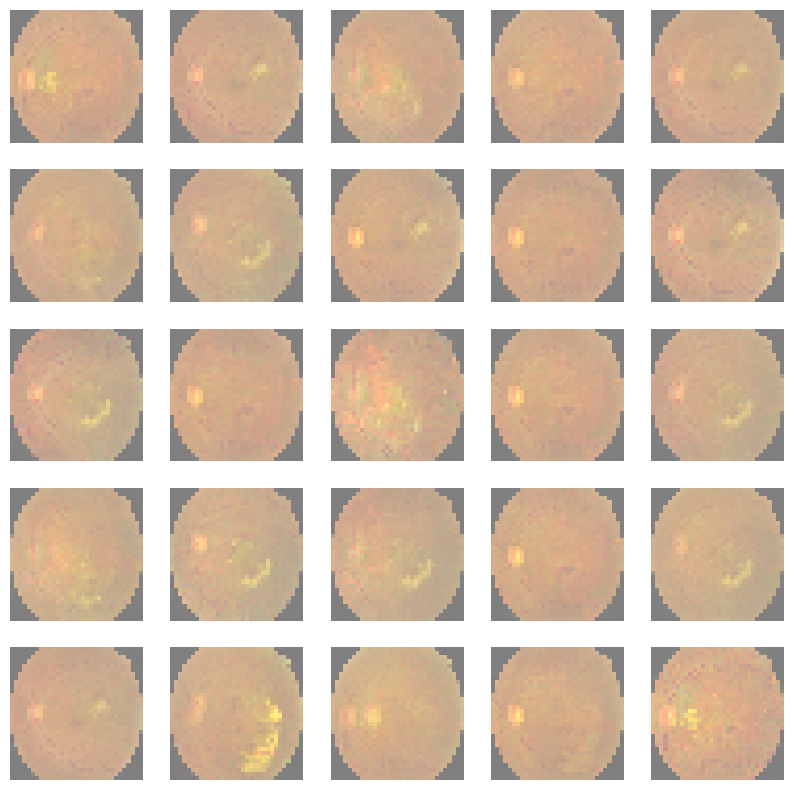

1/1 [==============================] - 0s 27ms/step
epoch: 19701/20000, d_loss: 0.30, g_loss: 3.35
1/1 [==============================] - 0s 28ms/step
epoch: 19801/20000, d_loss: 0.44, g_loss: 3.16
1/1 [==============================] - 0s 27ms/step


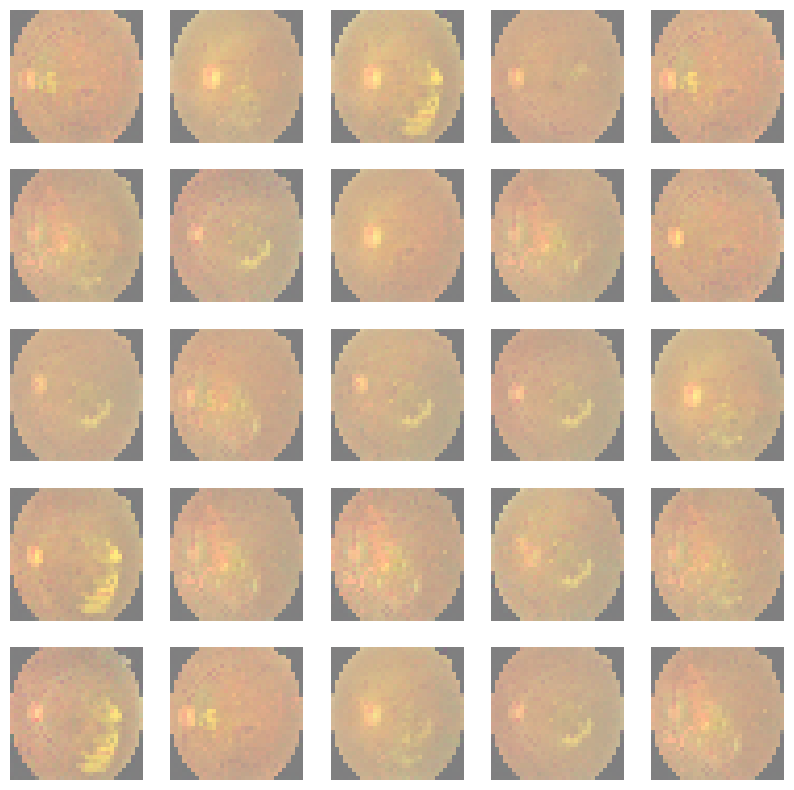

1/1 [==============================] - 0s 28ms/step
epoch: 19901/20000, d_loss: 0.51, g_loss: 3.69
1/1 [==============================] - 0s 53ms/step


KeyboardInterrupt: 

In [ ]:
# Training loop
batch_size = 32
epochs = 20000
latent_dim = 128
ones = np.ones(batch_size)
zeros = np.zeros(batch_size)
d_losses = []
g_losses = []
for epoch in range(epochs):
    idx = np.random.randint(0, x_train.shape[0], batch_size)
    real_imgs = x_train[idx]
    noise = np.random.randn(batch_size, latent_dim)
    fake_imgs = generator.predict(noise)
    d_loss_real, _ = discriminator.train_on_batch(real_imgs, ones)
    d_loss_fake, _ = discriminator.train_on_batch(fake_imgs, zeros)
    d_loss = 0.5 * (d_loss_real + d_loss_fake)
    noise = np.random.randn(batch_size, latent_dim)
    fake = generator.predict(np.random.randn(1, 128))
    g_loss = combined_model_gen.train_on_batch(noise, ones)
    d_losses.append(d_loss)
    g_losses.append(g_loss)
    if epoch % 100 == 0:
        print(f"epoch: {epoch+1}/{epochs}, d_loss: {d_loss:.2f}, g_loss: {g_loss:.2f}")

    if epoch % 200 == 0:
        # Save generated images
        sample_images(epoch)
        rows, cols = 5, 5
        noise = np.random.randn(rows * cols, latent_dim)
        imgs = generator.predict(noise)
        imgs = 0.5 * imgs + 0.5
        fig, axs = plt.subplots(rows, cols, figsize=(10, 10))
        idx = 0
        for i in range(rows):
            for j in range(cols):
                axs[i, j].imshow(imgs[idx])
                axs[i, j].axis('off')
                idx += 1
        plt.show()

In [ ]:
# Saving the Generator Model
generator.save('generator.h5')

In [ ]:
# Loading the Generator Model
generator = tf.keras.models.load_model('/content/generator.h5')

1/1 [==============================] - 0s 18ms/step


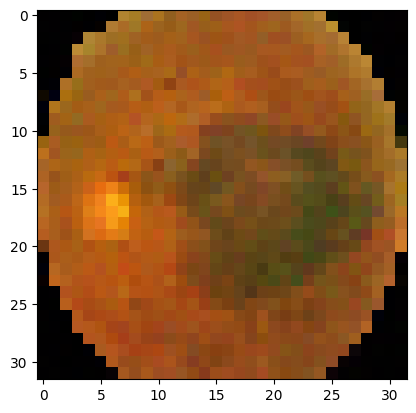

In [ ]:
plt.imshow(generator.predict(np.random.randn(1, 128))[0])

1/1 [==============================] - 0s 17ms/step


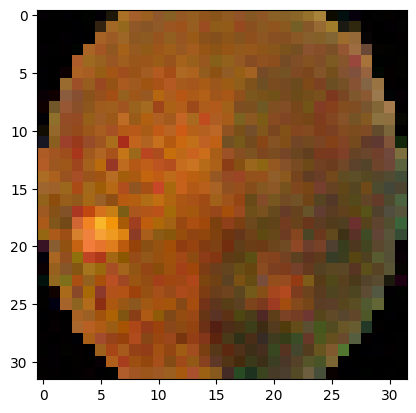

In [ ]:
plt.imshow(generator.predict(np.random.randn(1, 128))[0])

In [ ]:
# Generating and Saving AMD Images
noise = np.random.randn(20, 128)
imgs = generator.predict(noise)
for i, image in enumerate(imgs):
    img = Image.fromarray((255 * image).astype(np.uint8))
    img.save(f'gan_images/GAN_Generated_{i}.png')

In [ ]:
!zip -r 'generated_CNVM.zip' '/content/gan_images'

  adding: content/gan_images/ (stored 0%)
  adding: content/gan_images/GAN_Generated_11.png (stored 0%)
  adding: content/gan_images/GAN_Generated_4.png (stored 0%)
  adding: content/gan_images/GAN_Generated_6.png (stored 0%)
  adding: content/gan_images/GAN_Generated_12.png (stored 0%)
  adding: content/gan_images/GAN_Generated_19.png (stored 0%)
  adding: content/gan_images/GAN_Generated_7.png (stored 0%)
  adding: content/gan_images/GAN_Generated_1.png (stored 0%)
  adding: content/gan_images/GAN_Generated_3.png (stored 0%)
  adding: content/gan_images/GAN_Generated_9.png (stored 0%)
  adding: content/gan_images/GAN_Generated_17.png (stored 0%)
  adding: content/gan_images/GAN_Generated_16.png (stored 0%)
  adding: content/gan_images/GAN_Generated_8.png (stored 0%)
  adding: content/gan_images/GAN_Generated_15.png (stored 0%)
  adding: content/gan_images/GAN_Generated_10.png (stored 0%)
  adding: content/gan_images/GAN_Generated_13.png (stored 0%)
  adding: content/gan_images/GAN_Ge

# Spatial Attention Maps

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def apply_spatial_attention(input_image, label_image):
    # Reshape the input image and label image to have the same shape
    input_image = cv2.resize(input_image, (label_image.shape[1], label_image.shape[0]))
    label_image = cv2.resize(label_image, (input_image.shape[1], input_image.shape[0]))

    # Convert the label image to a binary mask
    label_mask = label_image > 0

    # Create a grayscale version of the input image
    gray_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply the label mask to the grayscale image
    masked_image = np.where(label_mask, gray_image, 0)

    # Resize the masked image to match the input image shape
    masked_image = cv2.resize(masked_image, (input_image.shape[1], input_image.shape[0]))

    # Highlight the masked regions in the input image
    output_image = input_image.copy()
    masked_image_rgb = cv2.cvtColor(masked_image, cv2.COLOR_GRAY2BGR)
    output_image[label_mask] = cv2.addWeighted(input_image, 0.5, masked_image_rgb, 0.5, 0)[label_mask]

    return output_image

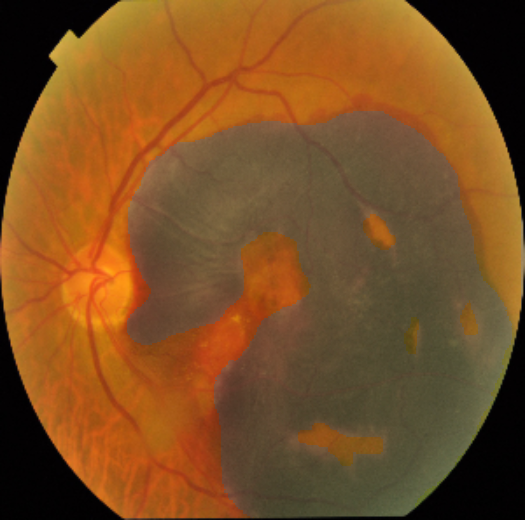

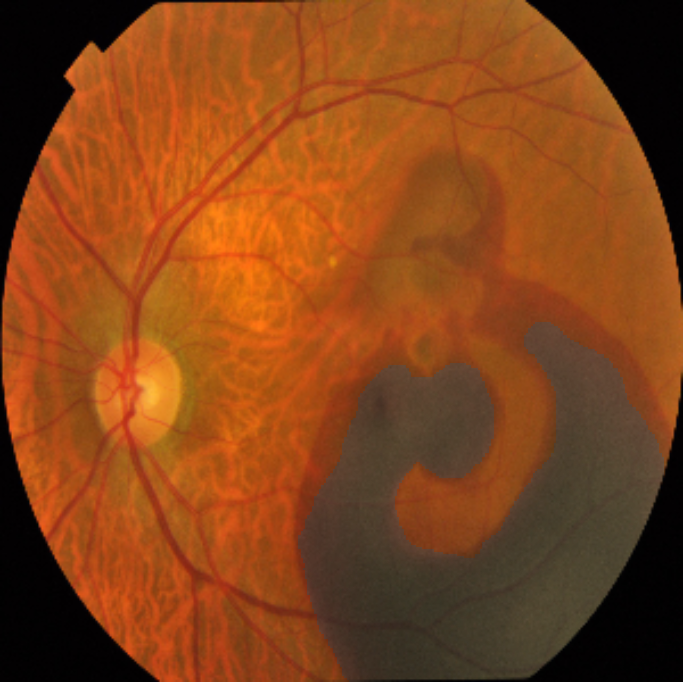

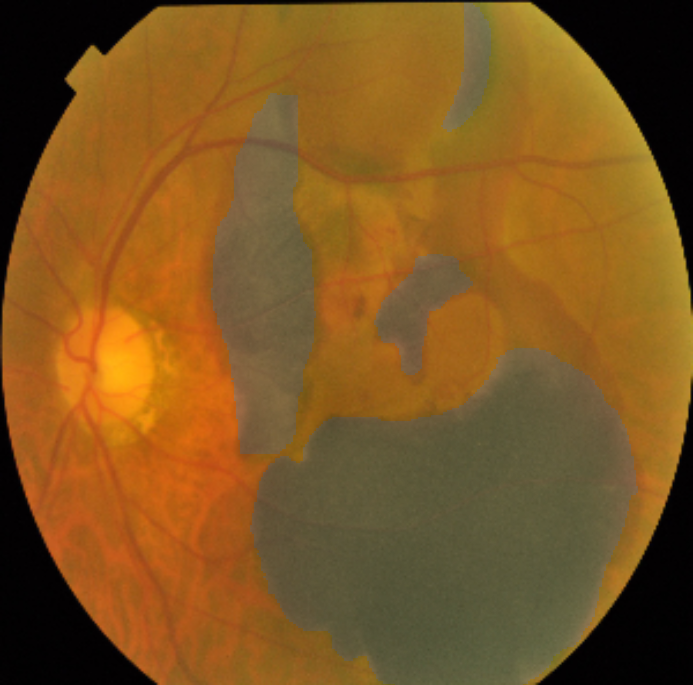

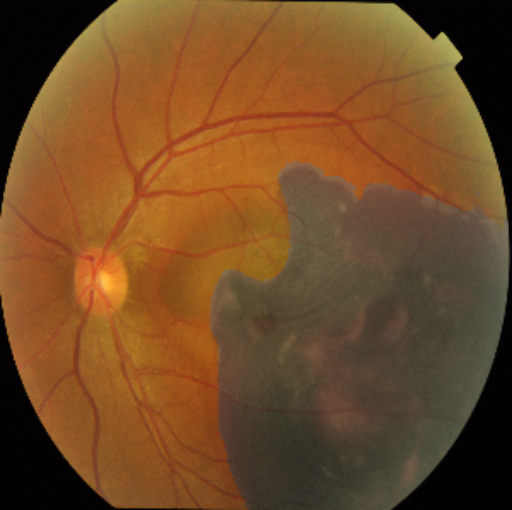

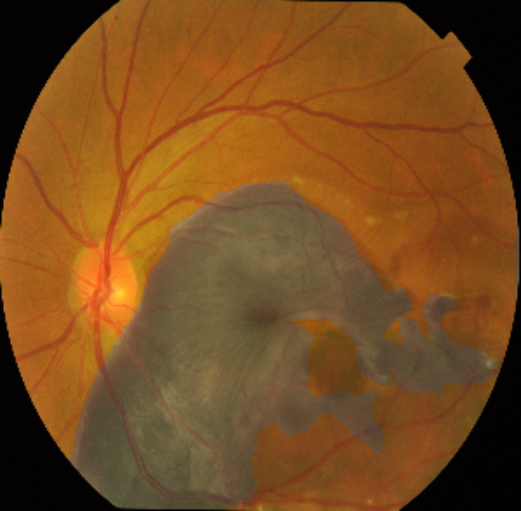

...

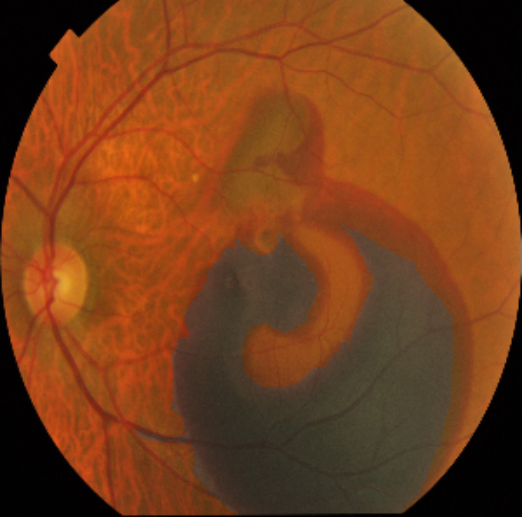

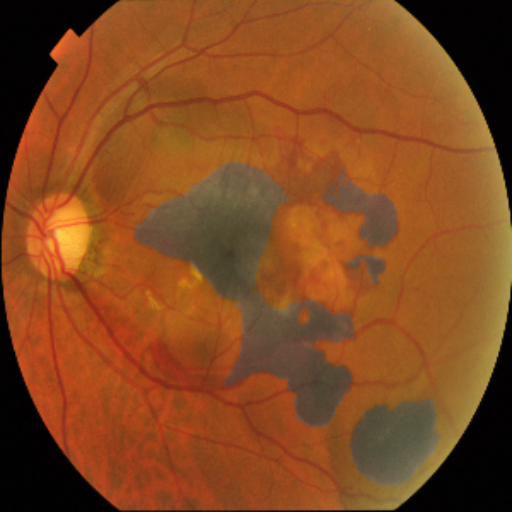

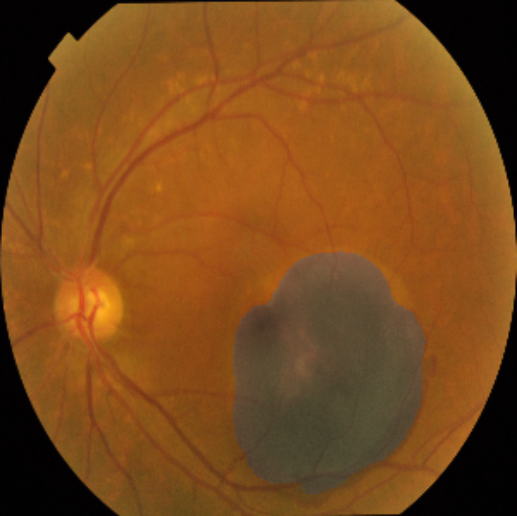

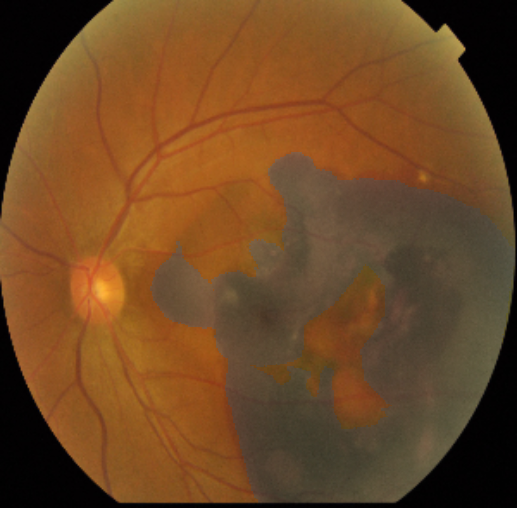

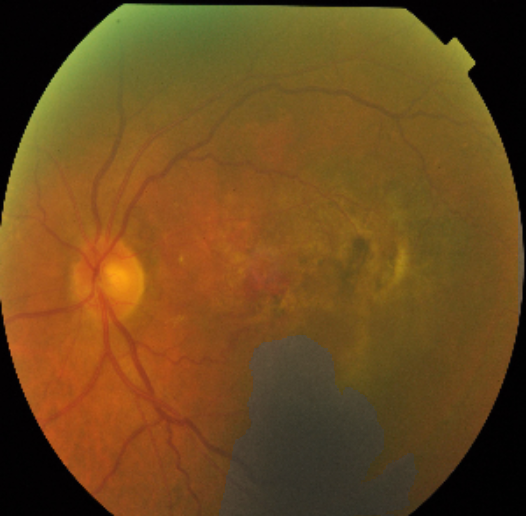

In [ ]:
images_path = '/content/CNVM'
labels_path = '/content/CNVM_Labels'
images = []
for filename in os.listdir(images_path):
    img_path = os.path.join(images_path, filename)
    label_path = os.path.join(labels_path, filename)
    input_image = cv2.imread(img_path)
    label_image = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    output_image = apply_spatial_attention(input_image, label_image)
    cv2_imshow(output_image)